Analysis on segmented smFISH dataset May 2017

TODO  

* Look into cutoffs. Do they make sense, do they need to be different? then run everything again
* Repeat all the plots with the clusters (cell size, count etc)
* For each cell find a way to see how good it fits to its cluster. (similarity to the mean cell?)
* For each cell find the similarity with the other clusters (find doublets)
* Is there an relationship between doublets and cell size?
* Size correction of cells
* If clusterd on the fold change data, the clusters are very clear, but a third of the cells cluster together because they have low gene expression
    - If we want to say something about gene expression per cluster, maybe we should do that on this clustering and discard the 'bad cells'
    - Look at how uniform expression is, are there expression level differences. etc.
* Look into functions Cell Profiler. that is in python 

In [1]:
import loompy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
plt.rcParams.update({'figure.max_open_warning': 150})
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
import pickle
import scipy.stats as stats
from mpl_toolkits.axes_grid1 import make_axes_locatable

from fastcluster import linkage
import polo # 
from polo import optimal_leaf_ordering #from polo import polo
#Paper: http://bioinformatics.oxfordjournals.org/content/17/suppl_1/S22.long

from scipy.spatial.distance import pdist

from scipy.cluster import hierarchy
from collections import Counter

import cytograph
%matplotlib notebook

# Open, clean and transform file

In [2]:
file_name = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'
ds = loompy.connect(file_name)
ds

,CellArea,23939.0,13532.0,28819.0,40777.0,16303.0,9065.0,23155.0,44564.0,18963.0,19373.0,...
,CellID,1124,2325,2400,241,6248,5992,275,2573,330,1149,...
genes,,,,,,,,,,,,...
Hybridization1_Tbr1,,13.0,11.0,28.0,12.0,7.0,6.0,14.0,24.0,5.0,3.0,...
Hybridization1_Aldoc,,38.0,0.0,9.0,5.0,38.0,2.0,4.0,3.0,7.0,10.0,...
Hybridization1_Foxj1,,0.0,0.0,0.0,1.0,5.0,0.0,3.0,1.0,1.0,1.0,...
Hybridization6_Bmp4,,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...
Hybridization6_Itpr2,,4.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,1.0,...
Hybridization6_Vip,,13.0,1.0,2.0,4.0,30.0,1.0,3.0,2.0,1.0,4.0,...
Hybridization4_Cnr1,,0.0,0.0,0.0,0.0,65.0,5.0,0.0,0.0,0.0,0.0,...
Hybridization4_Plp1,,16.0,0.0,0.0,0.0,8.0,0.0,0.0,6.0,0.0,0.0,...


In [3]:
cell_size = dict(zip(ds.CellID, ds.CellArea))

In [4]:
#Cell area to square um
(np.sqrt(ds.CellArea)*0.065)**2
print('Low cutoff: ',(np.sqrt(2000)*0.065)**2, ' square um')
print('High cutoff: ',(np.sqrt(60000)*0.065)**2, ' square um')
print('A 10um diameter is an area of {}um2'.format(round(np.pi*5**2,1)))

Low cutoff:  8.45  square um
High cutoff:  253.5  square um
A 10um diameter is an area of 78.5um2


<IPython.core.display.Javascript object>


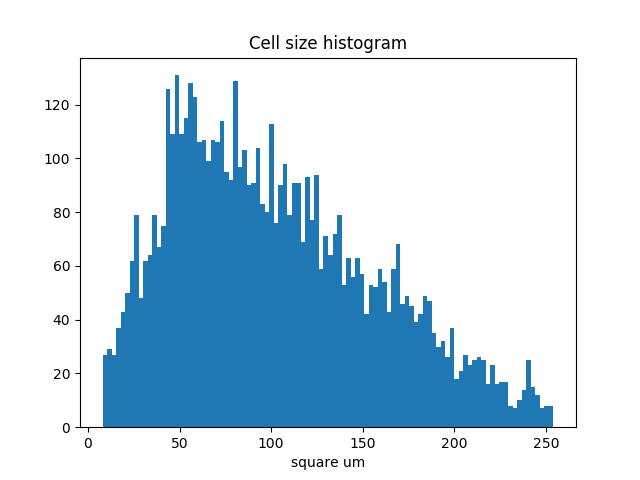

In [5]:
#Plot cell size
plt.figure()
    #In number  of pixels
#plt.hist(ds.CellArea, bins=100, range=[2000,80000])
    #In Square um
plt.hist((np.sqrt(ds.CellArea)*0.065)**2, bins=100, range=[8,254])

plt.xlabel('square um')
plt.title('Cell size histogram');

<IPython.core.display.Javascript object>


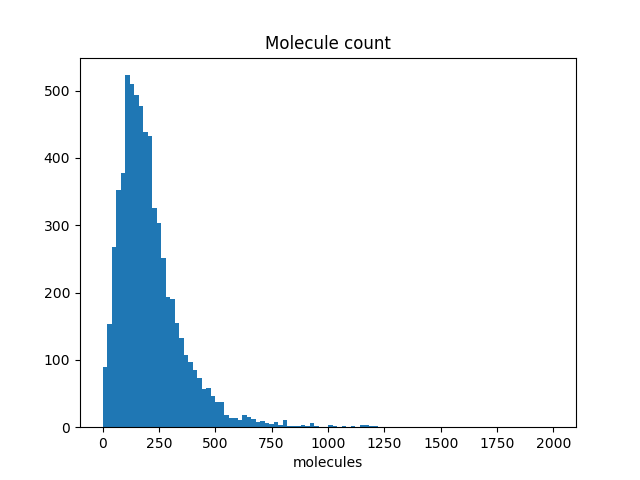

In [6]:
#Plot molecule count
plt.figure()
df_mol_count=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
plt.hist(df_mol_count.sum(axis=0), bins=100, range=[0,2000])
plt.xlabel('molecules')
plt.title('Molecule count')

<IPython.core.display.Javascript object>


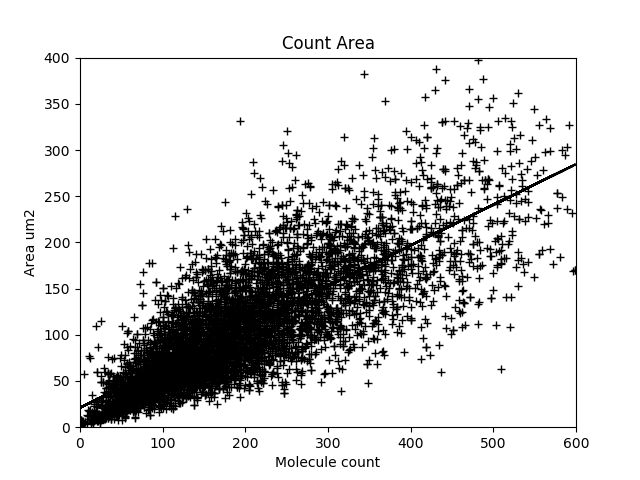

Formula:  
0.4395 x + 20.98


In [7]:
plt.figure()
mol_count = df_mol_count.sum(axis=0)
area = (np.sqrt(ds.CellArea)*0.065)**2

count_area = list(zip(mol_count, area))
#Select only cells with count<600 and area<400
count_area = [x for x in count_area if x[0]<600 and x[1]<400]

mol_count = [item[0] for item in count_area]
area = [item[1] for item in count_area]

fit = np.polyfit(mol_count, area, 1)
fit_fn = np.poly1d(fit)

plt.plot(mol_count, area, 'k+', mol_count, fit_fn(mol_count), '--k')

plt.xlabel('Molecule count')
plt.xlim(xmin=0, xmax=600)
plt.ylabel('Area um2')
plt.ylim(ymin=0, ymax=400)
plt.title('Count Area')

print('Formula: {}'.format(fit_fn))

<IPython.core.display.Javascript object>


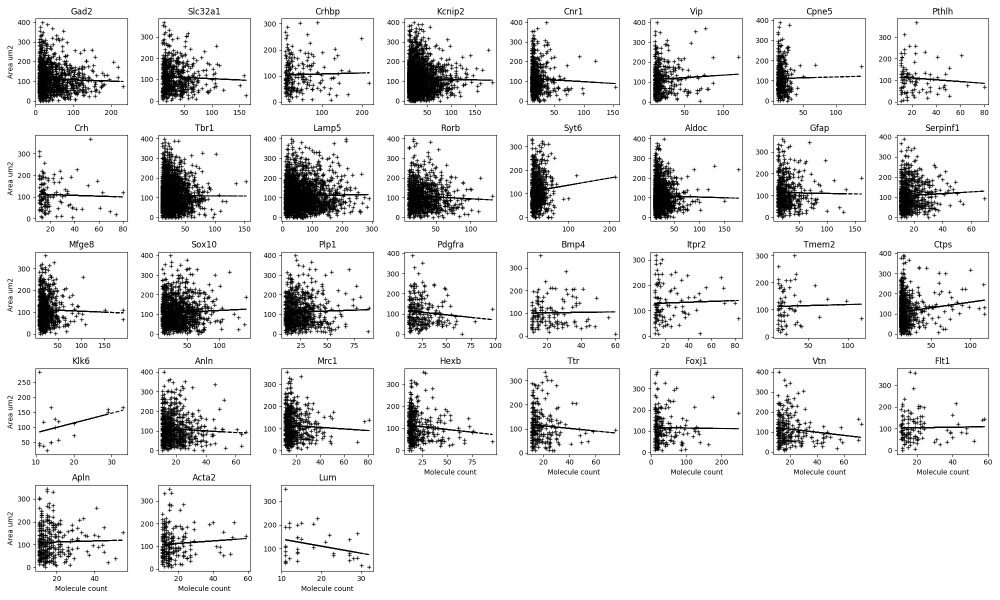

In [12]:
plt.figure(figsize=(20,12))
gs = plt.GridSpec(5,8)

area = (np.sqrt(ds.CellArea)*0.065)**2

for i, gene in enumerate(gene_sort_fish):
    plt.subplot(gs[i])
    count_area = list(zip(df_fish.loc[gene], area))
    #Select only cells with count<600 and area<400
    count_area = [x for x in count_area if 10<x[0]<600 and x[1]<400]

    mol_count = [item[0] for item in count_area]
    area_select = [item[1] for item in count_area]

    fit = np.polyfit(mol_count, area_select, 1)
    fit_fn = np.poly1d(fit)

    plt.plot(mol_count, area_select, 'k+', mol_count, fit_fn(mol_count), '--k')
    
    if i in range(len(gene_sort_fish)-8,len(gene_sort_fish)):
        plt.xlabel('Molecule count')
    #plt.xlim(xmin=0, xmax=600)
    if i%8 ==0:
        plt.ylabel('Area um2')
    #if i in range(8):
    plt.title(gene.split('_')[1])
    #plt.ylim(ymin=0, ymax=400)
    
plt.tight_layout()

In [9]:
def loompy2data(filename, cutoff_low, cutoff_high, molecules_low):
    """
    Loom file to Panda's dataframe. Perform size and count selection on cells
    Input:
    `filename`(str): Name and path tot the Loom file
    `cutoff_low`(flt): Minimal cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `cutoff_high`(flt): Max cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `molecules_low`(int): Minimal number of molecules
    Returns:
    Panda's dataframe with cells that passed the criteria. df has cell label as column name. 
    Some gene names are corrected
    Metadata is discarded. 
    
    """
    #Read loom file and import to Pandas df
    ds = loompy.connect(filename)
    df=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
    
    #Filter cell size
    for i, j in enumerate(ds.col_attrs['CellID']):
        if ds.col_attrs['CellArea'][i] < cutoff_low or ds.col_attrs['CellArea'][i] > cutoff_high:
            del df[j]
    
    #Filter total molecule count
    for i, j in enumerate(ds.col_attrs['CellID']):
        try: #not all 'CellID' are still present
            if df[j].sum() < molecules_low:
                del df[j]
        except Exception:
            pass
        
    #Filter bad hybridiztion4 (out of focus imaging) and repeat Tbr1
    bad_data = ['Hybridization4_Cnr1', 'Hybridization4_Plp1', 'Hybridization4_Vtn', 'Hybridization11_Tbr1']
    for i in bad_data:
        df.drop(i, inplace=True)
     
    #Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
    df= df.rename({'Hybridization11_Tmem6': 'Hybridization11_Tmem2', 'Hybridization12_Kcnip': 'Hybridization12_Kcnip2'})
    
    print('Selected cells with  {}>size<{} and a minimum molecule count of {} molecules'.format(cutoff_low, cutoff_high, molecules_low))
    print('Change incorrect names Tmem6-->Tmem2 and Kcnip-->2')
    return df

    
df_fish = loompy2data(file_name,2000, 60000, 20)
df_fish.shape

Selected cells with  2000>size<60000 and a minimum molecule count of 20 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->2


(35, 6036)

In [10]:
df_fish.head(5)

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,5162,532,3607,3251,7173,2757,1228,1234,7797,4653
Hybridization1_Tbr1,13,11,28,12,7,6,14,24,5,3,...,57,20,26,8,5,5,0,14,18,5
Hybridization1_Aldoc,38,0,9,5,38,2,4,3,7,10,...,11,10,5,4,10,2,0,2,2,9
Hybridization1_Foxj1,0,0,0,1,5,0,3,1,1,1,...,0,0,0,2,1,8,1,2,0,4
Hybridization6_Bmp4,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0
Hybridization6_Itpr2,4,0,0,1,0,0,1,0,2,1,...,3,0,1,2,3,0,0,0,0,0


In [11]:
gene_sort = ['Gad2', 'Slc32a1', 'Crhbp', 'Kcnip2', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Klk6', 'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2',  'Lum'] 

gene_sort_wrong = ['Gad2', 'Slc32a1', 'Crhbp', 'Kcnip', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh', 
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem6',  'Ctps',  'Klk6', 'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2',  'Lum'] 


gene_sort_fish = ['Hybridization2_Gad2', 'Hybridization12_Slc32a1', 'Hybridization10_Crhbp', 'Hybridization12_Kcnip2', 'Hybridization13_Cnr1', 'Hybridization6_Vip', 'Hybridization5_Cpne5', 'Hybridization8_Pthlh',  'Hybridization10_Crh', 
'Hybridization1_Tbr1', 'Hybridization9_Lamp5', 'Hybridization7_Rorb', 'Hybridization11_Syt6',
'Hybridization1_Aldoc', 'Hybridization2_Gfap', 'Hybridization8_Serpinf1', 'Hybridization3_Mfge8',
 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization8_Pdgfra', 'Hybridization6_Bmp4','Hybridization6_Itpr2','Hybridization11_Tmem2', 'Hybridization7_Ctps','Hybridization5_Klk6','Hybridization9_Anln',
 'Hybridization3_Mrc1','Hybridization3_Hexb', 
 'Hybridization13_Ttr',
 'Hybridization1_Foxj1',
 'Hybridization12_Vtn',
 'Hybridization2_Flt1',
 'Hybridization10_Apln',
 'Hybridization5_Acta2',
 'Hybridization9_Lum']


#Make conversion dictionary with gene names and corresponding HybridizationX_geneY names

gene_name_conversion = {}

for i in gene_sort:
    for j in df_fish.index:
        if j.endswith(i):
            gene_name_conversion[j] =i
            
gene_name_conversion_reverse = dict((v,k) for k,v in gene_name_conversion.items())
            
#There are two mistakes in the gene names, correct for them in the dict
#gene_name_conversion['Hybridization11_Tmem6'] = 'Tmem2'
#gene_name_conversion['Hybridization12_Kcnip'] = 'Kcnip2'

# Cell properties

In [14]:
#Open object properties
obj_prop = pickle.load(open("ObjProp_dict.pkl", 'rb'))

#Load cell ID and XY coordinates into a list
coord_list = []
for i in obj_prop:
    coord_list.append([i, obj_prop[i]['obj_centroid'][0], obj_prop[i]['obj_centroid'][1]])
    
#Place cell ID and X and Y coordinates into dataframe
coord_df = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T
coord_df = coord_df.loc[:,df_fish.columns]

<IPython.core.display.Javascript object>


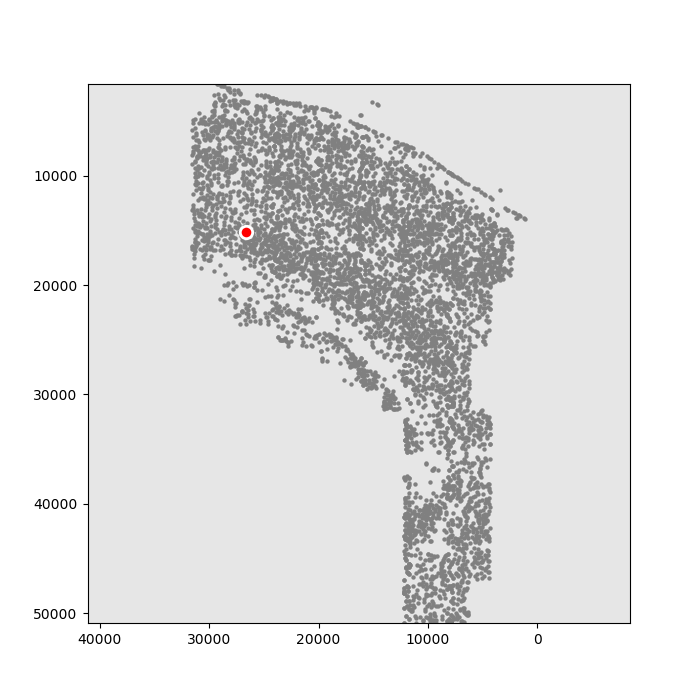

In [16]:
def plot_cell_pos(coordinate_df, cell_ids=None, cell_of_interest=None, color='gray', color_highlight1='r', color_highlight2='r', s=5, standalone = True, mode='Highlight'):
    """
    Plot the centroids of all cells in grey. A selection of cells can be made red.
    And one cell of interest can be shown larger with a white border around.
    Input:
    `coordinate_df`(pd df): Pandas df with cells in columns, and 'X' & 'Y' as rows.
    `cell_ids`(list): If selection of cells to plot, enter a list of cell ids. Default = None
    `color`(str): color of cells, default gray
    `s`(float): Size of dots. Default = 5
    `stanalone`(bool): If true it creates a figure. If false it can be used as subplot
    `mode`(str): if 'highlight' it is possible to highlight a group of cells and/or one cell
    `color_highlight1`: color of group of cells. default='r' 
    `color_highlight2`: color of single cells. default='r'
    
    """
    if standalone == True:
        plt.figure(figsize=(7,7))
        
    if mode.lower() == 'tsne':
        plt.scatter(coordinate_df.loc['X',:], coordinate_df.loc['Y',:], linewidths=0, c=color, s=s)
    
    if mode.lower() == 'highlight':
        plt.scatter(coordinate_df.loc['X',:], coordinate_df.loc['Y',:], linewidths=0, c=color, s=s)
        if cell_ids != None:
            plt.scatter(coordinate_df.loc[:,cell_ids].loc['X'], coordinate_df.loc[:,cell_ids].loc['Y'], color=color_highlight1, s=s*2)
        if cell_of_interest != None:
            plt.scatter(coordinate_df.loc[:,cell_of_interest][0], coordinate_df.loc[:,cell_of_interest][1], color=color_highlight2, s=s*8, lw=2, edgecolor='w')
    plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()
    plt.gca().axis('equal')
    plt.xlim([coordinate_df.loc['X'].max(), coordinate_df.loc['X'].min()])
    plt.ylim([coordinate_df.loc['Y'].max(), coordinate_df.loc['Y'].min()])
    plt.gca().patch.set_facecolor((.9,.9,.9))
    
plot_cell_pos(coord_df, cell_ids=None, cell_of_interest='7442', s=10, standalone=True, mode='Highlight')

# Gene expression

## Normalization of data

In [16]:
#Normalization on unsorted dataset
#Transform data
X = df_fish.values.astype(np.float64)
    #Sqrt normalize
X_sqrt = np.sqrt(X)
    #Mean normalize
X_norm = X.sum(0).mean() * (X/X.sum(0))
    #Log transform
X_log = np.log2(X_norm+1)
    #Build dataframes of normalized and log transformed data
df_fish_sqrt = pd.DataFrame(data=X_sqrt, columns=df_fish.columns, index=df_fish.index)
df_fish_norm=pd.DataFrame(data=X_norm, columns=df_fish.columns, index=df_fish.index)
df_fish_log=pd.DataFrame(data=X_log, columns=df_fish.columns, index=df_fish.index)

#Calculate the fold change dataframe
df_fish_fc = df_fish.loc[gene_sort_fish,:]
mean_expression =  df_fish.loc[gene_sort_fish,:].T.mean()
df_fish_fc = df_fish_fc.divide(mean_expression, axis='rows')

X_fc = df_fish_fc.values

In [248]:
#Same but with sorted gene list df_fish

df_fish = df_fish.loc[gene_sort_fish,:]

#Transform data
X = df_fish.values.astype(np.float64)
    #Sqrt normalize
X_sqrt = np.sqrt(X)
    #Mean normalize
X_norm = X.sum(0).mean() * (X/X.sum(0))
    #Log transform
X_log = np.log2(X_norm+1)

    #Build dataframes of normalized and log transformed data
df_fish_sqrt = pd.DataFrame(data=X_sqrt, columns=df_fish.columns, index=df_fish.index)
df_fish_norm = pd.DataFrame(data=X_norm, columns=df_fish.columns, index=df_fish.index)
df_fish_log = pd.DataFrame(data=X_log, columns=df_fish.columns, index=df_fish.index)

#Devide by size
area_df_fish = np.array([(np.sqrt(obj_prop[c]['obj_area'])*0.065)**2 for c in df_fish.columns])
X_size = X/area_df_fish
    #Sqrt normalize
X_size_sqrt = np.sqrt(X_size)
    #Mean normalize
X_size_norm = X_size.sum(0).mean() * (X_size/X_size.sum(0))
    #Log transform
X_size_log = np.log2(X_size_norm+1)

    #Build dataframes of normalized and log transformed data
df_fish_size_sqrt = pd.DataFrame(data=X_size_sqrt, columns=df_fish.columns, index=df_fish.index)
df_fish_size_norm = pd.DataFrame(data=X_size_norm, columns=df_fish.columns, index=df_fish.index)
df_fish_size_log = pd.DataFrame(data=X_size_log, columns=df_fish.columns, index=df_fish.index)


#Calculate the fold change dataframe
df_fish_fc = df_fish.loc[gene_sort_fish,:]
mean_expression_for_fc =  df_fish.loc[gene_sort_fish,:].T.mean()
df_fish_fc = df_fish_fc.divide(mean_expression_for_fc, axis='rows')

X_fc = df_fish_fc.values

In [36]:
area_df_fish = np.array([(np.sqrt(obj_prop[c]['obj_area'])*0.065)**2 for c in df_fish.columns])
area_df_fish.shape

(6036,)

In [30]:
obj_prop[df_fish.columns[1]]['obj_area']

13532

In [37]:
area = (np.sqrt(ds.CellArea)*0.065)**2
X/area_df_fish

array([[ 0.06920944,  0.06996346,  0.02463858, ...,  0.13433673,
         0.08176637,  0.07520582],
       [ 0.01977413,  0.01749087,  0.01642572, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.01977413,  0.        ,  0.00821286, ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [ 0.02966119,  0.08745433,  0.01642572, ...,  0.04477891,
         0.13627729,  0.00683689],
       [ 0.02966119,  0.01749087,  0.00821286, ...,  0.05970521,
         0.02725546,  0.        ],
       [ 0.00988706,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

## Add featrues

Does not enhance the data so much

In [1416]:
major_type_markers = ['Hybridization12_Slc32a1',
                     'Hybridization1_Tbr1',
                      'Hybridization7_Sox10',
                      'Hybridization1_Aldoc',
                      'Hybridization3_Hexb',
                      'Hybridization3_Mrc1',
                      'Hybridization1_Foxj1',
                      'Hybridization12_Vtn',
                      'Hybridization2_Flt1',
                      'Hybridization5_Acta2',
                      'Hybridization9_Lum']

In [1471]:
#Using the mean corrected and Log normalized data
#Multiply the major markers with all the other genes to enhance the profile.

df_fish_addfeature = df_fish_log

for i in major_type_markers:
    for j in gene_sort_fish:
        if i != j: 
            name_new = i.split('_')[1] + '_' + j.split('_')[1]
            data = pd.Series(df_fish_log.loc[i] * df_fish_log.loc[j], name=name_new)
            df_fish_addfeature = df_fish_addfeature.append(data)


## Add location

In [1522]:
df_fish_location = df_fish_log

df_fish_location = df_fish_location.append(coord_df.loc['X']/10000)
df_fish_location = df_fish_location.append(coord_df.loc['Y']/10000)

## Visualizing gene expression

<IPython.core.display.Javascript object>


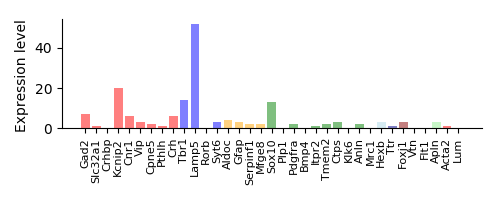

In [367]:
def plot_cell_expression(cell, dataset='Count', save=False):
    """
    Plot the expression levels of all genes (except round 4 genes).
    Possible to select counts, normalized or log-normalized data
    Input:
    `cell`(str): Cell name, like: '100'
    `data_format`(str): Choose the dataset.
        'None' will give the count data
        'Norm' will give normalized data
        'Log' will give log-normalized data
    
    """
    try:
        df_fish[cell]
        
        fig, ax = plt.subplots(figsize=[5,2])
        if dataset == None or dataset.lower() == 'count':
            expression_data = df_fish.loc[gene_sort_fish,:][cell]
            mean = True, df_fish.loc[gene_sort_fish,:].T.mean()
            y_label = ''
        elif dataset.lower() == 'norm':
            expression_data = df_fish_norm.loc[gene_sort_fish,:][cell]
            mean = True, df_fish_norm.loc[gene_sort_fish,:].T.mean()
            y_label = 'Normalized'
        elif dataset.lower() == 'log':
            expression_data = df_fish_log.loc[gene_sort_fish,:][cell]
            mean = True, df_fish_log.loc[gene_sort_fish,:].T.mean()
            y_label = 'Log-Normalized'
        elif dataset.lower() == 'fc': 
            expression_data = df_fish.loc[gene_sort_fish,:][cell] / df_fish.loc[gene_sort_fish,:].T.mean()
            mean = False, 0.5
            y_label = 'Fold Change'
        else:
            return ('Error incorrect dataset: {}, Choose "Count", "log" or "fc"'.format(dataset))
        
        #Plot expression data
        left_pos = np.arange(len(expression_data))
        gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
        'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green',
        'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
        ax.bar(left_pos, list(expression_data), color=gene_colors, alpha=0.5)
        
        '''
        #Plot mean expression level (count/norm/log, not FoldChange)
        if mean[0] == True:
            for i, m in enumerate(mean[1]):
                ax.axhline(m, xmin=i/len(mean[1]), xmax=(i+1)/len(mean[1]), color='grey')
        else:
            ax.axhline(1, color='grey')
'''

        labels = [i.split('_')[1] for i in list(expression_data.index)]
        ax.set_xticks(left_pos)
        ax.set_xticklabels(labels, rotation='vertical', fontsize=8)
        ax.set_xlabel
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.set_ylabel('Expression level {}'.format(y_label))
        #ax.set_title('Data: {}'.format(dataset))
        
        plt.tight_layout()
        if save == True:
            plt.savefig('/home/lars/storage/Documents/Cortex_FISH/cell_expression/{}.png'.format(cell))
    
        
    except KeyError as e:
        print('KeyError: Cell {} not in df, maybe cell is removed in quality clean up'.format(e))

    


plot_cell_expression(df_fish.columns[6], 'count', save=True)

<IPython.core.display.Javascript object>


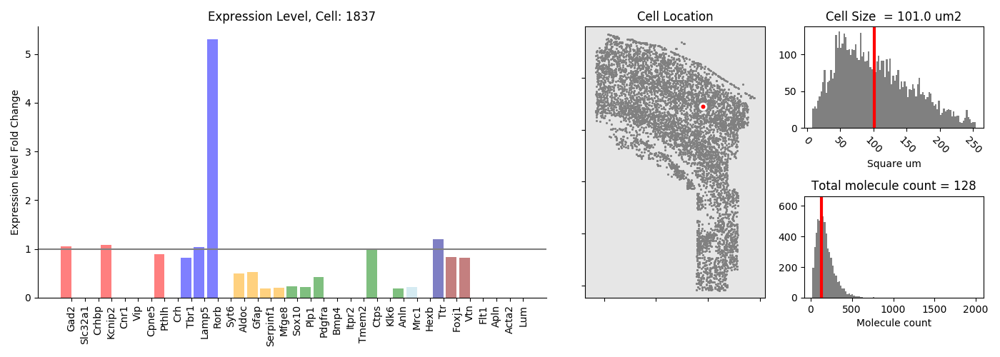

In [22]:
def cell_info(cell, dataset='Count'):
    """
    Plot expression level, location, size, 
    
    """
    try:
        df_fish[cell]
    except KeyError as e:
        print('KeyError: Cell {} not in df_fish, maybe cell is removed in quality clean up'.format(e))
        return

    plt.figure(figsize=(14,5))
    ax1 = plt.subplot2grid((2,9), (0,0), rowspan=2, colspan=5)
    if dataset.lower() == 'count':
        expression_data = df_fish.loc[gene_sort_fish,:][cell]
        mean = True, df_fish.loc[gene_sort_fish,:].T.mean()
        dataset_label = ''
    elif dataset.lower() == 'norm':
        expression_data = df_fish_norm.loc[gene_sort_fish,:][cell]
        mean = True, df_fish_norm.loc[gene_sort_fish,:].T.mean()
        dataset_label = 'Normalized'
    elif dataset.lower() == 'log':
        expression_data = df_fish_log.loc[gene_sort_fish,:][cell]
        mean = True, df_fish_log.loc[gene_sort_fish,:].T.mean()
        dataset_label = '(Log Normalized)'
    elif dataset.lower() == 'fc': 
        expression_data = df_fish.loc[gene_sort_fish,:][cell] / df_fish.loc[gene_sort_fish,:].T.mean()
        mean = False, 0.5
        dataset_label = 'Fold Change'    
    else:
        return ('Error incorrect dataset: {}, Choose "Count", "Norm", "log" or "fc"'.format(dataset))
    
    #Plot expression data
    left_pos = np.arange(len(expression_data))
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
    'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green',
    'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
    ax1.bar(left_pos, list(expression_data), color=gene_colors, alpha=0.5)
    
    #Plot mean expression level (count/norm/log, not FoldChange)
    if mean[0] == True:
        for i, m in enumerate(mean[1]):
            ax1.axhline(m, xmin=i/len(mean[1]), xmax=(i+1)/len(mean[1]), color='grey')
    else:
        ax1.axhline(1, color='grey')


    labels = [i.split('_')[1] for i in list(expression_data.index)]
    ax1.set_xticks(left_pos+0.4)
    ax1.set_xticklabels(labels, rotation='vertical')
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax1.yaxis.set_ticks_position('left')
    ax1.xaxis.set_ticks_position('bottom')
    ax1.set_ylabel('Expression level ' + dataset_label)
    ax1.set_title('Expression Level, Cell: {}'.format(cell))
    

    ax2 = plt.subplot2grid((2,9), (0,5), rowspan=2, colspan=2)
    plt.sca(ax2)
    plot_cell_pos(coord_df, cell_ids=None, cell_of_interest=cell, s=5, standalone=False)
    for tl in ax2.get_xticklabels() + ax2.get_yticklabels():
                tl.set_visible(False)
    ax2.set_title('Cell Location')

    ax3 = plt.subplot2grid((2,9), (0,7), rowspan=1, colspan=2)
    ax3.hist((np.sqrt(ds.CellArea)*0.065)**2, bins=100, range=[8,254], color='grey')
    plt.xticks(rotation=-45)
    cell_size = float((np.sqrt(ds.CellArea[np.where(ds.CellID=='1124')])*0.065)**2)
    plt.axvline(cell_size, color='r', linewidth=3)
    ax3.set_title('Cell Size  = {} um2'.format(np.round(cell_size)))
    ax3.set_xlabel('Square um')

    ax4 = plt.subplot2grid((2,9), (1,7), rowspan=1, colspan=2)
    ax4.hist(df_fish.sum(axis=0), bins=100, range=[20,2000], color='grey');
    plt.axvline(df_fish.loc[:,cell].sum(), color='r', linewidth=3)
    ax4.set_title('Total molecule count = {}'.format(df_fish.loc[:,cell].sum()))
    ax4.set_xlabel('Molecule count')

    plt.tight_layout()

cell_n = 1040
cell_info(df_fish.columns[cell_n], 'fc')

<IPython.core.display.Javascript object>


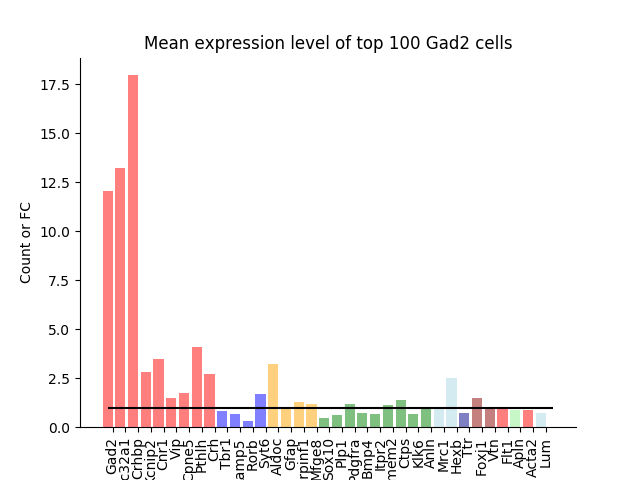

<IPython.core.display.Javascript object>


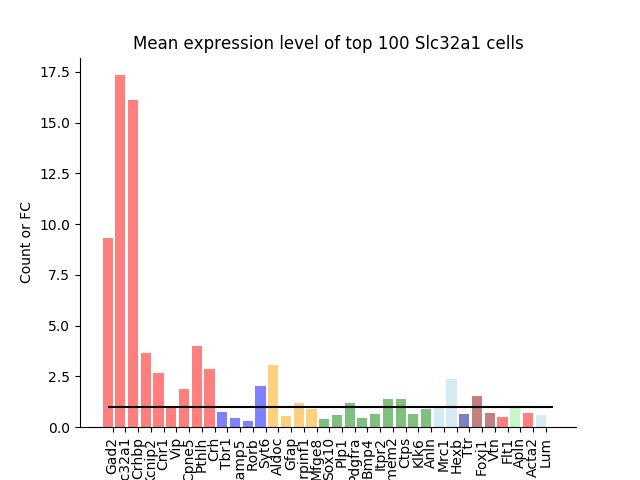

<IPython.core.display.Javascript object>


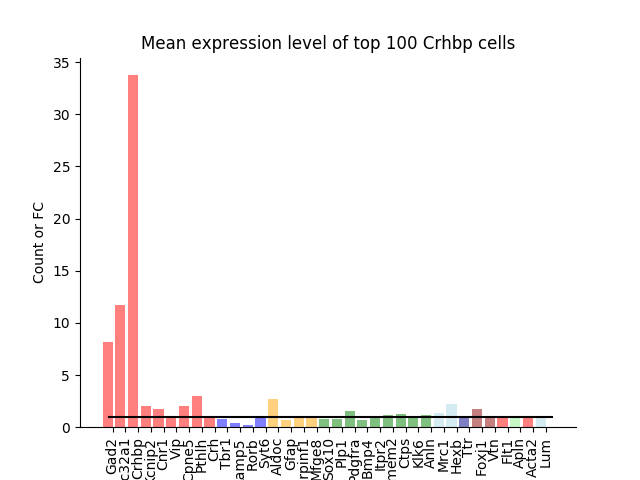

<IPython.core.display.Javascript object>


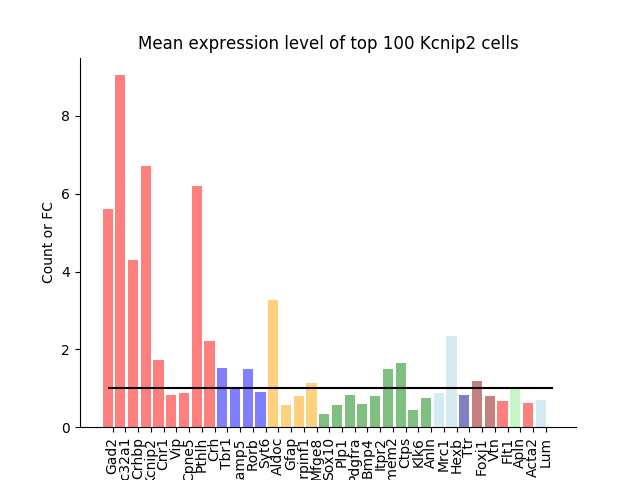

<IPython.core.display.Javascript object>


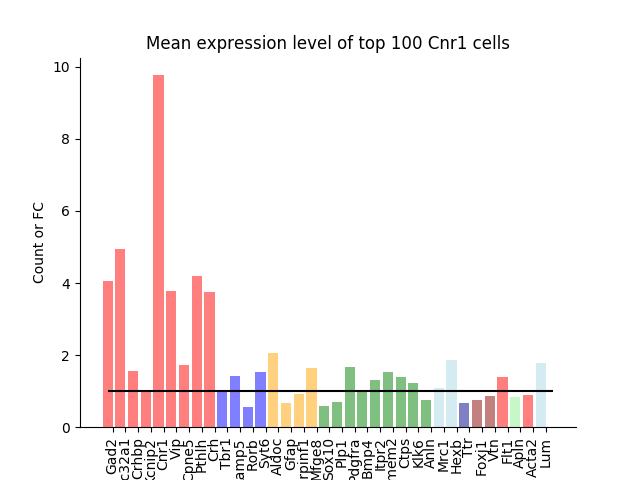

<IPython.core.display.Javascript object>


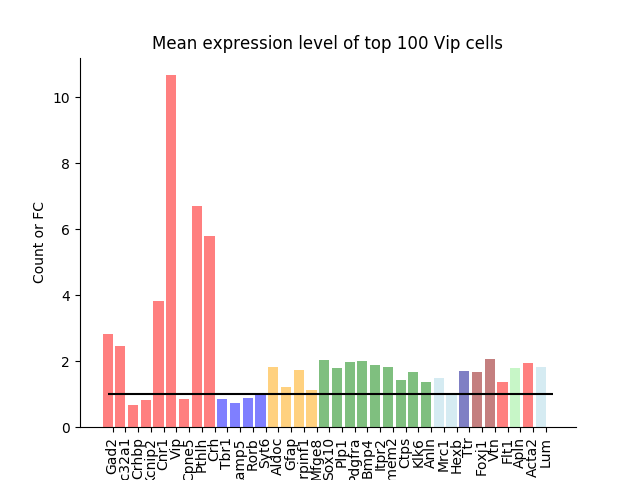

<IPython.core.display.Javascript object>


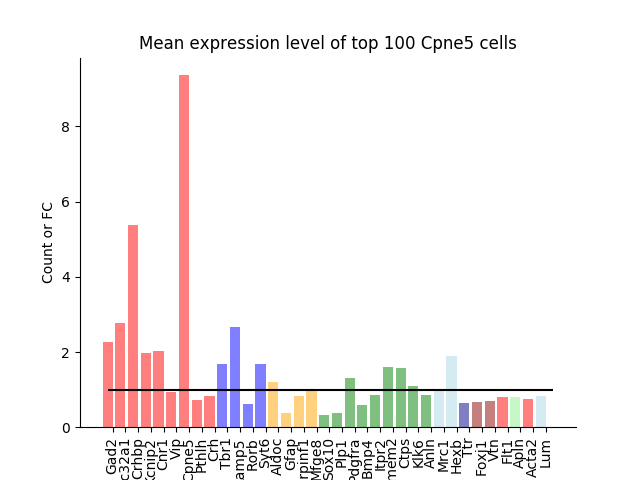

<IPython.core.display.Javascript object>


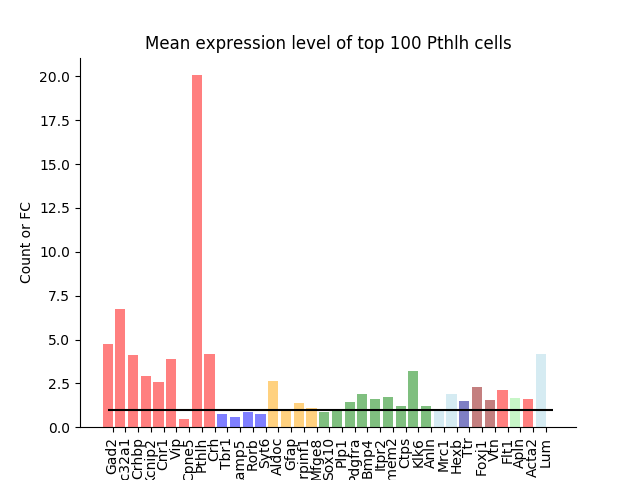

<IPython.core.display.Javascript object>


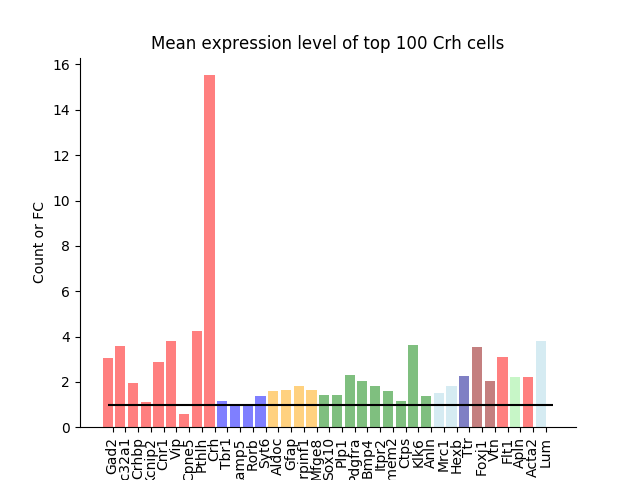

<IPython.core.display.Javascript object>


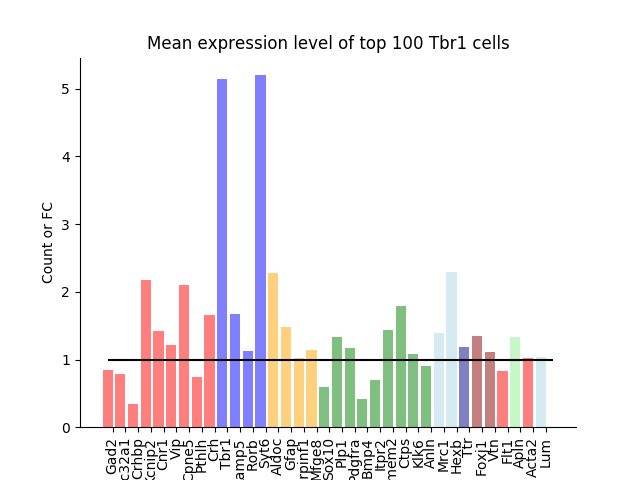

<IPython.core.display.Javascript object>


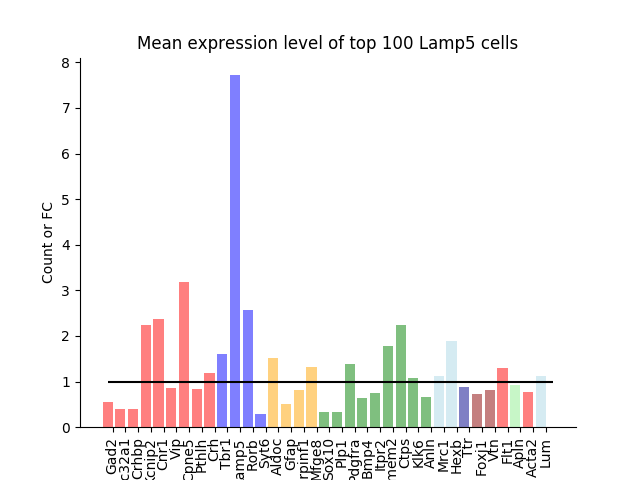

<IPython.core.display.Javascript object>


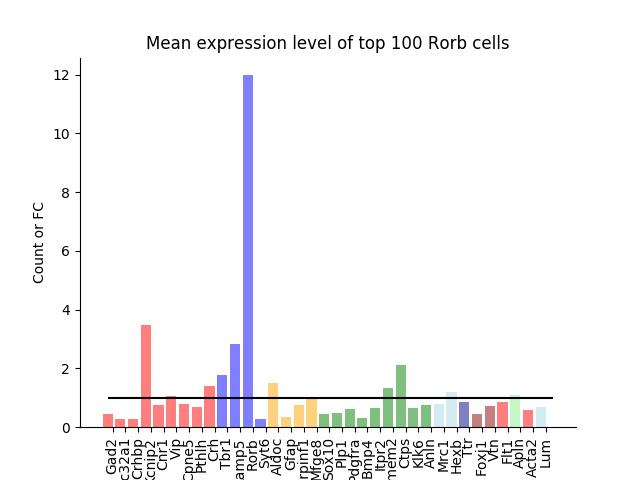

<IPython.core.display.Javascript object>


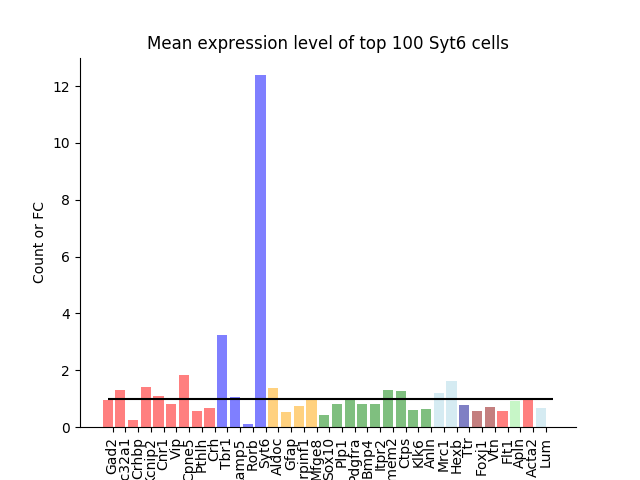

<IPython.core.display.Javascript object>


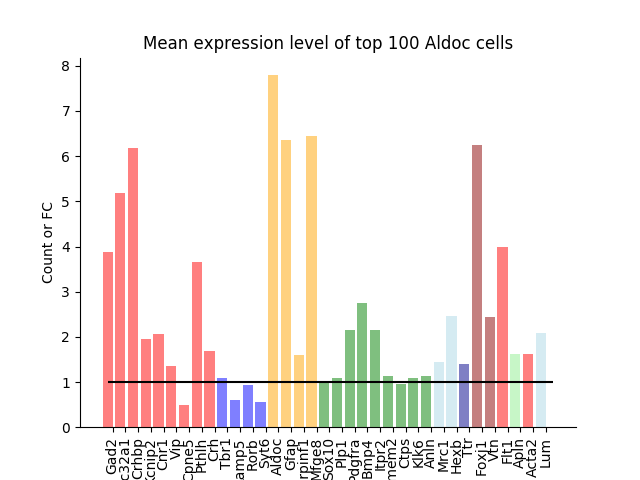

<IPython.core.display.Javascript object>


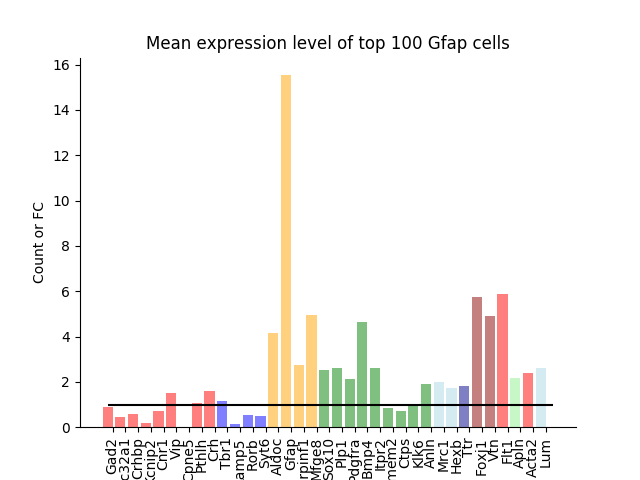

<IPython.core.display.Javascript object>


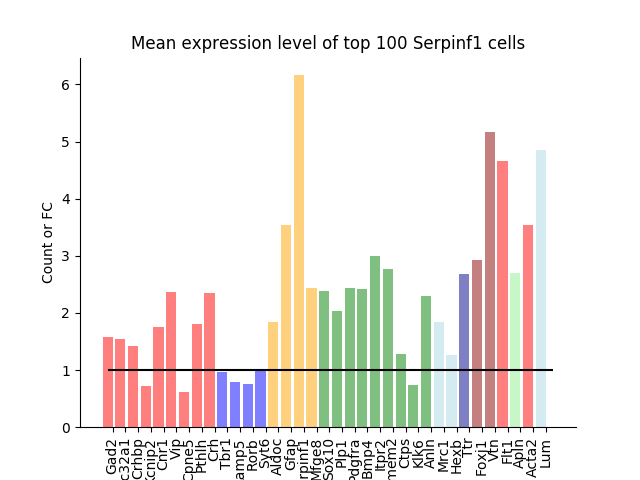

<IPython.core.display.Javascript object>


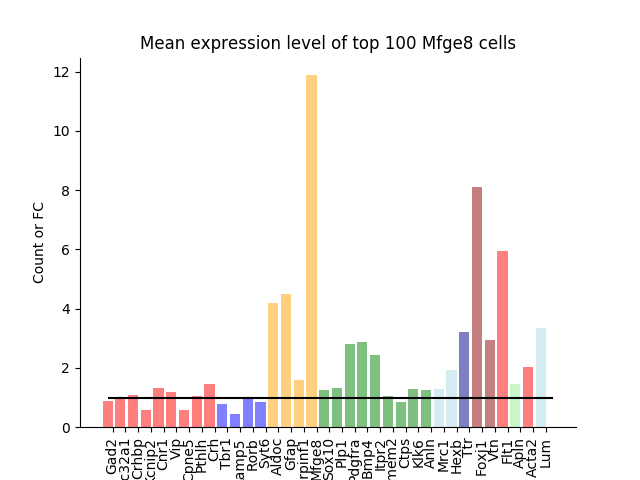

<IPython.core.display.Javascript object>


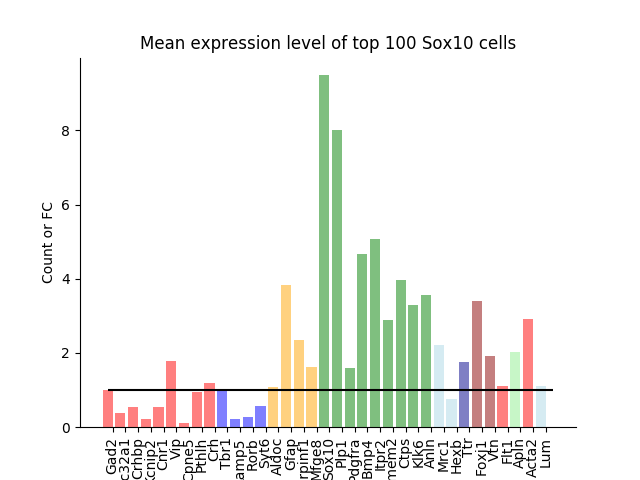

<IPython.core.display.Javascript object>


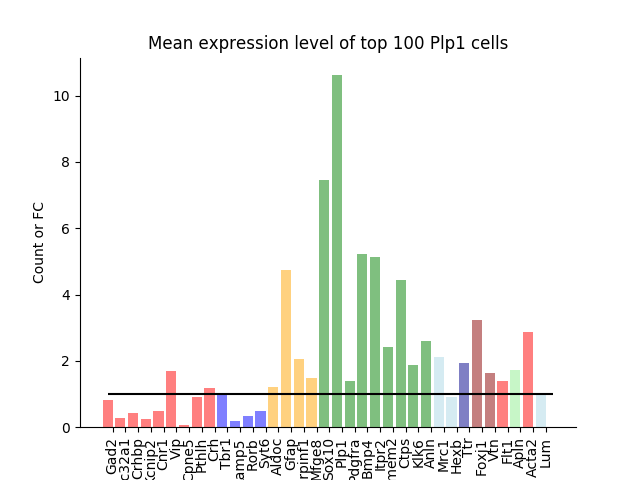

<IPython.core.display.Javascript object>


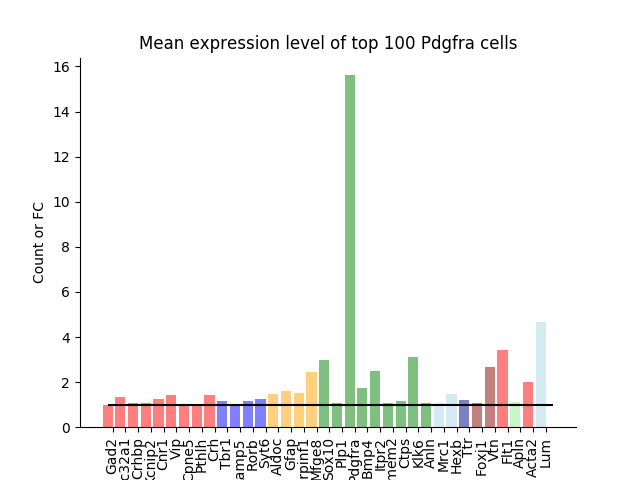

<IPython.core.display.Javascript object>


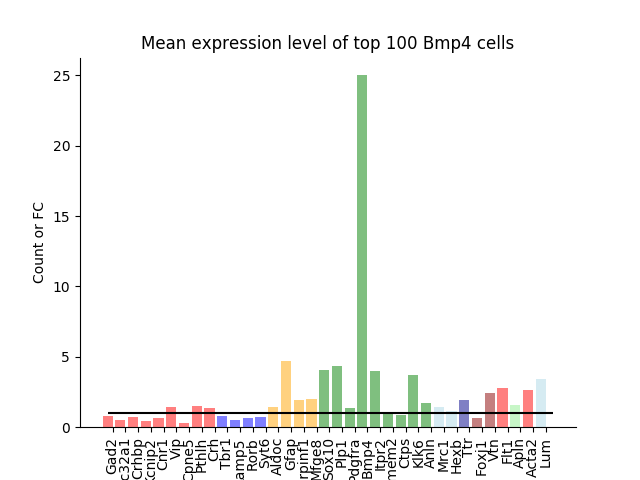

<IPython.core.display.Javascript object>


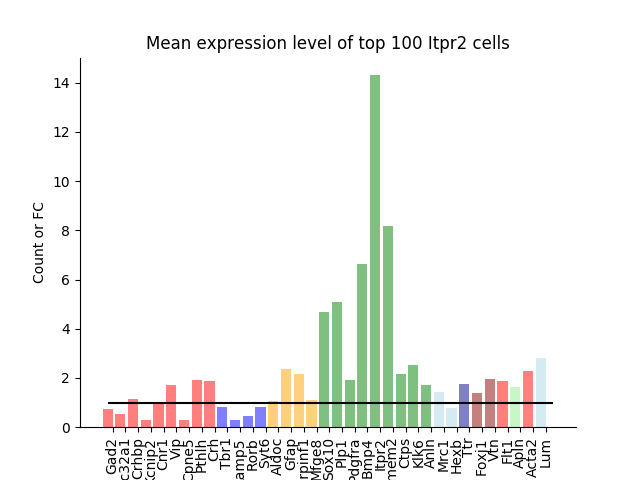

<IPython.core.display.Javascript object>


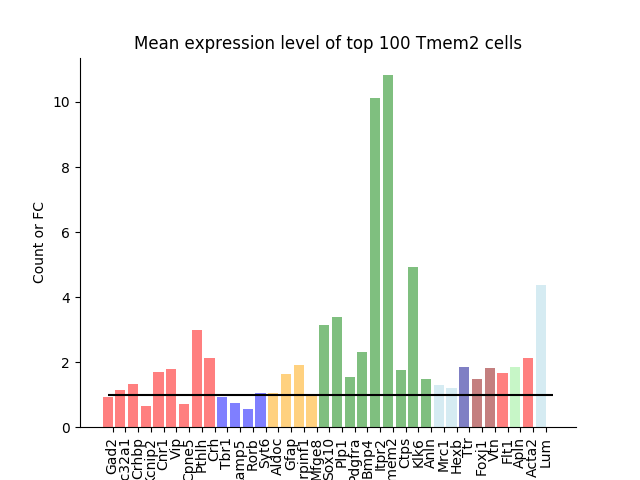

<IPython.core.display.Javascript object>


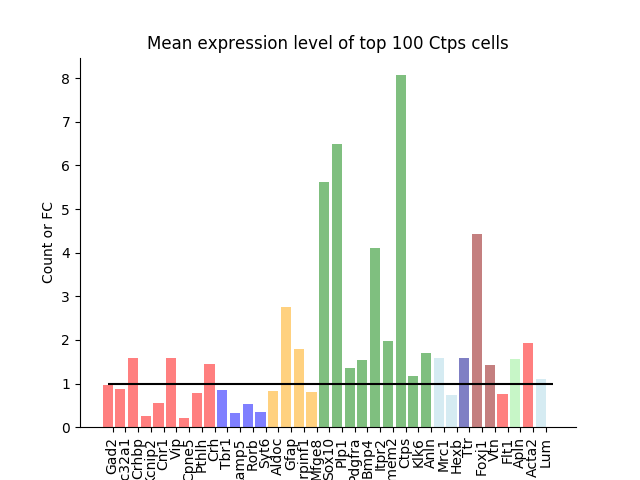

<IPython.core.display.Javascript object>


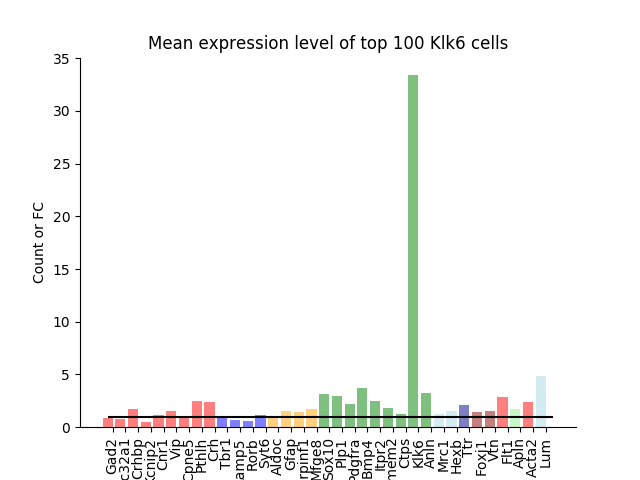

<IPython.core.display.Javascript object>


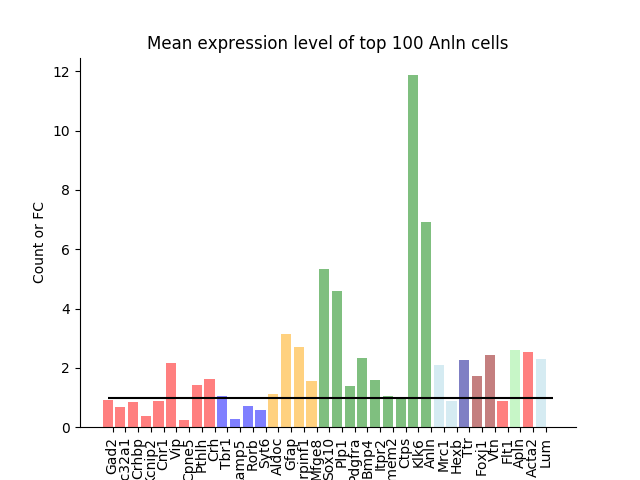

<IPython.core.display.Javascript object>


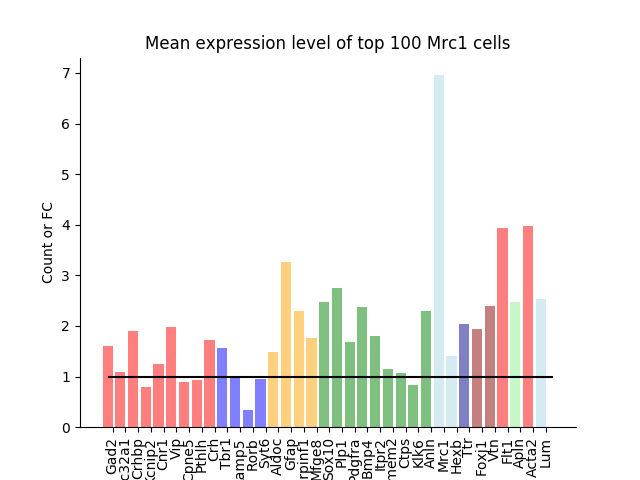

<IPython.core.display.Javascript object>


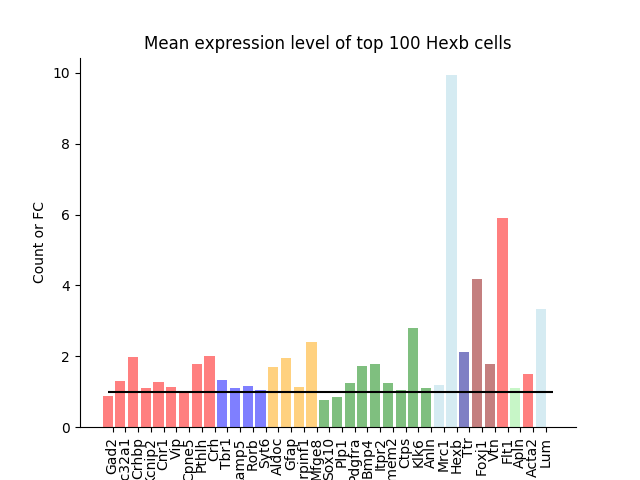

<IPython.core.display.Javascript object>


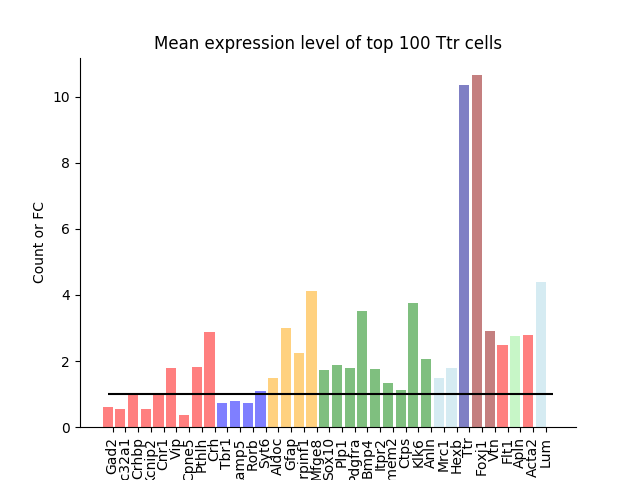

<IPython.core.display.Javascript object>


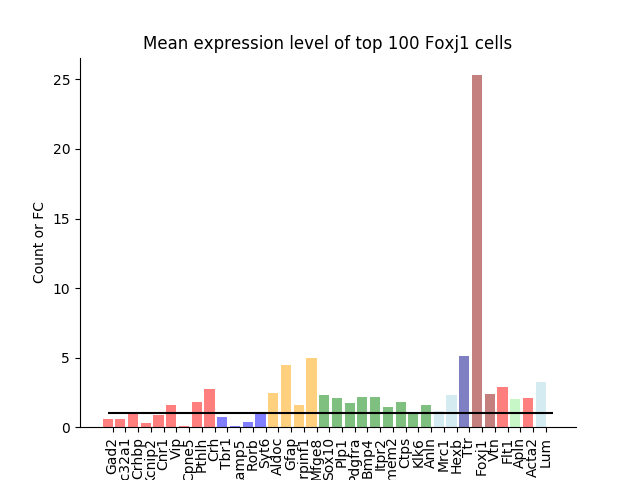

<IPython.core.display.Javascript object>


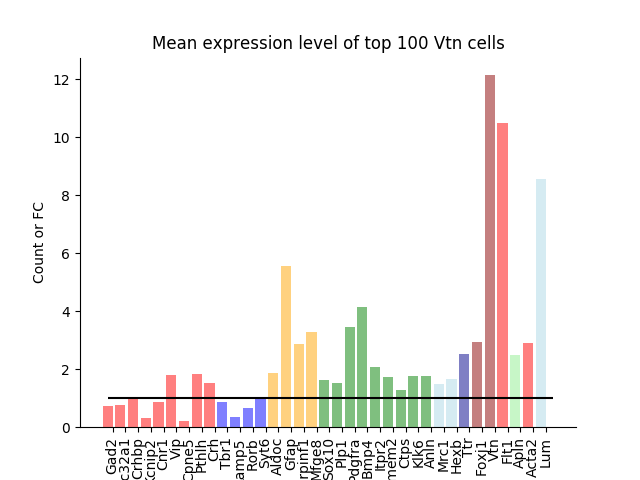

<IPython.core.display.Javascript object>


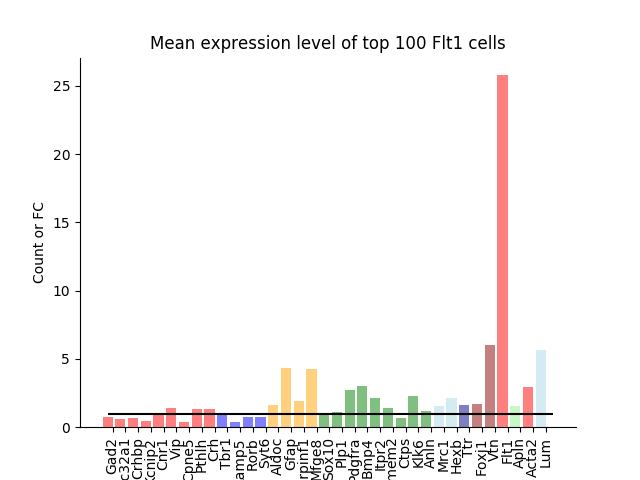

<IPython.core.display.Javascript object>


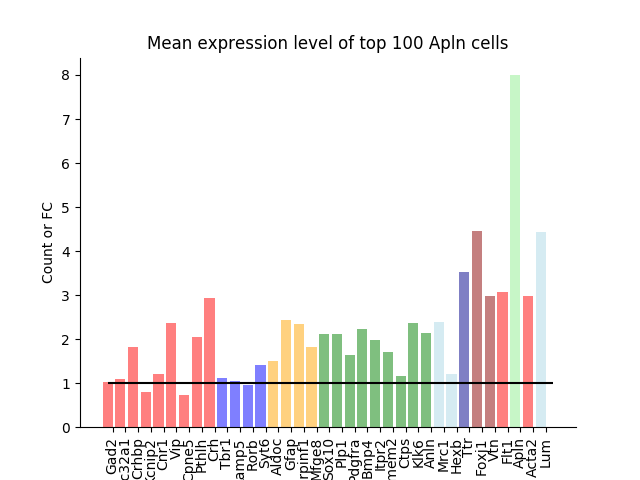

<IPython.core.display.Javascript object>


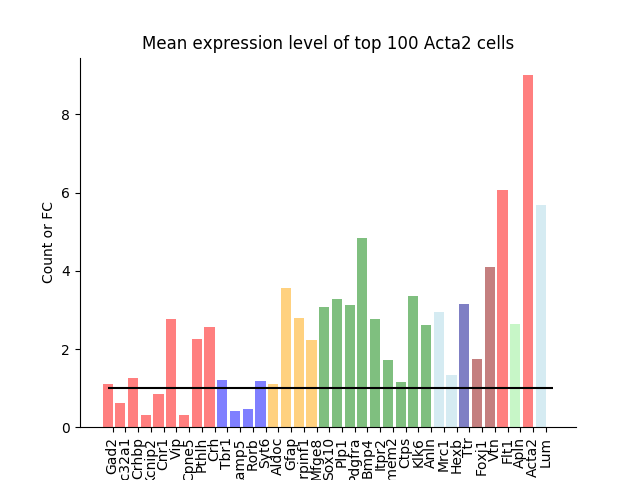

<IPython.core.display.Javascript object>


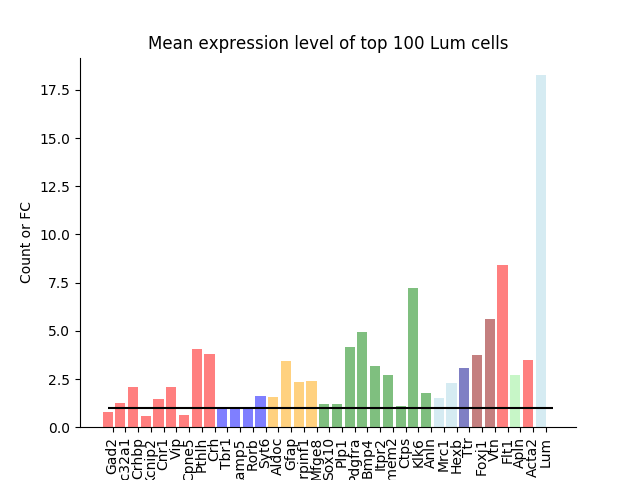

In [23]:
def plot_top_expression(gene, top_n, df):
    gene = gene_name_conversion_reverse[gene]
    top_expression = df.iloc[:, np.argsort(df.loc[gene])[::-1]].iloc[:,:top_n]

    expression_mean = top_expression.mean(axis=1)
    fig, ax = plt.subplots()
    left_pos = np.arange(len(expression_mean))
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
    'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green',
    'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
    labels = [i.split('_')[1] for i in list(expression_mean.index)]
    ax.bar(left_pos, list(expression_mean), color=gene_colors, alpha=0.5)
    ax.hlines(1, 0, len(expression_mean))
    ax.set_xticks(left_pos+0.4)
    ax.set_xticklabels(labels, rotation='vertical')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_title('Mean expression level of top {} {} cells'.format(top_n, gene.split('_')[1]))
    ax.set_ylabel('Count or FC')

import time
for i in gene_sort:
    plot_top_expression(i, 100, df_fish_fc)


### Spatial expression

<IPython.core.display.Javascript object>


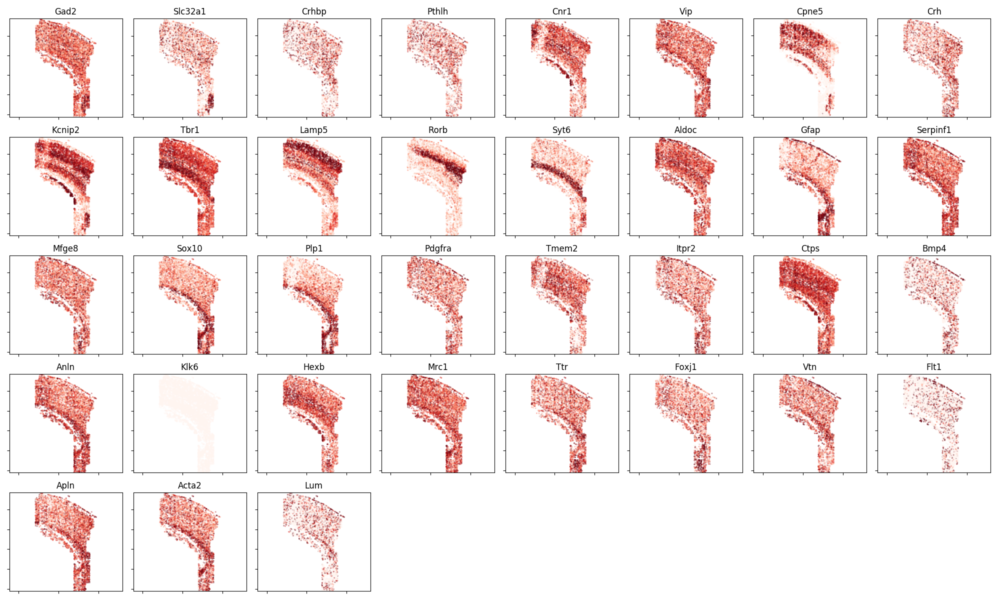

/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


In [34]:
plt.figure(figsize=(20,12))
gs = plt.GridSpec(5,8)

for i, gene in enumerate(gene_sort_fish):
    plt.subplot(gs[i])
    filt = df_fish.index == gene
    levels = X_log[filt,:].flat[:]
    #levels = X_fc[filt,:].flat[:]
    levels = np.clip(levels, np.percentile(levels, 10), np.percentile(levels,90))
    selection_df = coord_df.loc[:,df_fish.columns] #the coord_df is not filtered
    plt.scatter(selection_df.loc['X'], selection_df.loc['Y'],color=plt.cm.Reds(levels/max(levels)), lw=0, alpha=0.4,s=5)
    for label in plt.gca().axes.get_xticklabels():
        label.set_visible(False)
    for label in plt.gca().axes.get_yticklabels():
        label.set_visible(False)
    
    plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()
    plt.gca().axis('equal')
    plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
    plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
    plt.title(gene.split('_')[1])
    plt.tight_layout()


<IPython.core.display.Javascript object>


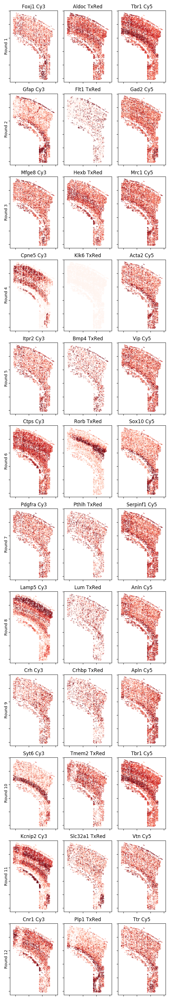

/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide
/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


In [63]:
channels_wplaceholder = {'cy3_genes': ['Hybridization1_Foxj1',
  'Hybridization2_Gfap',
  'Hybridization3_Mfge8',
  'Hybridization5_Cpne5',
  'Hybridization6_Itpr2',
  'Hybridization7_Ctps',
  'Hybridization8_Pdgfra',
  'Hybridization9_Lamp5',
  'Hybridization10_Crh',
  'Hybridization11_Syt6',
  'Hybridization12_Kcnip2',
  'Hybridization13_Cnr1'],
 'cy5_genes': ['Hybridization1_Tbr1',
  'Hybridization2_Gad2',
  'Hybridization3_Mrc1',
  'Hybridization5_Acta2',
  'Hybridization6_Vip',
  'Hybridization7_Sox10',
  'Hybridization8_Serpinf1',
  'Hybridization9_Anln',
  'Hybridization10_Apln',
    'Hybridization1_Tbr1',
  'Hybridization12_Vtn',
  'Hybridization13_Ttr'],
 'txred_genes': ['Hybridization1_Aldoc',
  'Hybridization2_Flt1',
  'Hybridization3_Hexb',
  'Hybridization5_Klk6',
  'Hybridization6_Bmp4',
  'Hybridization7_Rorb',
  'Hybridization8_Pthlh',
  'Hybridization9_Lum',
  'Hybridization10_Crhbp',
  'Hybridization11_Tmem2',
  'Hybridization12_Slc32a1',
  'Hybridization13_Plp1']}

plt.figure(figsize=(6,35))
gs = plt.GridSpec(12,3)

for i in range(len(channels_wplaceholder['cy3_genes'])):
    for j in range(3):
        pos = i*3 + j
        if j == 0:
            gene = channels_wplaceholder['cy3_genes'][i]
        if j == 1:
            gene = channels_wplaceholder['txred_genes'][i]
        if j == 2:
            gene = channels_wplaceholder['cy5_genes'][i]
    
        plt.subplot(gs[pos])
        filt = df_fish.index == gene
        levels = X_log[filt,:].flat[:]
        levels = np.clip(levels, np.percentile(levels, 10), np.percentile(levels,90))
        selection_df = coord_df.loc[:,df_fish.columns] #the coord_df is not filtered
        plt.scatter(selection_df.loc['X'], selection_df.loc['Y'],color=plt.cm.Reds(levels/max(levels)), lw=0, alpha=0.4,s=5)
        for label in plt.gca().axes.get_xticklabels():
            label.set_visible(False)
        for label in plt.gca().axes.get_yticklabels():
            label.set_visible(False)

        plt.gca().invert_xaxis()
        plt.gca().invert_yaxis()
        plt.gca().axis('equal')
        plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
        plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
        if j == 0:
            plt.ylabel('Round {}'.format(i+1))
        channel_names = ['Cy3', 'TxRed', 'Cy5']
        plt.title(gene.split('_')[1]+ ' {}'.format(channel_names[j]))
plt.tight_layout()
#plt.savefig('Gene_expression_map_channel_round.png', dpi=300)       


<IPython.core.display.Javascript object>


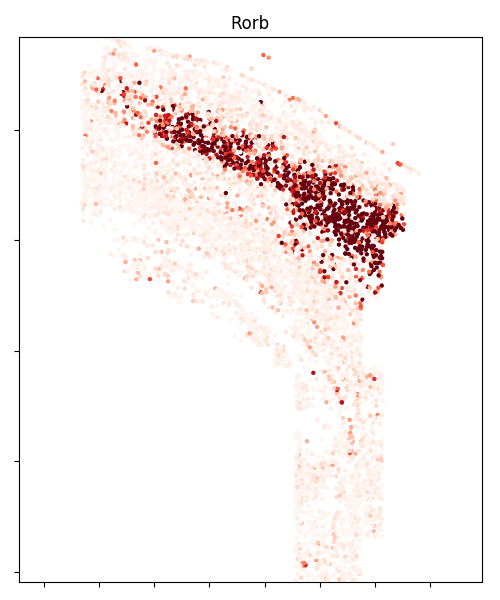

In [42]:
gene = gene_sort_fish[gene_sort.index('Rorb')]

plt.figure(figsize=(5,6))

filt = df_fish.index == gene
levels = X_fc[filt,:].flat[:]
levels = np.clip(levels, np.percentile(levels, 10), np.percentile(levels,90))
selection_df = coord_df.loc[:,df_fish.columns]
plt.scatter(selection_df.loc['X'], selection_df.loc['Y'],color=plt.cm.Reds(levels/max(levels)), lw=0, alpha=1,s=10)
for label in plt.gca().axes.get_xticklabels():
    label.set_visible(False)
for label in plt.gca().axes.get_yticklabels():
    label.set_visible(False)

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
plt.title(gene.split('_')[1])
plt.tight_layout()

plt.savefig('Cortex_expression_{}'.format(gene), dpi=300)

### Gene correlation

<IPython.core.display.Javascript object>


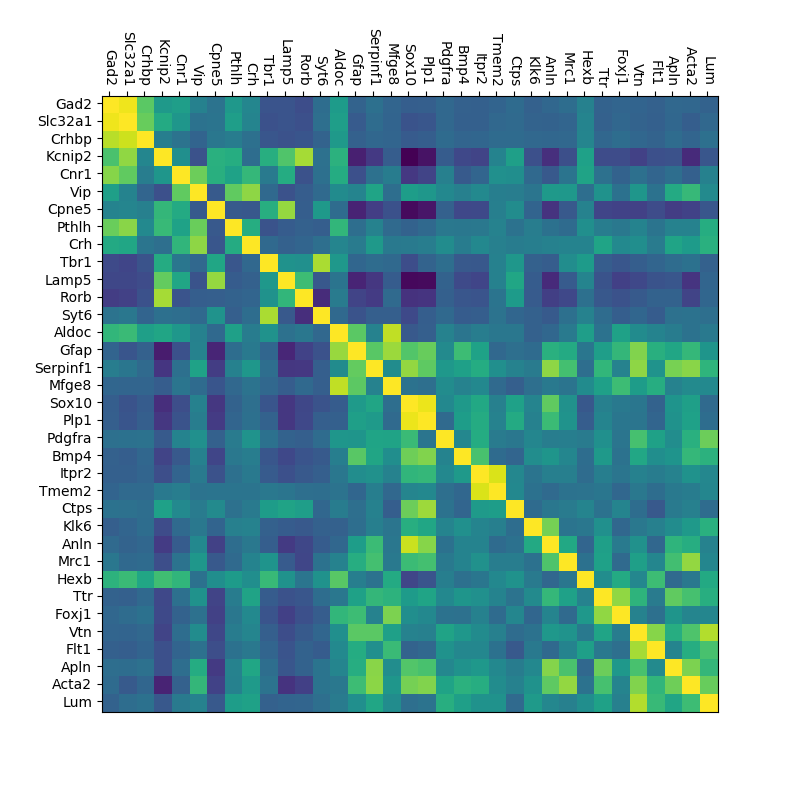

In [43]:

def correlation_df(df):
    fig, ax = plt.subplots(figsize=(8,8))
    data = df.T.corr(method='pearson').values
    data = data/np.percentile(data, 97.5, 1)[:,None]
    #axHM.pcolor(z,cmap='viridis', vmax=1)
    
    ax.pcolor(data,cmap='viridis', vmax=1 )

    y_pos = np.arange(len(df))
    x_pos = np.arange(len(df))
    #ax1.set_xlim(0, len(df_count_average.columns))
    ax.xaxis.tick_top()
    ax.set_xticks(x_pos+0.4)
    ax.set_xticklabels(gene_sort, rotation=-90)
    ax.set_yticks(y_pos+0.4)
    ax.set_yticklabels(gene_sort)
    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.set_title('')

correlation_df(df_fish)

# Single cell data & Comparison

In [44]:
# Import the Single Cell Cortex data into a data frame (Zeisel 2015)
df_sc_cort = pd.read_csv('/home/lars/storage/Documents/Single_Cell/Single_Cell_Cortex_Data/expression_mRNA_17-Aug-2014.txt', sep="\t", index_col=0, low_memory=False)
#used Low_memory=False, because the df is made up of mixed types in the rows. (normaly pandas expects different parameters in the columns)

# Remove all the bad cells (Cells with the label '(none)'
    #This removes 189 bad cells
df_sc_cort = df_sc_cort.loc[:, [i for i in df_sc_cort.columns if df_sc_cort.iloc[8,df_sc_cort.columns.get_loc(i)] != '(none)']].copy()

# Put all cell labels in a dictionary
sc_cor_cell_label_1 = df_sc_cort.iloc[7,1:].to_dict()
sc_cor_cell_label_2 = df_sc_cort.iloc[8,1:].to_dict()

# Get rid of the meta data
df_sc_cort = df_sc_cort.iloc[10:,1:]

#Make a copy with all the genes
df_sc_cort_all_genes = df_sc_cort

# 
df_sc_cort = df_sc_cort.loc[gene_sort,:]
df_sc_cort = df_sc_cort.astype(np.int32)
df_sc_cort.head(5)

,sscortex,sscortex.1,sscortex.2,sscortex.3,sscortex.4,sscortex.5,sscortex.6,ca1hippocampus,sscortex.7,sscortex.8,...,sscortex.1682,sscortex.1683,sscortex.1684,sscortex.1687,sscortex.1688,ca1hippocampus.1311,ca1hippocampus.1312,sscortex.1689,ca1hippocampus.1313,sscortex.1690
Gad2,23,9,14,19,6,35,79,51,52,91,...,6,0,0,1,2,0,0,0,0,1
Slc32a1,7,12,13,8,13,3,12,9,6,6,...,0,0,0,1,0,0,0,0,0,0
Crhbp,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
Kcnip2,0,2,0,4,0,7,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
Cnr1,20,12,122,82,7,40,38,80,10,62,...,11,0,0,10,0,1,0,0,0,1


### Cortex and Oligo dataset

In [45]:
#Load the data set with the cortex and oligo paper cells
df_sc_cort_olig = pd.read_pickle('/home/lars/storage/Documents/Single_Cell/Single_Cell_All_2016/df_cortex_olig.pkl')
df_sc_cort_olig = df_sc_cort_olig.loc[gene_sort,:]

#Load Cell label dictionary
sc_cort_olig_label = pickle.load(open('/home/lars/storage/Documents/Single_Cell/Single_Cell_All_2016/label_cortex_olig.pkl', "rb" ) )
df_sc_cort_olig.head(5)

,sscortex,sscortex.1,sscortex.2,sscortex.3,sscortex.4,sscortex.5,sscortex.6,ca1hippocampus,sscortex.7,sscortex.8,...,C1-1772078-018-A06,C1-1772099-001-A01,C1-1772089-205-A10,C1-1772089-205-F02,C1-1772117-028-B06,C1-1772089-205-B09,C1-1772063-074-D10,C1-1772089-202-G07,C1-1772089-202-B06,C1-1772117-055-D11
Gad2,23,9,14,19,6,35,79,51,52,91,...,0,1,0,0,0,0,0,0,0,0
Slc32a1,7,12,13,8,13,3,12,9,6,6,...,0,0,0,0,0,0,0,0,0,0
Crhbp,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Kcnip2,0,2,0,4,0,7,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Cnr1,20,12,122,82,7,40,38,80,10,62,...,0,0,0,0,0,0,0,0,0,0


## average molecule compare

In [314]:
difference_sc_fish = np.zeros((len(gene_sort_fish),3))
for i, g in enumerate(gene_sort_fish):
    difference_sc_fish[i,0] = np.mean(df_fish.loc[g])
    difference_sc_fish[i,1] = np.mean(df_sc_cort.loc[g.split('_')[1]])
    difference_sc_fish[i,2] = (np.mean(df_fish.loc[g]) / np.mean(df_sc_cort.loc[g.split('_')[1]]))

<IPython.core.display.Javascript object>


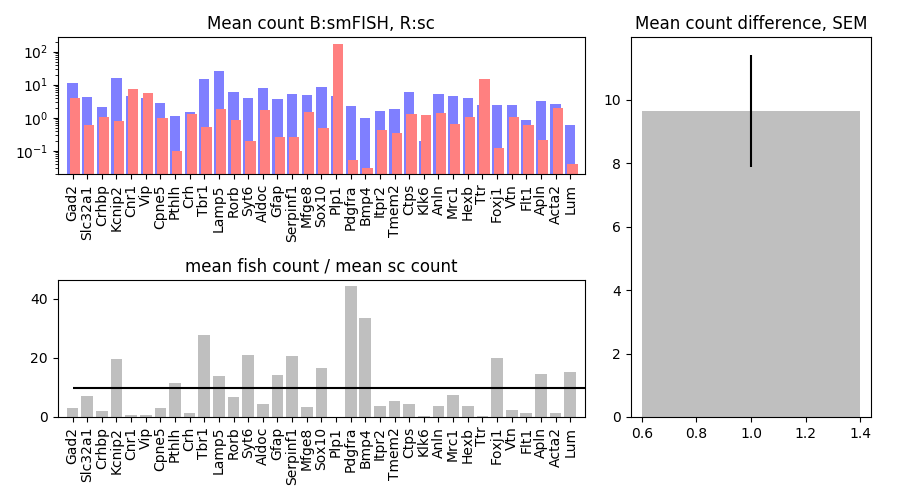

The mean count is on average 9.651327233548368 times higher for the smFISH compated to the single cell, with a SEM of 1.753836100501829
Assumes unbiased cell sampling


In [315]:
plt.figure(figsize=(9, 5))
ax1 = plt.subplot2grid((2,3), (0,0), rowspan=1, colspan=2)
x_pos = list(range(difference_sc_fish.shape[0]))
ax1.bar(x_pos, difference_sc_fish[:,0], color='b', alpha=0.5, linewidth=0, width=0.7)
ax1.bar([x+0.15 for x in x_pos], difference_sc_fish[:,1],  alpha=1, linewidth=0, width=0.7, color=[255/255,128/255,128/255])
ax1.set_xticks(np.arange(difference_sc_fish.shape[0])+0.0)
ax1.set_xticklabels(gene_sort, rotation='vertical');
ax1.set_yscale("log")
ax1.set_xlim(-1, len(gene_sort))
ax1.set_title('Mean count B:smFISH, R:sc')

ax2 = plt.subplot2grid((2,3), (1,0), rowspan=1, colspan=2)
ax2.bar(x_pos, difference_sc_fish[:,2], color='grey', alpha=0.5)
ax2.set_xticks(np.arange(difference_sc_fish.shape[0])+0.0)
ax2.set_xticklabels(gene_sort, rotation='vertical');
ax2.set_title('mean fish count / mean sc count')
ax2.hlines(np.mean(difference_sc_fish[:,2]), 0, 35)
ax2.set_xlim(-1, len(gene_sort))

ax3 = plt.subplot2grid((2,3), (0,2), rowspan=2, colspan=1)
ax3.bar(1,np.mean(difference_sc_fish[:,2]), yerr = np.std(difference_sc_fish[:,2])/np.sqrt(difference_sc_fish.shape[0]), color='grey', alpha=0.5, ecolor='black')
ax3.set_title('Mean count difference, SEM')
plt.tight_layout()

print('The mean count is on average {} times higher for the smFISH compated to the single cell, with a SEM of {}'.format(np.mean(difference_sc_fish[:,2]), np.std(difference_sc_fish[:,2])/np.sqrt(difference_sc_fish.shape[0])))
print('Assumes unbiased cell sampling')

<IPython.core.display.Javascript object>


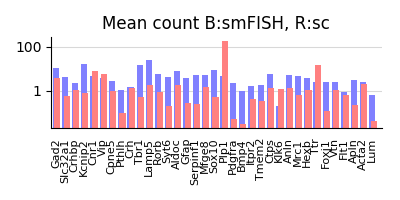

In [310]:
fig, ax = plt.subplots(figsize=(4,2))

x_pos = np.array(range(difference_sc_fish.shape[0]))
ax.bar(x_pos+0.01, difference_sc_fish[:,0], alpha=1, linewidth=0, width=0.65, color=[128/255,128/255, 255/255])
ax.bar(x_pos+0.15, difference_sc_fish[:,1],  alpha=1, linewidth=0, width=0.65, color=[255/255,128/255,128/255])
ax.set_yscale("log")
ax.set_xticks(np.arange(len(gene_sort))+0.0)
ax.set_xticklabels(gene_sort, rotation='vertical', fontsize=8)
ax.set_xlim(-0.5, len(gene_sort))

ax.yaxis.set_major_formatter(FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='solid', alpha=0.3)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('none')


ax.set_title('Mean count B:smFISH, R:sc')
plt.tight_layout()

plt.savefig('Mean_count_comaprison_sc_fish.png', dpi=300)

<IPython.core.display.Javascript object>


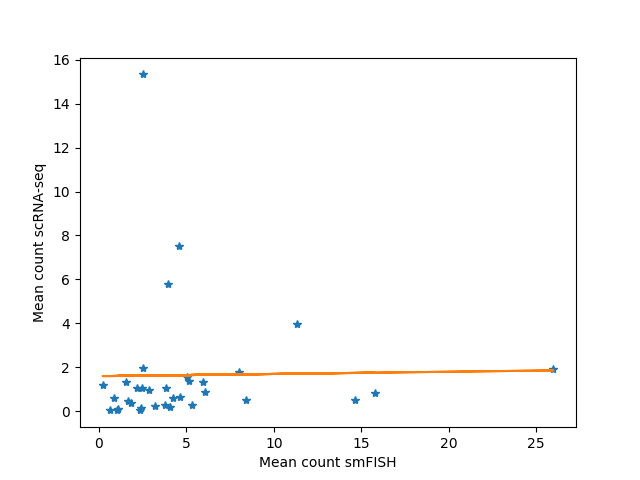

 
0.01013 x + 1.589


In [318]:
plt.figure()

#plt.scatter(difference_sc_fish[:,0], difference_sc_fish[:,1])
plt.ylabel('Mean count scRNA-seq')
plt.xlabel('Mean count smFISH')

data = difference_sc_fish

#Exclude Plp1
data = np.delete(data, 18, axis=0 )

fit = np.polyfit(data[:,0], data[:,1], 1)
fit_fn = np.poly1d(fit)

plt.plot(data[:,0], data[:,1], '*', data[:,0], fit_fn(data[:,0]))
#plt.yscale('log')
#plt.xscale('log')

print(fit_fn)


## Marker selection plot

In [51]:
#make list and array of cell type labels
sc_CO_labels = []
for i in df_sc_cort_olig.columns:
    sc_CO_labels.append(sc_cort_olig_label[i])
sc_CO_labels_a = np.array(sc_CO_labels)

#Make df with count averages per cluster
df_count_average_sc = pd.DataFrame(index=df_sc_cort_olig.index, columns=np.unique(sc_CO_labels_a))

for l in np.unique(sc_CO_labels_a):
    #filt = np.sort(sc_CO_labels) == l
    filt = sc_CO_labels_a == l
    mean = np.array(df_sc_cort_olig.loc[:,filt].T.mean())
    #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
    if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
        df_count_average_sc[l] = mean


In [52]:
type_sort_sc_cort = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5','Int6', 'Int7', 'Int8', 'Int9','Int10', 
       'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16','CA1PyrInt',
       'S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6',
       'S1PyrL6b', 'SubPyr','S1PyrDL','ClauPyr', 'CA1Pyr1','CA1PyrInt', 'CA2Pyr2',
                    'Mgl1', 'Mgl2',
                    'Vsmc',
                    'Peric',
                    'Vend1', 'Vend2',
                    'Epend',
                    'Astro1', 'Astro2',
                    'Choroid',
                     'PPR',
                    'OPC','COP','NFOL1','NFOL2','MFOL1','MFOL2',
                     'MOL1','MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6',
                    ]

type_sort_sc_cort_trimmed = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5','Int6', 'Int7', 'Int8', 'Int9','Int10', 
       'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16',
       'S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6',
       'Astro1', 'Astro2',
       'OPC','COP','NFOL1','NFOL2','MFOL1','MFOL2',
        'MOL1','MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6',                      
        'Mgl1', 'Mgl2',                     
        'Choroid',   
        'Epend',                              
        'Peric',
        'Vend1', 'Vend2',
        'Vsmc',
         'PPR']

df_count_average_sc = df_count_average_sc.loc[gene_sort, type_sort_sc_cort_trimmed]

<IPython.core.display.Javascript object>


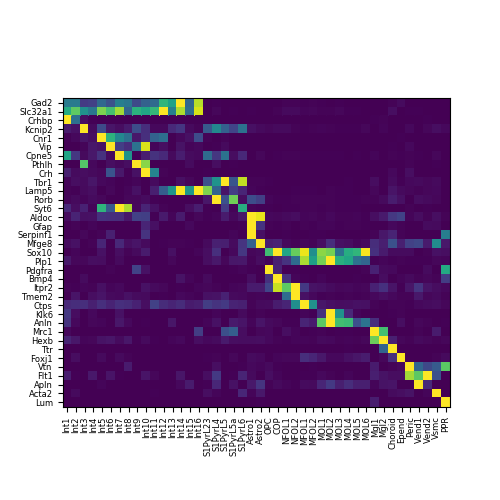

In [53]:
fig, ax = plt.subplots(figsize=(5,5))
z = df_count_average_sc.values
z = z/np.percentile(z, 99, 1)[:,None]
ax.pcolor(z,cmap='viridis', vmax=1)

y_pos = np.arange(len(df_count_average_sc.index))
x_pos = np.arange(len(df_count_average_sc.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(df_count_average_sc.columns, rotation='vertical', fontsize=6)
ax.set_yticks(y_pos+0.5)
ax.set_yticklabels(df_count_average_sc.index, fontsize=6)
ax.invert_yaxis()

ax.set_aspect('equal')

plt.savefig('Marker_selection.svg')

#divider = make_axes_locatable(ax)
#axLabel = divider.append_axes("top", .5, pad=0, sharex=ax)
#axLabel.pcolor()

#optimal_sort_labels = np.array(optimal_sort_labels)
#axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='prism')
#axLabel.set_xlim(xmax=len(df.columns))
#axLabel.axis('off')

## Gini coefficient

In [54]:
#Function from:
#https://github.com/oliviaguest/gini/blob/master/gini.py
def gini(array):
    """Calculate the Gini coefficient of a numpy array."""
    # based on bottom eq:
    # http://www.statsdirect.com/help/generatedimages/equations/equation154.svg
    # from:
    # http://www.statsdirect.com/help/default.htm#nonparametric_methods/gini.htm
    # All values are treated equally, arrays must be 1d:
    array = array.flatten()
    if np.amin(array) < 0:
        # Values cannot be negative:
        array -= np.amin(array)
    # Values cannot be 0:
    array += 0.0000001
    # Values must be sorted:
    array = np.sort(array)
    # Index per array element:
    index = np.arange(1,array.shape[0]+1)
    # Number of array elements:
    n = array.shape[0]
    # Gini coefficient:
    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array)))

#One sample has all --> Gini = 1
#All samples have the same --> Gini = 0
#Uniform random --> Gini ~0.33

In [55]:
gini_sc = []
for g in gene_sort:
    gini_sc.append(gini(df_sc_cort.loc[g].values.astype(np.float64)))
    
gini_fish = []
for g in gene_sort_fish:
    gini_fish.append(gini(df_fish.loc[g].values.astype(np.float64)))
    
print('Average Gini coefficient for Single Cell: {}, SEM {}'.format(np.mean(gini_sc), np.std(gini_sc)/np.sqrt(len(gini_sc))))
print('Average Gini coefficient for smFISH: {}, SEM {}'.format(np.mean(gini_fish),  np.std(gini_fish)/np.sqrt(len(gini_fish))))

Average Gini coefficient for Single Cell: 0.9288801995873975, SEM 0.010065914410582995
Average Gini coefficient for smFISH: 0.7017387590789295, SEM 0.020989368516651306


<IPython.core.display.Javascript object>


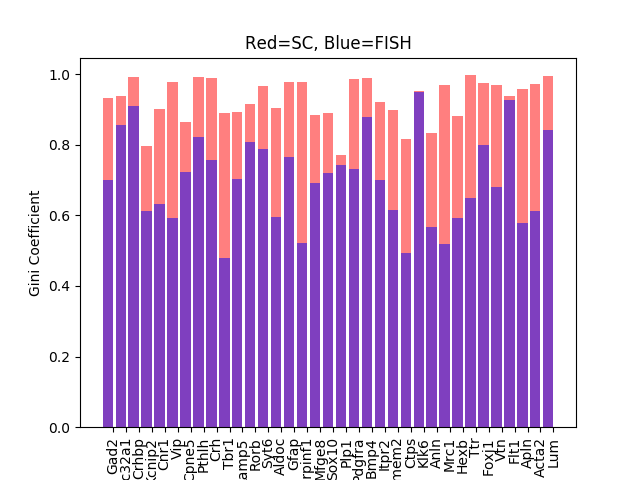

In [56]:
fig, ax = plt.subplots()
x_pos = range(len(gini_sc))
ax.bar(x_pos, gini_sc, color='r', alpha=0.5)
ax.bar(x_pos, gini_fish, color='b', alpha=0.5)
ax.set_xticks(np.arange(0, len(gini_sc), 1)+0.4)
ax.set_xticklabels(gene_sort, rotation='vertical')
ax.set_ylabel('Gini Coefficient')
ax.set_title('Red=SC, Blue=FISH')

Gini could be a good measure to see how uniformly a gene is expressed within a cell type

## Zero and count distribution

<IPython.core.display.Javascript object>


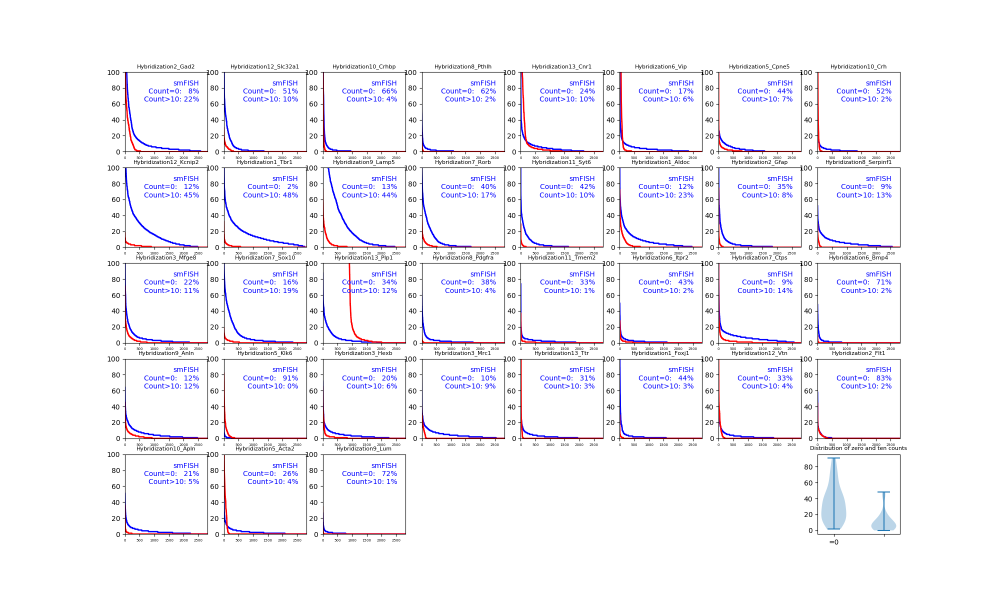

smFISH dataframe has more cells.
This dataframe will be randomly resampled to match the number of cels of the single cell dataframe


In [76]:
#To compare eficiency, take the X positive cells from the single cell, and the X highest expressing genes from the FISH
#Look at the ratio difference between the means. and calculate the mean ratio.

#Gene expression count distribution, for smFISH data compared to single cell data
#Percentage of cells with zero and higher than 10 molecules are given for smFISH data.

plt.figure(figsize=(20,12))
gs = plt.GridSpec(5,8)

#Contruct lists for later plotting
zeros = []
tens = []

#Match the number of cells of the single cell df and smFISH df
df_fish_resample = df_fish
df_sc_resample = df_sc_cort

len_fish = len(df_fish_resample.columns)
len_sc = len(df_sc_resample.columns)
if len_fish > len_sc:
    print('smFISH dataframe has more cells.\nThis dataframe will be randomly resampled to match the number of cels of the single cell dataframe')
    df_fish_resample = df_fish_resample.sample(n=len_sc, axis=1)
    x_max = len_sc
elif len_sc > len_fish:
    print('single cell dataframe has more cells.\nThis dataframe will be randomly resampled to match the number of cels of the smFISH dataframe')
    df_sc_resample = df_sc.sample(n=len_fish, axis=1)
    x_max = len_fish
    
#Plot comparison plot
for i in range(len(df_fish_resample.index)):
    ax = plt.subplot(gs[i])
    
    #Plot smFISH data
    ax.plot(np.sort(df_fish_resample.iloc[i])[::-1], c='blue', lw=2)
    
    #Convert Hybridization gene name to single cell gene name
    gene_name = gene_name_conversion[df_fish_resample.index[i]]
    #Plot single cell data
    ax.plot(np.sort(df_sc_resample.loc[gene_name])[::-1], c='red', lw=2)
    
    #ax.set_yscale("log")
    ax.tick_params(axis='y', labelsize=10)
    #plt.xscale("log")
    ax.tick_params(axis='x', labelsize=5)
    ax.set_xlim(0, x_max)
    ax.set_ylim(0, 100)
    total = len(df_fish_resample.columns)
    zerosp = ((total - np.count_nonzero(df_fish_resample.iloc[i])) / total) *100
    zeros.append(zerosp)
    tensp = (len(np.where(df_fish_resample.iloc[i] > 10)[0]) / total) *100
    tens.append(tensp)
    annotation = "smFISH\nCount=0:   {}%\nCount>10: {}%".format(round(zerosp), round(tensp))
    ax.text(.9,.9,annotation, horizontalalignment='right',verticalalignment='top',transform = ax.transAxes, color='blue')
    #ax.annotate(annotation,xy=(len(df_smFISH.iloc[i]), 150), size=8, color ='blue', zorder=10000) #-5000 for non-log x-scale
    ax.set_title(df_fish_resample.index[i], size=8)
    
ax = plt.subplot(gs[39])
ax.violinplot((zeros, tens))
ax.tick_params(axis='x', labelsize=10)
#ax.set_xticks([1,2], ('=0', '>10'))
ax.set_xticklabels(['','=0','', '>10'])
ax.tick_params(axis='y', labelsize=10)
ax.set_title('Distribution of zero and ten counts', size=8)

#plt.savefig('smFISH_count_distribution_log', dpi=300)

## Fit curve on count sort

In [237]:
from scipy.optimize import curve_fit
from scipy.misc import derivative

<IPython.core.display.Javascript object>


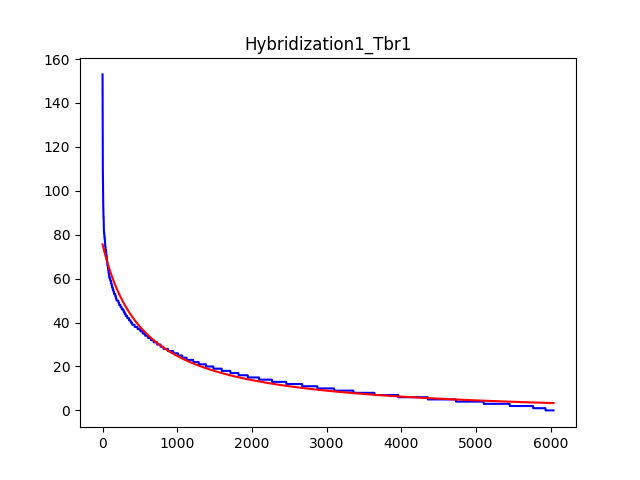

[  4.35898675e+04   5.52512163e+02  -3.29213362e+00]
Formula: (43589.86752397243 / (x + 552.5121627800727)) + -3.292133622868599


In [238]:
#FISH DATA

def func_fit(x, a, b, c):
    #return a * np.exp(-b * x) + c
    #return a* x**2 + b*x +c
    return (a / (x + b)) + c #<--- Best fit
    #return a * -np.log(x)+b

gene = gene_sort_fish[9]


plt.figure()
ydata = np.sort(df_fish.loc[gene])[::-1]
xdata = np.arange(len(np.sort(df_fish.loc[gene])[::-1]))

plt.plot(xdata, ydata, 'b-', label='data')

popt, pcov = curve_fit(func_fit, xdata, ydata)
plt.plot(xdata, func_fit(xdata, *popt), 'r-', label='fit')

plt.title(gene)

print(popt)
print('Formula: ({} / (x + {})) + {}'.format(*popt) )

<IPython.core.display.Javascript object>


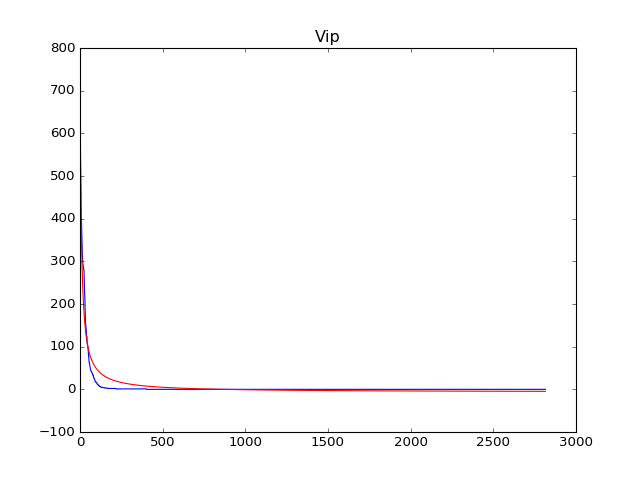

[ 5880.77591545     7.35500345    -6.78485958]
Formula: (5880.775915451567 / (x + 7.355003453348501)) + -6.784859583954274


In [538]:
#SINGLE CELL DATA

def func_fit(x, a, b, c):
    #return a * np.exp(-b * x) + c
    #return a* x**2 + b*x +c
    return (a / (x + b)) + c #<--- Best fit
    #return a * -np.log(x)+b

gene = gene_sort[5]


plt.figure()
ydata = np.sort(df_sc.loc[gene])[::-1]
xdata = np.arange(len(np.sort(df_sc.loc[gene])[::-1]))

plt.plot(xdata, ydata, 'b-', label='data')

popt, pcov = curve_fit(func_fit, xdata, ydata)
plt.plot(xdata, func_fit(xdata, *popt), 'r-', label='fit')

plt.title(gene)

print(popt)
print('Formula: ({} / (x + {})) + {}'.format(*popt) )

In [412]:
def f(x):
    return (5.23190408e+04 / (x + 4.45520934e+02))-7.44022002e+00

derivative(f, 1000)


-0.025038667328566078

<IPython.core.display.Javascript object>


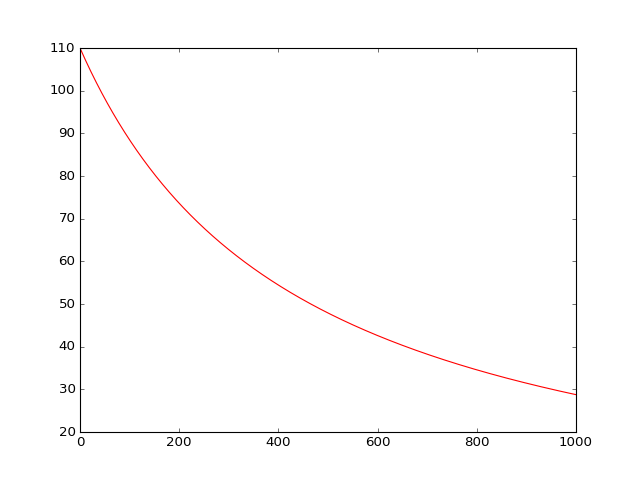

In [400]:

def f(x):
    return (5.23190408e+04 / (x + 4.45520934e+02))-7.44022002e+00

plt.figure()
x = np.linspace(0, 1000, 1000)
plt.plot(x, f(x), 'r-', label='f(x)')

In [486]:
len(slice(10, 20, 1), slice(10, 20, 1))

TypeError: len() takes exactly one argument (2 given)

In [494]:
import scipy.optimize

def f(x):
    
    return (52319 / (x + 445))-7


def fa(x):
    return derivative(f, x)
#(slice(10, 20, 1), slice(10, 20, 1))
rranges = (slice(-4, 4, 0.25), slice(-4, 4, 0.25))
q = scipy.optimize.brute(f, rranges )

ValueError: setting an array element with a sequence.

In [516]:
def g(x):
    return x**2

def f(x):
    return (52319 / (x + 445))-7

def OA(x):
    return np.sqrt(x**2 + (f(x))**2)

def OAd(x):
    return derivative(OA, x)

def fa(x):
    return derivative(f, x)

scipy.optimize.minimize(OAd, [300,60], bounds=((1,1000),(1,100)), method='TNC')


ValueError: setting an array element with a sequence.

In [409]:
from scipy.optimize import fmin_cobyla

P = (0, 0)

def f(x):
    return (5.23190408e+04 / (x + 4.45520934e+02))-7.44022002e+00

def objective(X):
    x,y = X
    return np.sqrt((x - P[0])**2 + (y - P[1])**2)

def c1(X):
    x,y = X
    return derivative(f, X)

X = fmin_cobyla(objective, x0=[60,300], cons=[c1])

#print( 'The minimum distance is {0:1.3f}'.format(objective(X)))

# Verify the vector to this point is normal to the tangent of the curve
# position vector from curve to point
v1 = np.array(P) - np.array(X)
# position vector
v2 = np.array([1, 2.0 * X[0]])
print ('dot(v1, v2) = ',np.dot(v1, v2))
print(X)

TypeError: can only concatenate list (not "float") to list

<IPython.core.display.Javascript object>


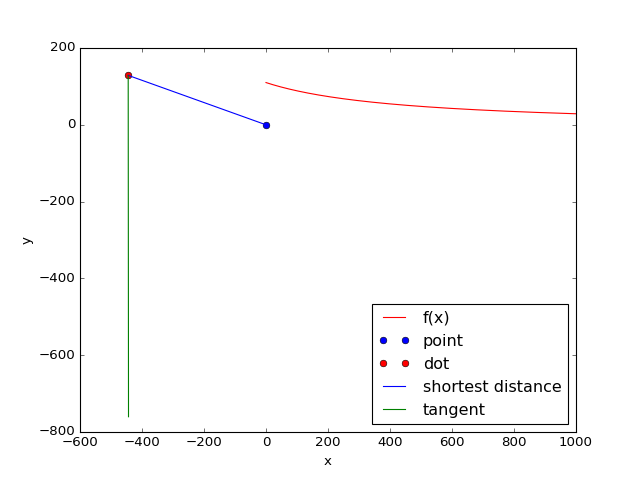

In [406]:
plt.figure()
x = np.linspace(0, 1000, 1000)
plt.plot(x, f(x), 'r-', label='f(x)')
plt.plot(P[0], P[1], 'bo', label='point')
plt.plot(X[0], X[1], 'ro', label='dot')
plt.plot([P[0], X[0]], [P[1], X[1]], 'b-', label='shortest distance')
plt.plot([X[0], X[0] + 1], [X[1], X[1] + 2.0 * X[0]], 'g-', label='tangent')
#plt.axis('equal')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best')


<IPython.core.display.Javascript object>


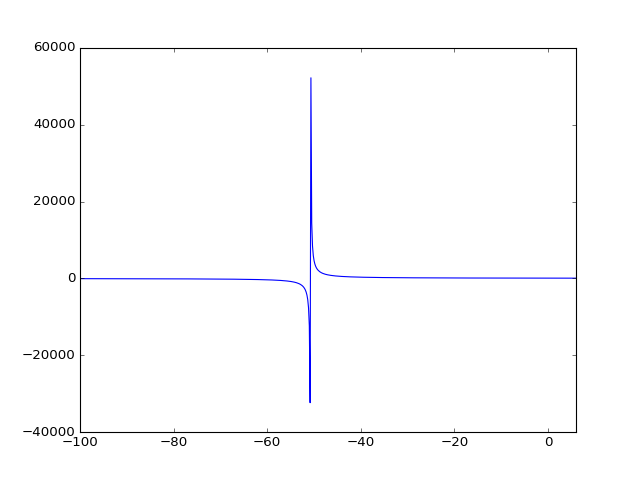

(-100, 6)

In [317]:
xx = np.linspace(0, 1000, 1000)
plt.figure()
plt.plot(xx, func_fit(xx, *popt))
plt.xlim([-100, 6])

## Fit distribution

In [ ]:
# Fit normal of negative binominal distributions

## Count distribution & comparison smFISH SC

<IPython.core.display.Javascript object>


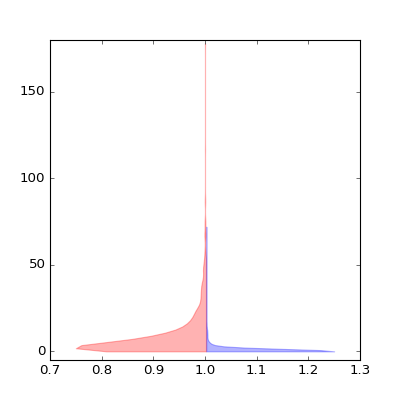

(-5, 180.0)

In [283]:
data1 = df_fish.sample(n=len(df_sc_cort.columns), axis=1).iloc[13]
data2 = df_sc_cort.iloc[13]

f, ax = plt.subplots(figsize=(5, 5))
v1 = ax.violinplot(data1, showmeans=False, showextrema=False, showmedians=False)
#v1 = ax.violinplot(data1, points=50, positions=np.arange(0, len(data1)), widths=0.85,
#               showmeans=False, showextrema=False, showmedians=False)

for b in v1['bodies']:
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], -np.inf, m)
    b.set_color('r')

v2=ax.violinplot(data2, showmeans=False, showextrema=False, showmedians=False)
  
#v2 = ax.violinplot(data2, points=50, positions=np.arange(0, len(data2)), widths=0.85,
#               showmeans=False, showextrema=False, showmedians=False)
for b in v2['bodies']:
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)
    b.set_color('b')

ax.set_ylim(bottom=-5)

<IPython.core.display.Javascript object>


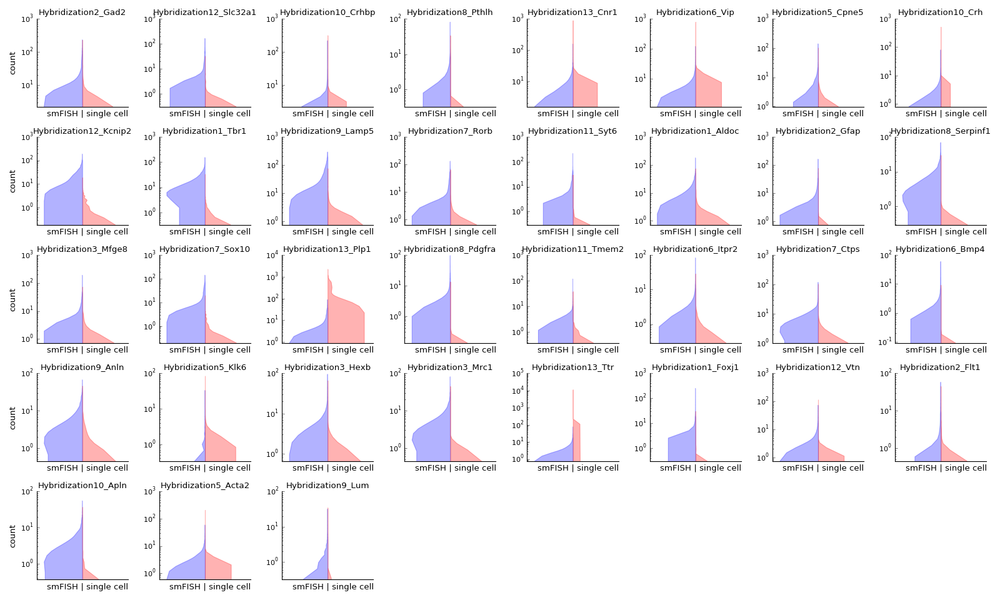

In [2161]:
plt.figure(figsize=(20,12))
gs = plt.GridSpec(5,8)


def dual_violin(i, gene, smFISH_data, sc_data):
    ax = plt.subplot(gs[i])
    
    try:
        smFISH_data = smFISH_data.loc[gene]
        sc_data = sc_data.loc[gene_name_conversion[gene]]

        v1 = ax.violinplot(smFISH_data, showmeans=False, showextrema=False, showmedians=False)
        for b in v1['bodies']:
            m = np.mean(b.get_paths()[0].vertices[:, 0])
            b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], -np.inf, m)
            b.set_color('b')

        v2 = ax.violinplot(sc_data, showmeans=False, showextrema=False, showmedians=False)
        for b in v2['bodies']:
            m = np.mean(b.get_paths()[0].vertices[:, 0])
            b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)
            b.set_color('r')
    except Exception as e:
        print('Not all hybridizations present in dataset. Error: ', e)

    ax.set_yscale("log")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.set_ylim(bottom=0)
    ax.tick_params(axis='x', which='both', bottom='off', top='off', labelbottom='off')
    ax.set_title(gene, size=12)
    ax.set_xlabel('    smFISH | single cell', size=12)
    if i%8 == 0:
        ax.set_ylabel('count', size=12)
    ax.tick_params(axis='y', labelsize=10)
    plt.tight_layout()

    
for i, gene in enumerate(gene_sort_fish):
    dual_violin(i, gene, df_fish, df_sc_cort)
    
#plt.savefig('smFISH_comapre_SingleCell_log.png', dpi=150)

## Inter experiment effect

In [285]:
def resample_get_mean(df, sample):
    df = df
    resample_mean = df.sample(n=sample, axis=1).T.mean()
    iterations=1000
    for i in range(iterations):
        resample_mean = resample_mean + df.sample(n=sample, axis=1).T.mean()

    return resample_mean/(iterations+1)

resample_get_mean(df_fish, 2000)

Hybridization2_Gad2        11.329415
Hybridization12_Slc32a1     4.252322
Hybridization10_Crhbp       2.150592
Hybridization8_Pthlh        1.113372
Hybridization13_Cnr1        4.599870
Hybridization6_Vip          3.938202
Hybridization5_Cpne5        2.841845
Hybridization10_Crh         1.532485
Hybridization12_Kcnip2     15.777774
Hybridization1_Tbr1        14.606209
Hybridization9_Lamp5       26.015660
Hybridization7_Rorb         6.042119
Hybridization11_Syt6        4.052718
Hybridization1_Aldoc        8.001609
Hybridization2_Gfap         3.788111
Hybridization8_Serpinf1     5.316780
Hybridization3_Mfge8        5.004488
Hybridization7_Sox10        8.404426
Hybridization13_Plp1        4.644428
Hybridization8_Pdgfra       2.332370
Hybridization11_Tmem2       1.840093
Hybridization6_Itpr2        1.649527
Hybridization7_Ctps         5.975548
Hybridization6_Bmp4         1.005689
Hybridization9_Anln         5.150118
Hybridization5_Klk6         0.203091
Hybridization3_Hexb         3.837780
H

### Channel effect

In [32]:
#List of all gene names of smFISH experiment including the hybridization number
genes_fish = list(gene_name_conversion.keys())

#Genes sorted per channel
channels = {
'cy3_genes' : ['Hybridization1_Foxj1','Hybridization2_Gfap','Hybridization3_Mfge8','Hybridization5_Cpne5', 
            'Hybridization6_Itpr2','Hybridization7_Ctps','Hybridization8_Pdgfra','Hybridization9_Lamp5','Hybridization10_Crh',
            'Hybridization11_Syt6','Hybridization12_Kcnip2','Hybridization13_Cnr1',],
'txred_genes' : ['Hybridization1_Aldoc','Hybridization2_Flt1','Hybridization3_Hexb','Hybridization5_Klk6',
              'Hybridization6_Bmp4','Hybridization7_Rorb','Hybridization8_Pthlh','Hybridization9_Lum','Hybridization10_Crhbp',
              'Hybridization11_Tmem2','Hybridization12_Slc32a1','Hybridization13_Plp1', ],
'cy5_genes' : ['Hybridization1_Tbr1','Hybridization2_Gad2','Hybridization3_Mrc1','Hybridization5_Acta2',
            'Hybridization6_Vip','Hybridization7_Sox10','Hybridization8_Serpinf1','Hybridization9_Anln','Hybridization10_Apln',
            'Hybridization12_Vtn','Hybridization13_Ttr']
}

#Removed (round4 and repeat Tbr1):
#Cy3: 'Hybridization4_Cnr1',
#TxRed: 'Hybridization4_Plp1', 
#Cy5:'Hybridization4_Vtn', 
#Cy5: 'Hybridization11_Tbr1'

In [294]:
stats.mstats.normaltest(list(hyb_zerosp.values()))

NormaltestResult(statistic=3.8263556436494421, pvalue=0.14761056041844609)

<IPython.core.display.Javascript object>


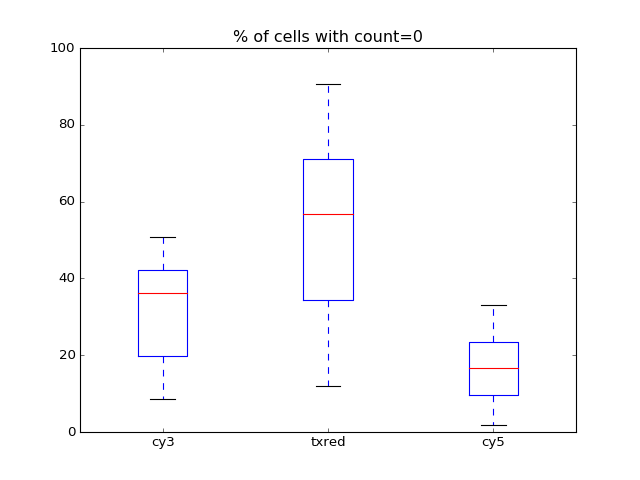

CY3 vs TxRed:  MannwhitneyuResult(statistic=38.0, pvalue=0.026497303140347657)
CY3 vs Cy5:    MannwhitneyuResult(statistic=28.0, pvalue=0.010500528945495554)
TxRed vs Cy5:  MannwhitneyuResult(statistic=11.0, pvalue=0.00039791202015221008)
CY3 vs TxRed:  Ttest_indResult(statistic=-2.626831976227828, pvalue=0.015400677525804343)
CY3 vs Cy5:    Ttest_indResult(statistic=2.7027451362462007, pvalue=0.013328499896608033)
TxRed vs Cy5:  Ttest_indResult(statistic=4.4743266765893503, pvalue=0.00020904925454020445)


In [297]:
#Number of cells with zero count

#Create dicrionary with percentage of cells with a zero count for each gene
hyb_zerosp = {}
total = df_fish.shape[1]
for n, i in enumerate(df_fish.index):
    hyb_zerosp[i] = ((total - np.count_nonzero(df_fish.iloc[n])) / total) *100

fig, ax = plt.subplots()

ax.boxplot([[hyb_zerosp[i] for i in channels['cy3_genes']],
    [hyb_zerosp[i] for i in channels['txred_genes']],
    [hyb_zerosp[i] for i in channels['cy5_genes']]])
ax.set_xticklabels(['cy3', 'txred', 'cy5'])
ax.set_title('% of cells with count=0')

print('CY3 vs TxRed: ' ,stats.mannwhitneyu([hyb_zerosp[i] for i in channels['cy3_genes']], [hyb_zerosp[i] for i in channels['txred_genes']]))
print('CY3 vs Cy5:   ' ,stats.mannwhitneyu([hyb_zerosp[i] for i in channels['cy3_genes']], [hyb_zerosp[i] for i in channels['cy5_genes']]))
print('TxRed vs Cy5: ' ,stats.mannwhitneyu([hyb_zerosp[i] for i in channels['txred_genes']], [hyb_zerosp[i] for i in channels['cy5_genes']]))
print('CY3 vs TxRed: ' ,stats.ttest_ind([hyb_zerosp[i] for i in channels['cy3_genes']], [hyb_zerosp[i] for i in channels['txred_genes']]))
print('CY3 vs Cy5:   ' ,stats.ttest_ind([hyb_zerosp[i] for i in channels['cy3_genes']], [hyb_zerosp[i] for i in channels['cy5_genes']]))
print('TxRed vs Cy5: ' ,stats.ttest_ind([hyb_zerosp[i] for i in channels['txred_genes']], [hyb_zerosp[i] for i in channels['cy5_genes']]))

<IPython.core.display.Javascript object>


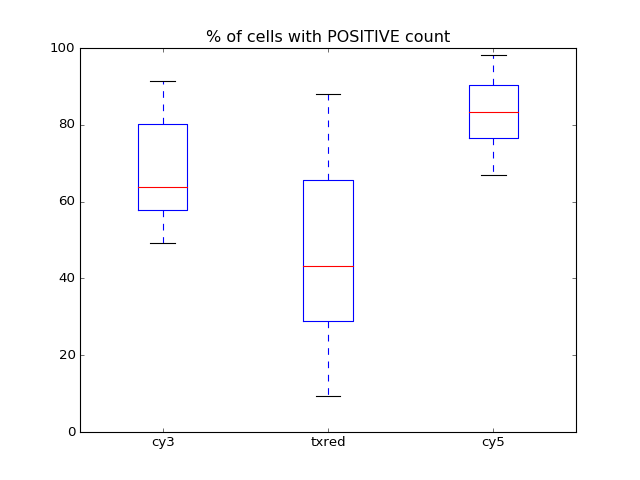

CY3 vs TxRed:  MannwhitneyuResult(statistic=38.0, pvalue=0.026497303140347657)
CY3 vs Cy5:    MannwhitneyuResult(statistic=28.0, pvalue=0.010500528945495554)
TxRed vs Cy5:  MannwhitneyuResult(statistic=11.0, pvalue=0.00039791202015221008)


In [298]:
#Number of cells with POSITIVE count

#Create dicrionary with percentage of cells with a zero count for each gene
hyb_positivep = {}
total = df_fish.shape[1]
for n, i in enumerate(df_fish.index):
    hyb_positivep[i] = ((np.count_nonzero(df_fish.iloc[n])) / total) *100

fig, ax = plt.subplots()

ax.boxplot([[hyb_positivep[i] for i in channels['cy3_genes']],
    [hyb_positivep[i] for i in channels['txred_genes']],
    [hyb_positivep[i] for i in channels['cy5_genes']]])
ax.set_xticklabels(['cy3', 'txred', 'cy5'])
ax.set_title('% of cells with POSITIVE count')

print('CY3 vs TxRed: ' ,stats.mannwhitneyu([hyb_positivep[i] for i in channels['cy3_genes']], [hyb_positivep[i] for i in channels['txred_genes']]))
print('CY3 vs Cy5:   ' ,stats.mannwhitneyu([hyb_positivep[i] for i in channels['cy3_genes']], [hyb_positivep[i] for i in channels['cy5_genes']]))
print('TxRed vs Cy5: ' ,stats.mannwhitneyu([hyb_positivep[i] for i in channels['txred_genes']], [hyb_positivep[i] for i in channels['cy5_genes']]))

### Round efficiency effect

In [553]:
#List of all gene names of smFISH experiment including the hybridization number
genes_fish = list(gene_name_conversion.keys())


<IPython.core.display.Javascript object>


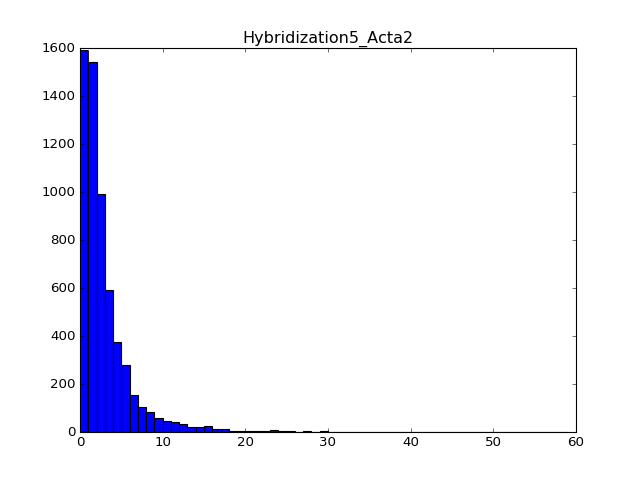

In [568]:
fig, ax = plt.subplots()

number = 26

ax.hist(df_fish.loc[genes_fish[number]], bins=df_fish.loc[genes_fish[number]].max())
ax.set_title(genes_fish[number])

# tSNE

<IPython.core.display.Javascript object>


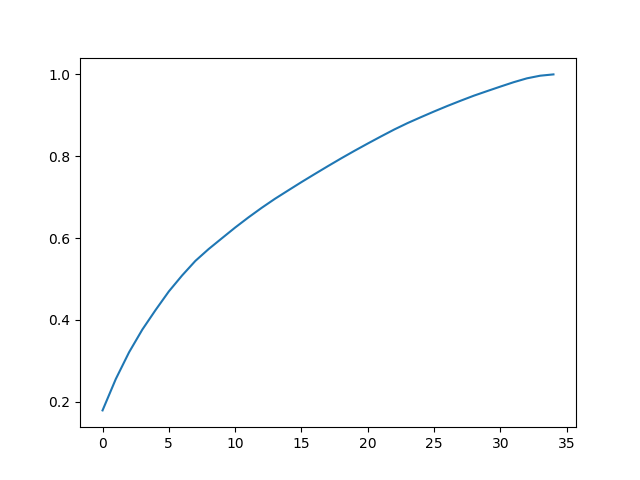

In [57]:
pca = PCA()
pc = pca.fit_transform(X_log.T)
#pc_fc = pca.fit_transform(X_fc.T) #
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))

<IPython.core.display.Javascript object>


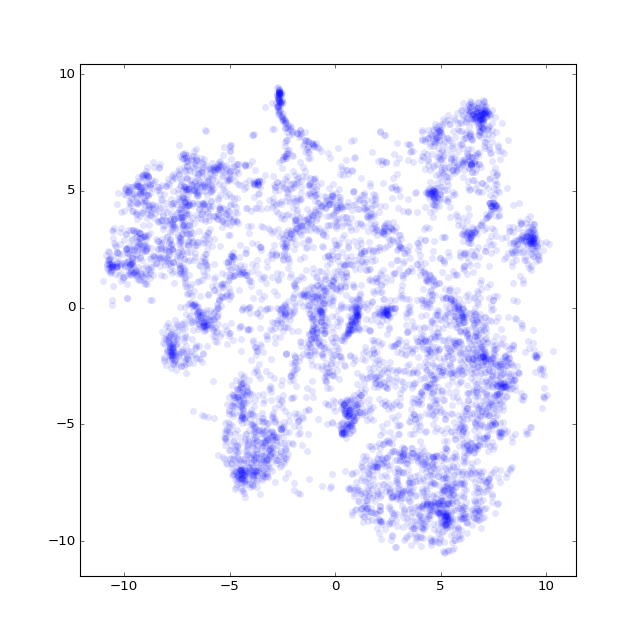

(<matplotlib.figure.Figure at 0x7f0e45509e48>,
 <matplotlib.collections.PathCollection at 0x7f0e455f5c50>)

In [340]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=20, )
#Transpose the data to work on the cells
tSNE_points = model.fit_transform(pc[:,:33])
scatter_tSNE(tSNE_points)
#pickle.dump(tSNE_points, open( "temp_tSNE/tSNE_cortexFISH_33pc_perplex50_EarlyEx20.p", "wb" ))

<IPython.core.display.Javascript object>


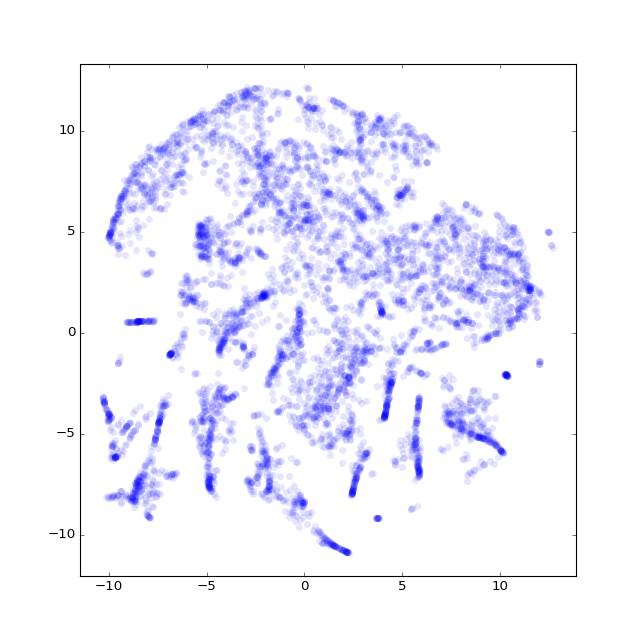

(<matplotlib.figure.Figure at 0x7f0e11c08e48>,
 <matplotlib.collections.PathCollection at 0x7f0e10cbe7b8>)

In [335]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=20)
#Transpose the data to work on the cells
tSNE_points15 = model.fit_transform(pc_fc[:,:15])
scatter_tSNE(tSNE_points)

In [320]:
#Load pre-calcualted point set
#tSNE_points = pickle.load(open("tSNE_cortexFISH_35pc_perplex50_v2.p", 'rb'))#Non-clean dataset
tSNE_points = pickle.load(open("temp_tSNE/tSNE_cortexFISH_33pc_perplex50_EarlyEx15.p", 'rb'))

<IPython.core.display.Javascript object>


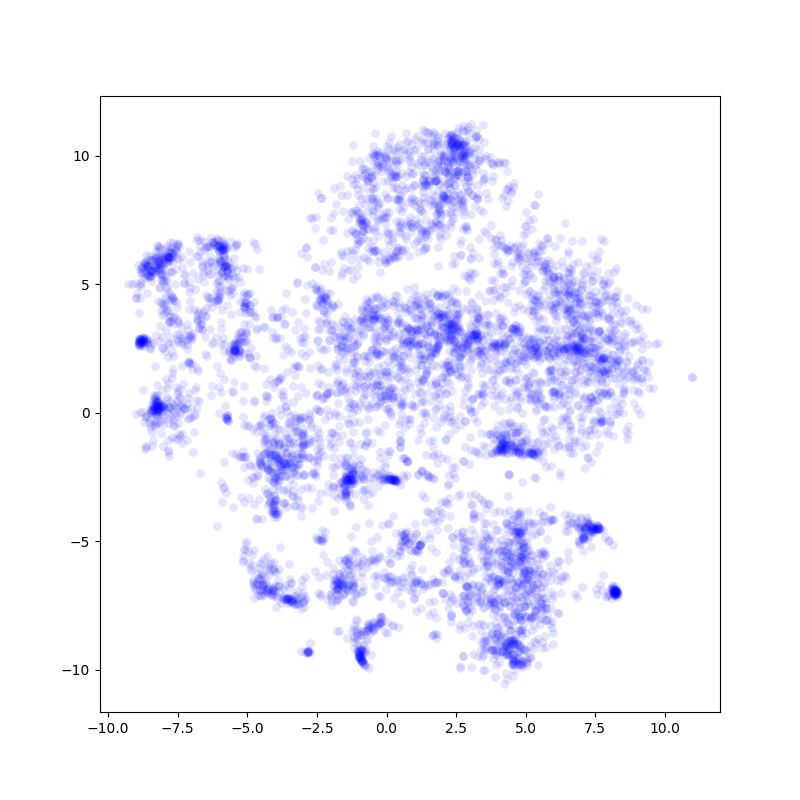

(<matplotlib.figure.Figure at 0x7f54cc837438>,
 <matplotlib.collections.PathCollection at 0x7f54cc8685c0>)

In [59]:
def scatter_tSNE(tSNE_data):
    
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=40, alpha = 0.1, c = 'blue')
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('on')
    ax.axis('tight')
    
    return f, ax, sc


scatter_tSNE(tSNE_points)

<IPython.core.display.Javascript object>


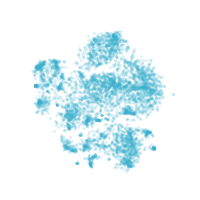

In [332]:
f = plt.figure(figsize=(2, 2))
ax = plt.subplot(aspect='equal')
sc = ax.scatter(tSNE_points[:,0], tSNE_points[:,1], lw=0, s=4, alpha = 0.2, c = [55/250,171/250,200/250])
plt.xlim(-25, 25)
plt.ylim(-25, 25)
ax.axis('off')
ax.axis('tight')
plt.savefig('mini_tSNE.png', dpi=300)

<IPython.core.display.Javascript object>


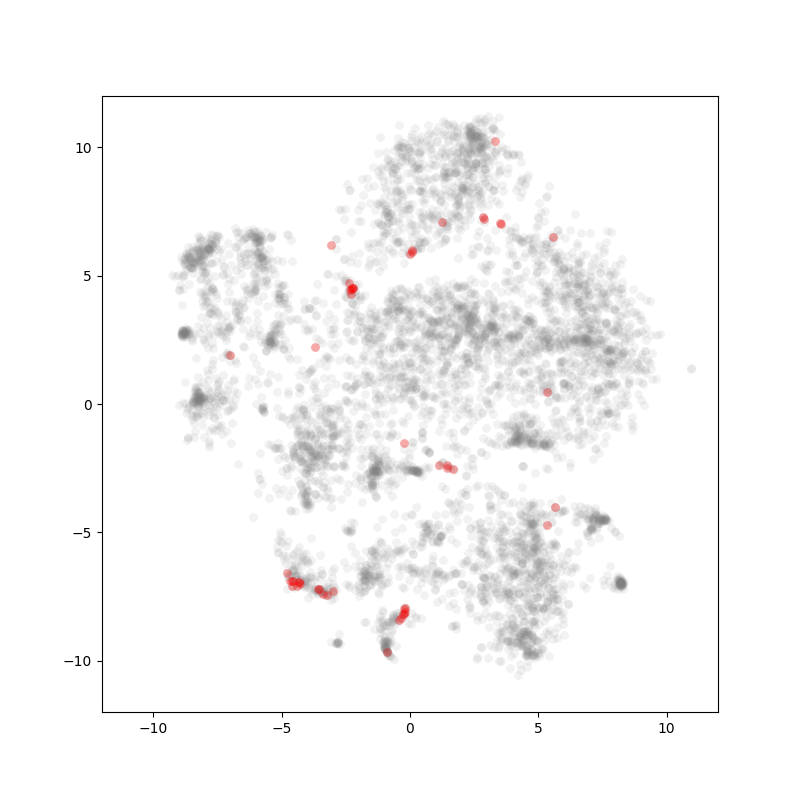

In [60]:
def  scatter_tSNE_cells_of_intrest(tSNE_data, cells_of_interest):
    plt.figure(figsize=(8,8))
    plt.subplot(aspect='equal')
    plt.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=40, alpha = 0.1, c = 'grey')
    
    tSNE_coord_df = pd.DataFrame(data= np.zeros([1,df_fish.shape[1]]), index=['tSNE1'], columns=df_fish.columns)
    tSNE_coord_df.loc['tSNE1'] = tSNE_data[:,0]
    tSNE_coord_df.loc['tSNE2'] = tSNE_data[:,1]
    tSNE_coord_df = tSNE_coord_df.loc[:,cells_of_interest]
    plt.scatter(tSNE_coord_df.loc['tSNE1'], tSNE_coord_df.loc['tSNE2'],lw=0, s=40, alpha = 0.3, c = 'red')
    
    plt.xlim(-12, 12)
    plt.ylim(-12, 12)
    ax.axis('on')
    ax.axis('tight')

    
def return_top_expression(gene, top_n, df):
    gene = gene_name_conversion_reverse[gene]
    top_expression = df.iloc[:, np.argsort(df.loc[gene])[::-1]].iloc[:,:top_n]
    return(top_expression.columns)

#Plot the top n expressing cells 
scatter_tSNE_cells_of_intrest(tSNE_points, return_top_expression('Lum', 50, df_fish) )

## tSNE on size normalized data

<IPython.core.display.Javascript object>


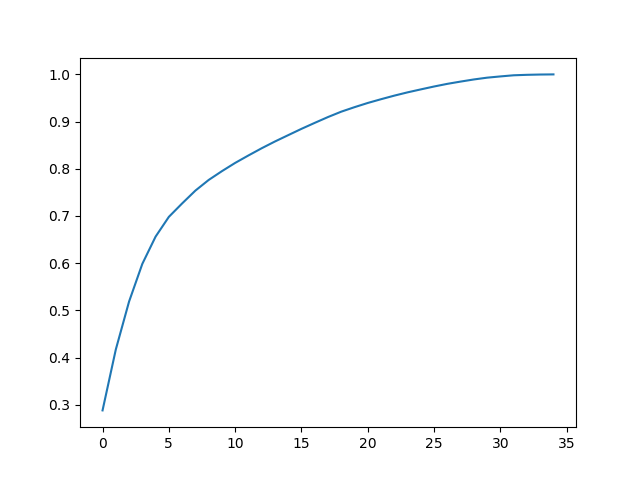

In [62]:
pca_size = PCA()
pc_size = pca_size.fit_transform(X_size_log.T)
#pc_fc = pca.fit_transform(X_fc.T) #
plt.figure()
plt.plot(np.cumsum(pca_size.explained_variance_ratio_))

<IPython.core.display.Javascript object>


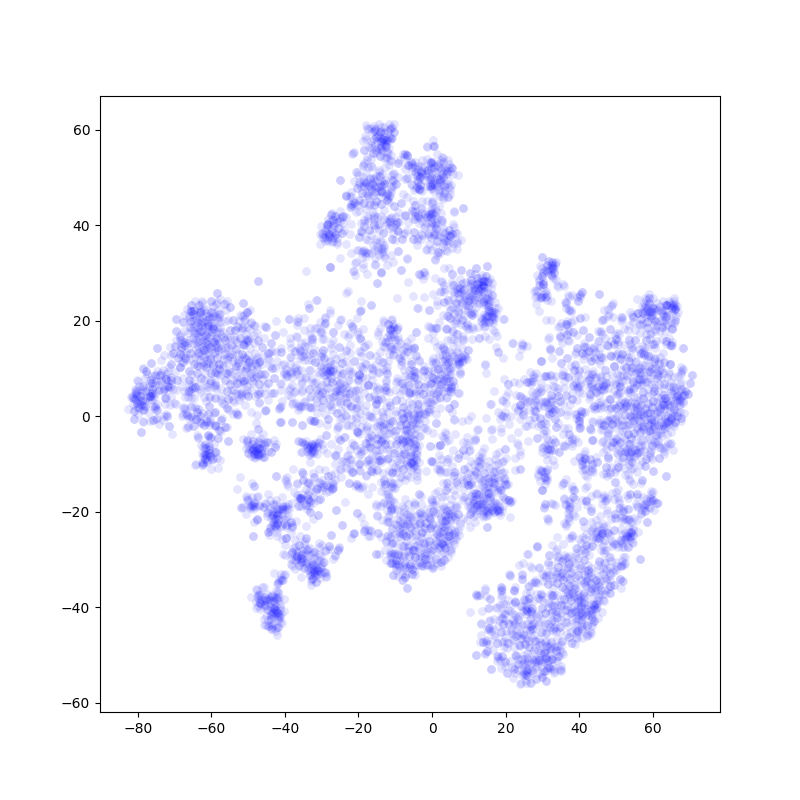

(<matplotlib.figure.Figure at 0x7f552a741ba8>,
 <matplotlib.collections.PathCollection at 0x7f552a7aeb38>)

In [64]:
model = TSNE(n_iter=1000, perplexity=50, early_exaggeration=20)
#Transpose the data to work on the cells
tSNE_points_size = model.fit_transform(pc_size[:,:30])
scatter_tSNE(tSNE_points_size)

<IPython.core.display.Javascript object>


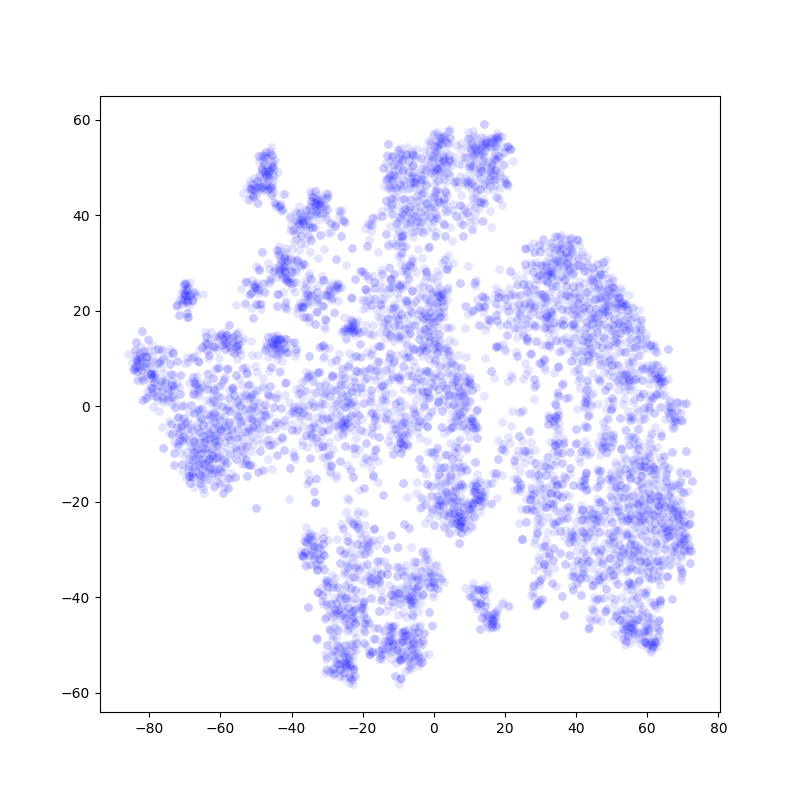

(<matplotlib.figure.Figure at 0x7f54cf44f160>,
 <matplotlib.collections.PathCollection at 0x7f54c3317b00>)

In [81]:
model = TSNE(n_iter=1000, perplexity=40, early_exaggeration=20)
#Transpose the data to work on the cells
tSNE_points_size2 = model.fit_transform(pc_size[:,:30])
scatter_tSNE(tSNE_points_size2)

<IPython.core.display.Javascript object>


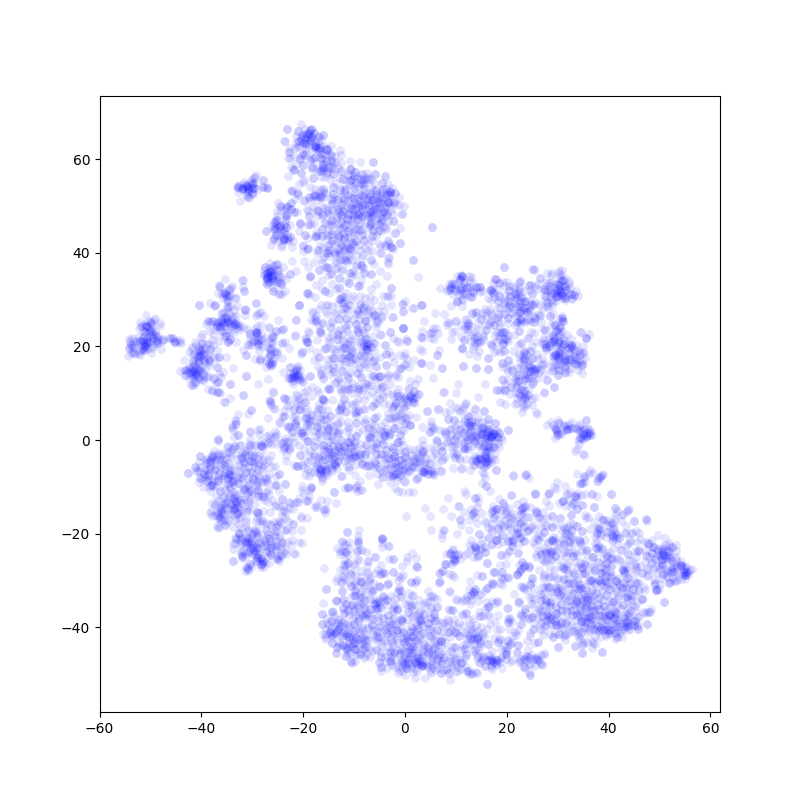

(<matplotlib.figure.Figure at 0x7f54c33173c8>,
 <matplotlib.collections.PathCollection at 0x7f54c32f64e0>)

In [82]:
model = TSNE(n_iter=1000, perplexity=60, early_exaggeration=20)
#Transpose the data to work on the cells
tSNE_points_size2 = model.fit_transform(pc_size[:,:30])
scatter_tSNE(tSNE_points_size2)

In [85]:
model = TSNE(n_iter=1000, perplexity=50, early_exaggeration=30)
#Transpose the data to work on the cells
tSNE_points_size3 = model.fit_transform(pc_size[:,:30])
scatter_tSNE(tSNE_points_size3)

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


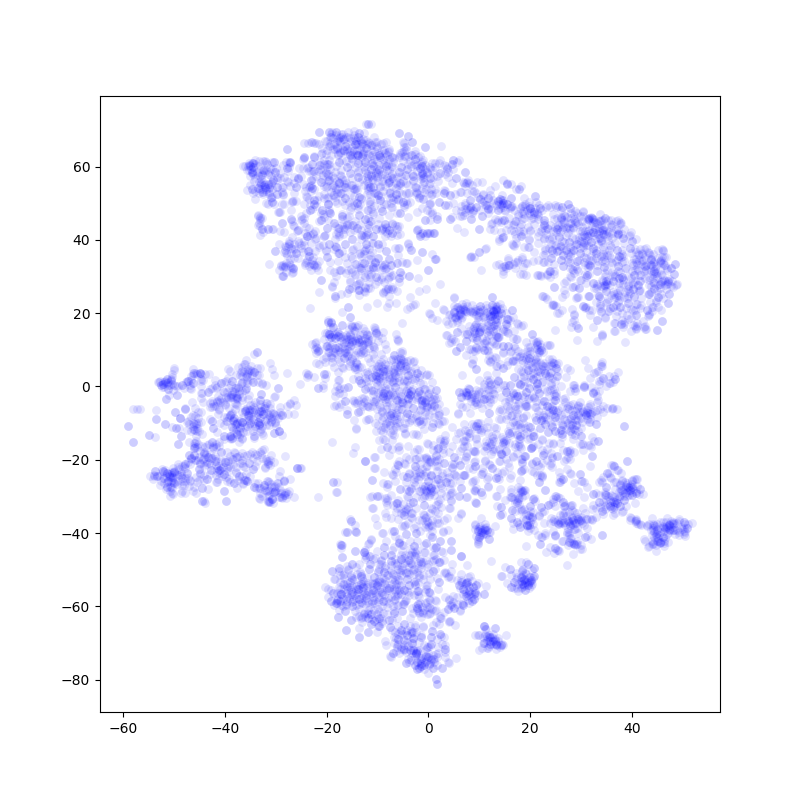

(<matplotlib.figure.Figure at 0x7f54c3273518>,
 <matplotlib.collections.PathCollection at 0x7f54c31e1ac8>)

In [84]:
model = TSNE(n_iter=1000, perplexity=50, early_exaggeration=40)
#Transpose the data to work on the cells
tSNE_points_size4 = model.fit_transform(pc_size[:,:30])
scatter_tSNE(tSNE_points_size4)

<IPython.core.display.Javascript object>


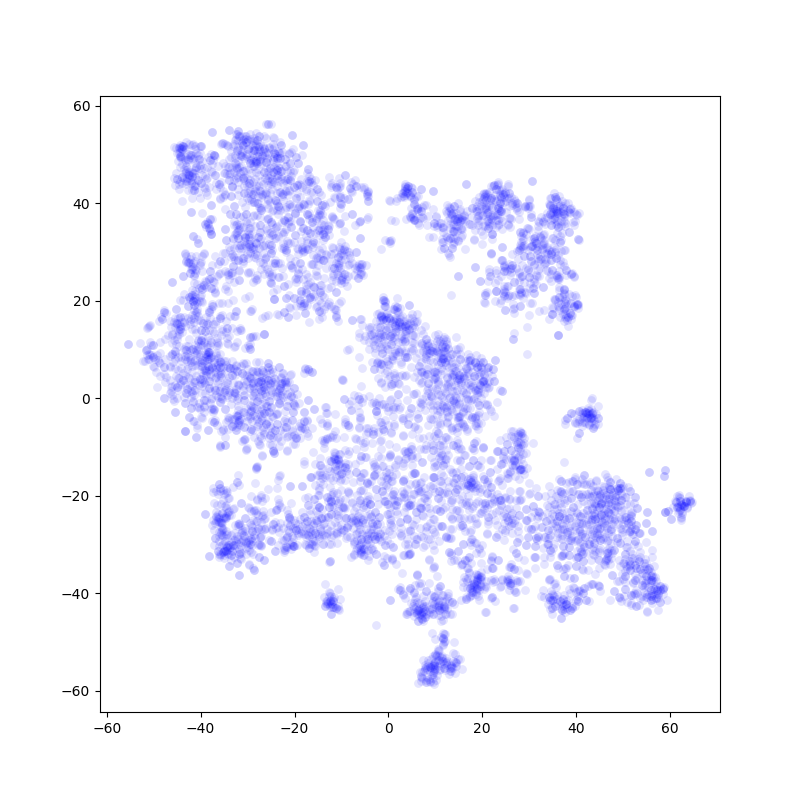

(<matplotlib.figure.Figure at 0x7f54c31e1da0>,
 <matplotlib.collections.PathCollection at 0x7f54c3121a90>)

In [86]:
model = TSNE(n_iter=1000, perplexity=50, early_exaggeration=50)
#Transpose the data to work on the cells
tSNE_points_size4 = model.fit_transform(pc_size[:,:30])
scatter_tSNE(tSNE_points_size4)

## tSNE Cytograph

In [37]:
import cytograph

In [497]:
import sys

In [47]:
from cytograph import TSNE as cytoTSNE

In [507]:
sys.path.insert(0, '/home/lars/programs/cytograph/bhtsne')

In [ ]:
cytograph.TSNE()

In [39]:
model = bhtsne()
tSNE_points_cyto = model.layout(pc[:,:33])
scatter_tSNE(tSNE_points_cyto)

NameError: name 'bhtsne' is not defined

<IPython.core.display.Javascript object>


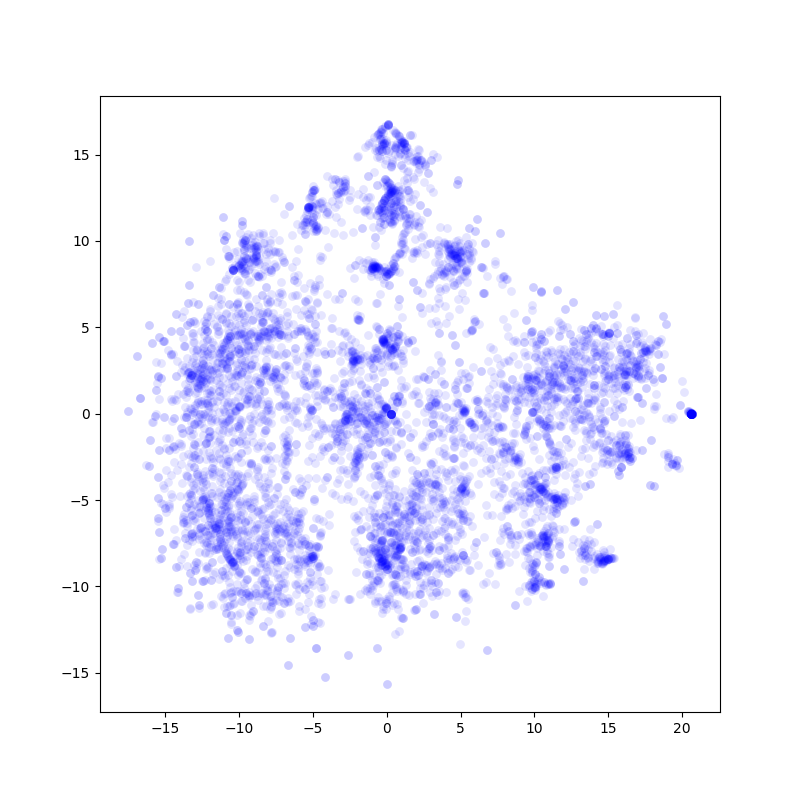

(<matplotlib.figure.Figure at 0x7fc9ac5867b8>,
 <matplotlib.collections.PathCollection at 0x7fc9ac6f09e8>)

In [53]:
model = cytoTSNE(max_iter=5000, perplexity=50, theta=.75)
tSNE_points_cyto = model.layout(pc[:,:33])
scatter_tSNE(tSNE_points_cyto)

<IPython.core.display.Javascript object>


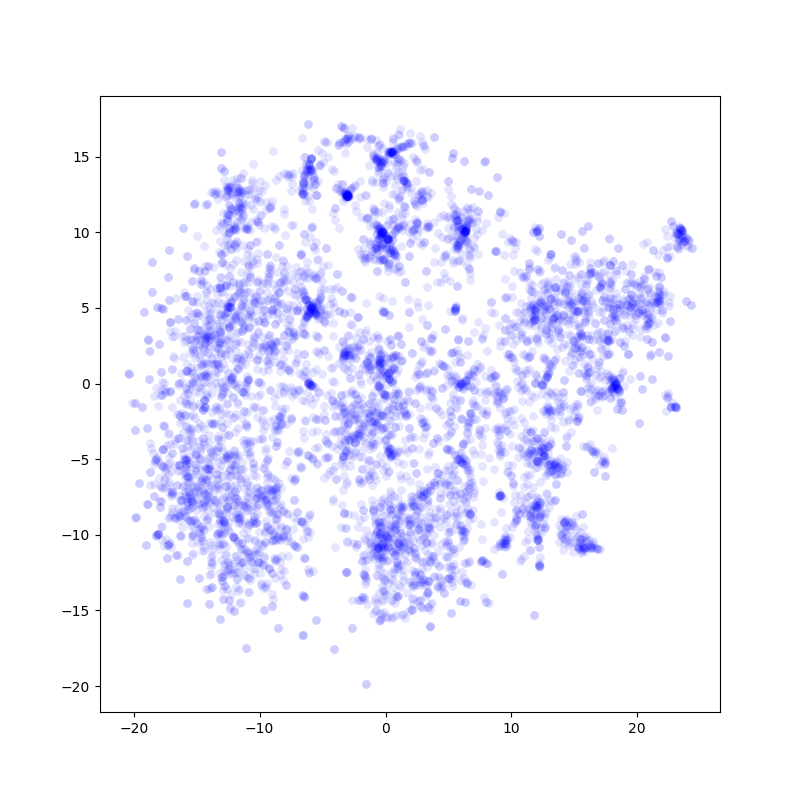

(<matplotlib.figure.Figure at 0x7fc9ac4741d0>,
 <matplotlib.collections.PathCollection at 0x7fc9a72bc1d0>)

In [55]:
model = cytoTSNE(max_iter=5000, perplexity=30, theta=.75)
tSNE_points_cyto = model.layout(pc[:,:33])
scatter_tSNE(tSNE_points_cyto)

<IPython.core.display.Javascript object>


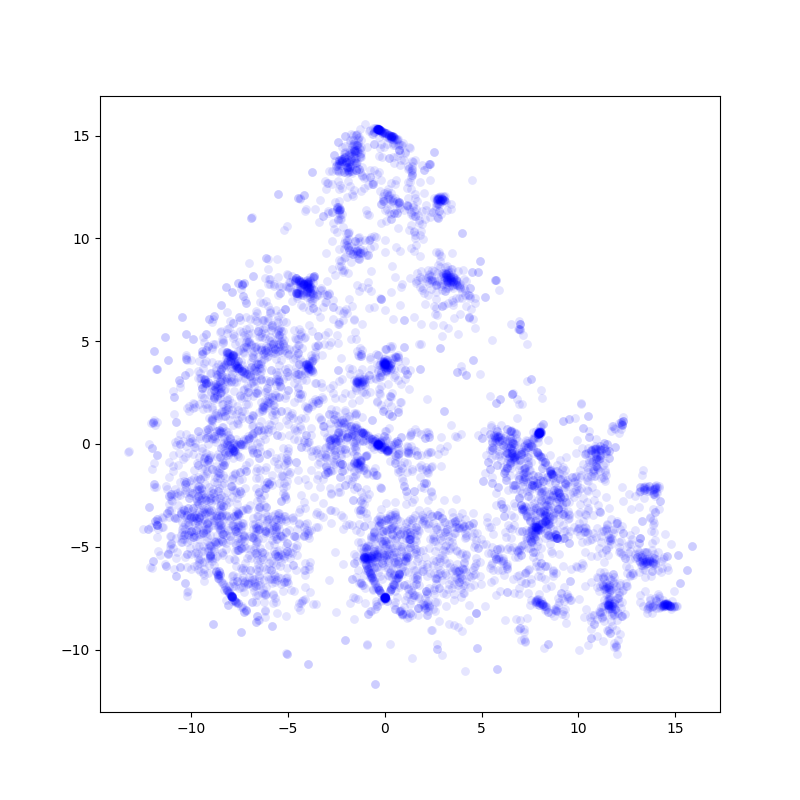

(<matplotlib.figure.Figure at 0x7fc9ac721518>,
 <matplotlib.collections.PathCollection at 0x7fc9ac5158d0>)

In [56]:
model = cytoTSNE(max_iter=5000, perplexity=70, theta=.75)
tSNE_points_cyto = model.layout(pc[:,:33])
scatter_tSNE(tSNE_points_cyto)

In [ ]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=20, )
#Transpose the data to work on the cells
tSNE_points = model.fit_transform(pc[:,:33])
scatter_tSNE(tSNE_points)

### tSNE on added feature dataset

In [82]:
pca = PCA()
pc2 = pca.fit_transform(df_fish_addfeature.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))

NameError: name 'df_fish_addfeature' is not defined

In [1790]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=20, )
#Transpose the data to work on the cells
tSNE_points_feat = model.fit_transform(pc2[:,:33])
scatter_tSNE(tSNE_points_feat)
#pickle.dump(tSNE_points, open( "temp_tSNE/tSNE_cortexFISH_33pc_perplex50_EarlyEx20.p", "wb" ))

KeyboardInterrupt: 

### tSNE on dataset with locations

/home/lars/programs/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 50 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


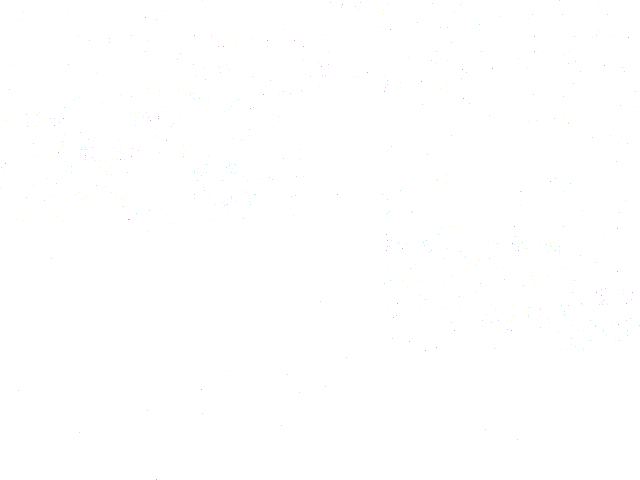

In [1994]:
pca = PCA()
pc3 = pca.fit_transform(df_fish_location.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [1792]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=20, )
#Transpose the data to work on the cells
tSNE_points_location = model.fit_transform(pc3[:,:33])
scatter_tSNE(tSNE_points_location)

KeyboardInterrupt: 

### Expression on tSNE

<IPython.core.display.Javascript object>


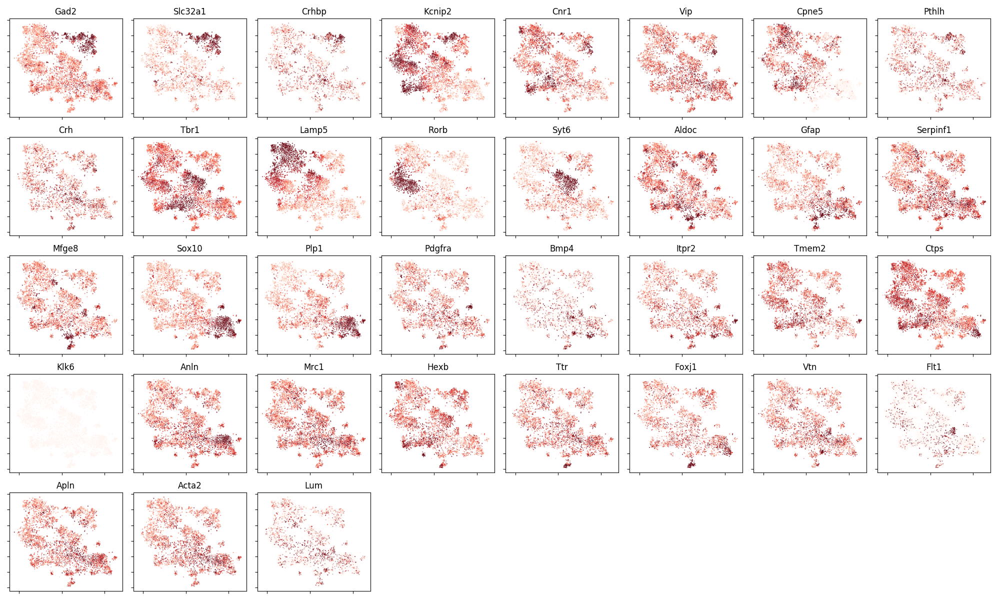

/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':
/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


In [87]:
#Expression plot on tSNE points
plt.figure(figsize=(20,12))
gs = plt.GridSpec(5,8)

dataset = X_log

for i, gene in enumerate(gene_sort_fish):
    plt.subplot(gs[i])
    filt = df_fish.index == gene
    levels = dataset[filt,:].flat[:]
    levels = np.clip(levels, np.percentile(levels, 10), np.percentile(levels,90))
    plt.scatter(tSNE_points_size4[:,0], tSNE_points_size4[:,1],color=plt.cm.Reds(levels/max(levels)), lw=0, alpha=.5,s=2)
    for label in plt.gca().axes.get_xticklabels():
        label.set_visible(False)
    for label in plt.gca().axes.get_yticklabels():
        label.set_visible(False)

    plt.title(gene.split('_')[1])
    plt.tight_layout()
    

#plt.savefig('Gene_expression_log.png', dpi=600)

# Clustering

In [66]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift, estimate_bandwidth, get_bin_seeds
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

## Cluster number estimation

### Elbow method (Kmeans)

<IPython.core.display.Javascript object>


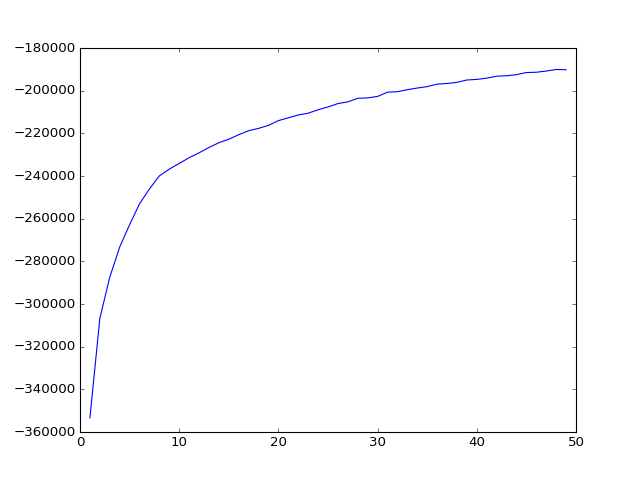

In [27]:
Ks = range(1, 50)
km = [KMeans(n_clusters=i) for i in Ks]
score = [km[i].fit(X_log.T).score(X_log.T) for i in range(len(km))]

plt.figure()
plt.plot(Ks, score)

Suggests ~8 clusters

### Silhouette plot (kmeans/AggClust)

In [288]:
#Mostly copied from: http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

range_n_clusters = np.arange(2,50,1)
#range_n_clusters = [40]

data = X_log.T

plt.figure(figsize=(18,(10*len(range_n_clusters))))
    
silhouette_avg_dict = {}
    
for row, n_clusters in enumerate(range_n_clusters):
    ax1 = plt.subplot2grid((len(range_n_clusters), 2), (row,0), rowspan=1, colspan=1)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])
    
    #CLUSTERING Kmeans or AgglomerativeClustering
    #cluster_algorithm = KMeans(n_clusters=n_clusters)
    cluster_algorithm = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = cluster_algorithm.fit_predict(data)

    silhouette_avg = silhouette_score(data, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    silhouette_avg_dict[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data, cluster_labels)
    
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
  
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the {} clusters.".format(n_clusters))
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    ax1.set_ylim(top=y_upper)

    # 2nd Plot showing the actual clusters formed
    ax2 = plt.subplot2grid((len(range_n_clusters), 2), (row,1), rowspan=1, colspan=1)
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(tSNE_points[:, 0], tSNE_points[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("tSNE 1")
    ax2.set_ylabel("tSNE 2")

    plt.suptitle(("Silhouette analysis for AgglomerativeClustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

#plt.savefig('Silhouette_analysis_AggClust_25-50clusters.png')
    

<IPython.core.display.Javascript object>

For n_clusters = 2 The average silhouette_score is : 0.154394374405
For n_clusters = 3 The average silhouette_score is : 0.113730662345
For n_clusters = 4 The average silhouette_score is : 0.0884204249791
For n_clusters = 5 The average silhouette_score is : 0.0899432195023
For n_clusters = 6 The average silhouette_score is : 0.0634700436779
For n_clusters = 7 The average silhouette_score is : 0.0699286339542
For n_clusters = 8 The average silhouette_score is : 0.0728726583517
For n_clusters = 9 The average silhouette_score is : 0.0686104075915
For n_clusters = 10 The average silhouette_score is : 0.0682938210793
For n_clusters = 11 The average silhouette_score is : 0.0572151478435
For n_clusters = 12 The average silhouette_score is : 0.0387362936253
For n_clusters = 13 The average silhouette_score is : 0.0400175222328
For n_clusters = 14 The average silhouette_score is : 0.0402744060642
For n_clusters = 15 The average silhouette_score is : 0.0397037932305
For n_clusters = 16 The averag

For n_clusters = 2 The average silhouette_score is : 0.154394374405  
For n_clusters = 3 The average silhouette_score is : 0.113730662345  
For n_clusters = 4 The average silhouette_score is : 0.0884204249791  
For n_clusters = 5 The average silhouette_score is : 0.0899432195023  
For n_clusters = 6 The average silhouette_score is : 0.0634700436779  
For n_clusters = 7 The average silhouette_score is : 0.0699286339542  
For n_clusters = 8 The average silhouette_score is : 0.0728726583517  
For n_clusters = 9 The average silhouette_score is : 0.0686104075915  
For n_clusters = 10 The average silhouette_score is : 0.0682938210793  
For n_clusters = 11 The average silhouette_score is : 0.0572151478435  
For n_clusters = 12 The average silhouette_score is : 0.0387362936253  
For n_clusters = 13 The average silhouette_score is : 0.0400175222328  
For n_clusters = 14 The average silhouette_score is : 0.0402744060642  
For n_clusters = 15 The average silhouette_score is : 0.0397037932305  
For n_clusters = 16 The average silhouette_score is : 0.0407893606547  
For n_clusters = 17 The average silhouette_score is : 0.0403650767148  
For n_clusters = 18 The average silhouette_score is : 0.0364709446191  
For n_clusters = 19 The average silhouette_score is : 0.0375083932611  
For n_clusters = 20 The average silhouette_score is : 0.0382517156834  
For n_clusters = 21 The average silhouette_score is : 0.0400260783349  
For n_clusters = 22 The average silhouette_score is : 0.0366484411559  
For n_clusters = 23 The average silhouette_score is : 0.0373432210509  
For n_clusters = 24 The average silhouette_score is : 0.0385092916842  
For n_clusters = 25 The average silhouette_score is : 0.0317282617718  
For n_clusters = 26 The average silhouette_score is : 0.0306447764943  
For n_clusters = 27 The average silhouette_score is : 0.0308523232573  
For n_clusters = 28 The average silhouette_score is : 0.0309823765791  
For n_clusters = 29 The average silhouette_score is : 0.0316622427224  
For n_clusters = 30 The average silhouette_score is : 0.0324194059259  
For n_clusters = 31 The average silhouette_score is : 0.020692519216  
For n_clusters = 32 The average silhouette_score is : 0.0220986579542  
For n_clusters = 33 The average silhouette_score is : 0.0232650275977  
For n_clusters = 34 The average silhouette_score is : 0.0242911741337  
For n_clusters = 35 The average silhouette_score is : 0.0249045083832  
For n_clusters = 36 The average silhouette_score is : 0.0252260679185  
For n_clusters = 37 The average silhouette_score is : 0.0259400728089  
For n_clusters = 38 The average silhouette_score is : 0.0272363844287  
For n_clusters = 39 The average silhouette_score is : 0.0277905739646  
For n_clusters = 40 The average silhouette_score is : 0.0285407236705  
For n_clusters = 41 The average silhouette_score is : 0.0279043373405  
For n_clusters = 42 The average silhouette_score is : 0.0282603043511  
For n_clusters = 43 The average silhouette_score is : 0.0263960411557  
For n_clusters = 44 The average silhouette_score is : 0.025646670401  
For n_clusters = 45 The average silhouette_score is : 0.0262094235034  
For n_clusters = 46 The average silhouette_score is : 0.0265275599925  
For n_clusters = 47 The average silhouette_score is : 0.027168671357  
For n_clusters = 48 The average silhouette_score is : 0.0275528168165  
For n_clusters = 49 The average silhouette_score is : 0.027425381776  

<IPython.core.display.Javascript object>


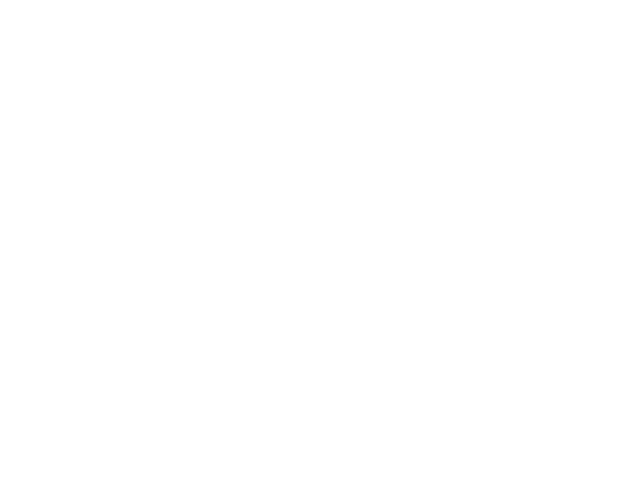

NameError: name 'silhouette_avg_dict' is not defined

In [28]:
plt.figure()
plt.plot(range(2, len(silhouette_avg_dict)+2), list(silhouette_avg_dict.values()))
plt.ylabel('Average silhouette width')
plt.xlabel('Clusters')

### Gap statistics

In [303]:
#From here: https://anaconda.org/milesgranger/gap-statistic/notebook

def optimalK(data, nrefs=3, maxClusters=15):
    """
    Calculates KMeans optimal K using Gap Statistic from Tibshirani, Walther, Hastie
    Params:
        data: ndarry of shape (n_samples, n_features)
        nrefs: number of sample reference datasets to create
        maxClusters: Maximum number of clusters to test for
    Returns: (gaps, optimalK)
    """
    gaps = np.zeros((len(range(1, maxClusters)),))
    resultsdf = pd.DataFrame({'clusterCount':[], 'gap':[]})
    for gap_index, k in enumerate(range(1, maxClusters)):

        # Holder for reference dispersion results
        refDisps = np.zeros(nrefs)

        # For n references, generate random sample and perform kmeans getting resulting dispersion of each loop
        for i in range(nrefs):
            
            # Create new random reference set by shuffeling the data
            #randomReference = data #make a copy
            #np.random.shuffle(randomReference) #But is does not work
            randomReference = np.random.random_sample(size=data.shape) #Original function from Miles Granger
            
            # Fit to it
            km = KMeans(k)
            km.fit(randomReference)
            #km.fit(randomReference)
            
            refDisp = km.inertia_
            refDisps[i] = refDisp

        # Fit cluster to original data and create dispersion
        km = KMeans(k)
        km.fit(data)
        
        origDisp = km.inertia_

        # Calculate gap statistic
        gap = np.log(np.mean(refDisps)) - np.log(origDisp)

        # Assign this loop's gap statistic to gaps
        gaps[gap_index] = gap
        
        resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)

    return (gaps.argmax() + 1, resultsdf)  # Plus 1 because index of 0 means 1 cluster is optimal, index 2 = 3 clusters are optimal

k, gapdf = optimalK(X_log.T, nrefs=5, maxClusters=70)    

<IPython.core.display.Javascript object>


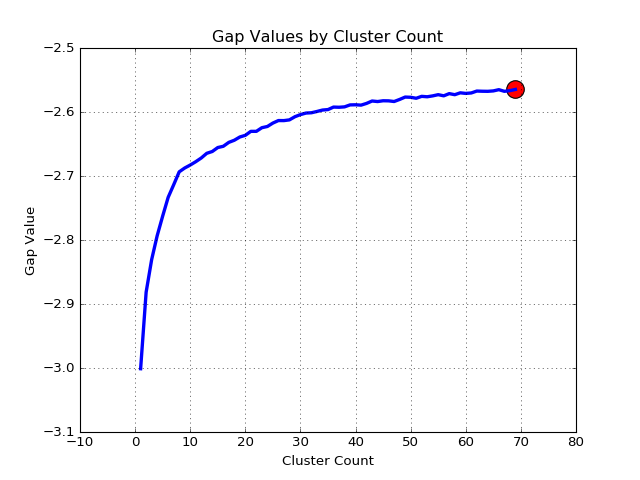

In [304]:
plt.figure()
plt.plot(gapdf.clusterCount, gapdf.gap, linewidth=3)
plt.scatter(gapdf[gapdf.clusterCount == k].clusterCount, gapdf[gapdf.clusterCount == k].gap, s=250, c='r')
plt.grid(True)
plt.xlabel('Cluster Count')
plt.ylabel('Gap Value')
plt.title('Gap Values by Cluster Count')
#plt.savefig('Gap_statistics_0-70clusters.png')

## Other clustering methods

In [880]:
#DBscan
db = DBSCAN(eps=0.9, min_samples=30, metric='jaccard', algorithm='brute').fit(X_log.T) #correlation
#Jaccard eps=0.999, min_samples=6

print(db.labels_.shape, len(np.unique(db.labels_)), db.labels_)
Counter(db.labels_)

(6036,) 28 [-1 11 -1 ..., -1 -1 -1]


Counter({-1: 4737,
         0: 58,
         1: 49,
         2: 46,
         3: 61,
         4: 130,
         5: 44,
         6: 54,
         7: 69,
         8: 35,
         9: 42,
         10: 79,
         11: 60,
         12: 42,
         13: 61,
         14: 49,
         15: 31,
         16: 30,
         17: 46,
         18: 58,
         19: 30,
         20: 34,
         21: 30,
         22: 37,
         23: 30,
         24: 30,
         25: 31,
         26: 33})

In [785]:
#Mean Shift
bandwidth = estimate_bandwidth(X_log.T, quantile=0.1, n_samples=50)
seeds = get_bin_seeds(X_log.T, bin_size=bandwidth)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, seeds=seeds)
ms.fit(X_log.T)
print(ms.labels_.shape, len(np.unique(ms.labels_)),np.unique(ms.labels_), ms.labels_)
Counter(ms.labels_)

(6036,) 2 [0 1] [0 0 0 ..., 0 0 0]


Counter({0: 6031, 1: 5})

In [761]:
# Affinity Propagation
af = AffinityPropagation(damping=0.99, max_iter=200, convergence_iter=15, 
                         copy=True, preference=.9, affinity='euclidean').fit(X_log.T)
print(af.labels_.shape, len(np.unique(af.labels_)),np.unique(af.labels_), af.labels_)

(6036,) 275 [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 24

In [64]:
# KMeans
kmeans30 = KMeans(n_clusters=30, n_init=20, max_iter=600, n_jobs=6)
kmeans30.fit(X_log.T)

KMeans(copy_x=True, init='k-means++', max_iter=600, n_clusters=30, n_init=20,
    n_jobs=6, precompute_distances='auto', random_state=None, tol=0.0001,
    verbose=0)

## Hierarchical clustering all cells

In [911]:
ac4 = AgglomerativeClustering(n_clusters=4).fit(X_log.T)
ac5 = AgglomerativeClustering(n_clusters=5).fit(X_log.T)
ac6 = AgglomerativeClustering(n_clusters=6).fit(X_log.T)
ac7 = AgglomerativeClustering(n_clusters=7).fit(X_log.T)
ac8 = AgglomerativeClustering(n_clusters=8).fit(X_log.T)
ac9 = AgglomerativeClustering(n_clusters=9).fit(X_log.T)
ac10 = AgglomerativeClustering(n_clusters=10).fit(X_log.T)
ac11 = AgglomerativeClustering(n_clusters=11).fit(X_log.T)
ac12 = AgglomerativeClustering(n_clusters=12).fit(X_log.T)

In [127]:
#Hierarchical
#ac20 = AgglomerativeClustering(n_clusters=20).fit(X_log.T)
#ac21 = AgglomerativeClustering(n_clusters=21).fit(X_log.T)
#ac22 = AgglomerativeClustering(n_clusters=22).fit(X_log.T)
#ac23 = AgglomerativeClustering(n_clusters=23).fit(X_log.T)
#ac24 = AgglomerativeClustering(n_clusters=24).fit(X_log.T)
#ac25 = AgglomerativeClustering(n_clusters=25).fit(X_log.T)
#ac26 = AgglomerativeClustering(n_clusters=26).fit(X_log.T)
#ac27 = AgglomerativeClustering(n_clusters=27).fit(X_log.T)
#ac28 = AgglomerativeClustering(n_clusters=28).fit(X_log.T)
#ac29 = AgglomerativeClustering(n_clusters=29).fit(X_log.T)
ac30 = AgglomerativeClustering(n_clusters=30).fit(X_log.T)
ac31 = AgglomerativeClustering(n_clusters=31).fit(X_log.T)
ac32 = AgglomerativeClustering(n_clusters=32).fit(X_log.T)
ac33 = AgglomerativeClustering(n_clusters=33).fit(X_log.T)
ac34 = AgglomerativeClustering(n_clusters=34).fit(X_log.T)
ac35 = AgglomerativeClustering(n_clusters=35).fit(X_log.T)
ac36 = AgglomerativeClustering(n_clusters=36).fit(X_log.T)
ac37 = AgglomerativeClustering(n_clusters=37).fit(X_log.T)
ac38 = AgglomerativeClustering(n_clusters=38).fit(X_log.T)
ac39 = AgglomerativeClustering(n_clusters=39).fit(X_log.T)
ac40 = AgglomerativeClustering(n_clusters=40).fit(X_log.T)
ac41 = AgglomerativeClustering(n_clusters=41).fit(X_log.T)
ac42 = AgglomerativeClustering(n_clusters=42).fit(X_log.T)
ac43 = AgglomerativeClustering(n_clusters=43).fit(X_log.T)
ac44 = AgglomerativeClustering(n_clusters=44).fit(X_log.T)
ac45 = AgglomerativeClustering(n_clusters=45).fit(X_log.T)

### Clustering all types

In [ ]:
ac30 = AgglomerativeClustering(n_clusters=30, affinity='euclidean', linkage='ward').fit(X_log.T)

In [187]:
ac30_pc33 = AgglomerativeClustering(n_clusters=30).fit(pc[:,:33])
ac30_pc20 = AgglomerativeClustering(n_clusters=30).fit(pc[:,:20])

In [305]:
#Clustering on fold change data. Work but a third of the cells end up in a cluster of low expressing cells. 
ac30_fc = AgglomerativeClustering(n_clusters=30).fit(np.array(df_fish_fc.values).T)

In [392]:
ac47 = AgglomerativeClustering(n_clusters=47).fit(np.array(df_fish.values).T)

In [661]:
#Clustering on the raw count data. Similar results as on the Fold Change data
ac30_X = AgglomerativeClustering(n_clusters=30).fit(X.T)
ac30_Norm = AgglomerativeClustering(n_clusters=30).fit(X_norm.T)

In [454]:
ac30_sqrt = AgglomerativeClustering(n_clusters=30).fit(X_sqrt.T)
ac6_sqrt = AgglomerativeClustering(n_clusters=6).fit(X_sqrt.T)

In [1749]:
#Save model as pickle file
pickle.dump(ac30, open('Clustering_model_ac30.pkl', 'wb'))
model_pkl.close()

In [67]:
#Load model
ac30 = pickle.load(open('Clustering_model_ac30.pkl', 'rb'))

/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/sklearn/base.py:312: UserWarning: Trying to unpickle estimator AgglomerativeClustering from version pre-0.18 when using version 0.19.0. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [68]:
ac30

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward',
            memory=Memory(cachedir=None), n_clusters=30,
            pooling_func=<function mean at 0x7f5549de39d8>)

### Clustering Major - Minor types

In [411]:
major_type_markers = ['Hybridization12_Slc32a1',
                     'Hybridization1_Tbr1',
                      'Hybridization7_Sox10',
                      'Hybridization1_Aldoc',
                      'Hybridization3_Hexb',
                      'Hybridization3_Mrc1',
                      'Hybridization1_Foxj1',
                      'Hybridization12_Vtn',
                      'Hybridization2_Flt1',
                      'Hybridization5_Acta2',
                      'Hybridization9_Lum']

df_fish_log_major = df_fish_log.loc[major_type_markers,:]
ac11_major = AgglomerativeClustering(n_clusters=11).fit(df_fish_log_major.T)

In [413]:
ac11_all = AgglomerativeClustering(n_clusters=11).fit(df_fish_log.T)

Major cell type clustering does not yield the 11 intended clusters. For instance, the oligodendrocytes are split into two clusters

### Clustering on added featrues dataset

In [1497]:
ac_addfeatures = AgglomerativeClustering(n_clusters=35).fit(np.array(df_fish_addfeature.values).T)

### Clustering on dataset with XY location

In [1525]:
ac_location = AgglomerativeClustering(n_clusters=35).fit(np.array(df_fish_location.values).T)

### Clustering on size corrected data

In [101]:
ac_size = AgglomerativeClustering(n_clusters=35).fit(np.array(df_fish_size_log.values).T)

### Two step clustering

In [104]:
#Major cell types
ac6 = AgglomerativeClustering(n_clusters=6).fit(X_log.T)
#0: L6, Hippocampus, Bad neurons
#1: L4
#2: Int
#3: Oligo
#4: Astocytes, other glia
#5: L2/3, L5

major_label_cells = gen_labels(df_fish, ac6)[1]

In [111]:
major_label_cells

{0: ['2325',
  '2400',
  '5992',
  '2573',
  '330',
  '6527',
  '3862',
  '4008',
  '3394',
  '5228',
  '7062',
  '7775',
  '4028',
  '7548',
  '7331',
  '7381',
  '4284',
  '4356',
  '2367',
  '7682',
  '7867',
  '2196',
  '5872',
  '5188',
  '6239',
  '5475',
  '7422',
  '4112',
  '6265',
  '7586',
  '6308',
  '7751',
  '4154',
  '5463',
  '5773',
  '2155',
  '7353',
  '4123',
  '7415',
  '4433',
  '6263',
  '7572',
  '4090',
  '2761',
  '4362',
  '595',
  '3985',
  '5238',
  '6417',
  '2429',
  '2583',
  '45',
  '7268',
  '6271',
  '2397',
  '7569',
  '6292',
  '4337',
  '2301',
  '4169',
  '246',
  '2446',
  '7616',
  '7774',
  '7041',
  '4130',
  '6171',
  '7093',
  '898',
  '6776',
  '7855',
  '7260',
  '5245',
  '6316',
  '4125',
  '820',
  '7387',
  '5126',
  '7573',
  '5017',
  '1577',
  '2572',
  '837',
  '4398',
  '7228',
  '1624',
  '4097',
  '911',
  '6642',
  '6811',
  '5341',
  '4349',
  '4057',
  '7769',
  '1524',
  '3680',
  '7427',
  '4406',
  '7021',
  '6801',
  '242

In [105]:
#Second step clustering, major 0
major0_label_cells = gen_labels(df_fish, ac6)[1]
df_fish_log_major0 = df_fish_log.loc[:,major0_label_cells[0]]

ac_major0_5 = AgglomerativeClustering(n_clusters=5).fit(df_fish_log_major0.T)
#0_0: bleached cells
#0_1: L6
#0_2: L5 (Cnr1, Cpne5)
#0_3: Bad cells
#0_4: Hippocampal ?Neurons

In [106]:
#Second step clustering, major 1
major1_label_cells = gen_labels(df_fish, ac6)[1]
df_fish_log_major1 = df_fish_log.loc[:,major1_label_cells[1]]

#NO FURTHER SPLIT NESSECARY
#1: L4

#Hack to generate an object with a .labels_ attribute, for downstream handling
class ac_major1_1():
    pass

ac_major1_1.labels_ = np.array([0] * df_fish_log_major1.shape[1])

In [107]:
#Second step clustering, major 2
df_fish_log_major2 = df_fish_log.loc[:,major_label_cells[2]]

ac_major2_10 = AgglomerativeClustering(n_clusters=10).fit(df_fish_log_major2.T)

#10 Clusters looks ok but difficult to decide
#2_0: int - Crh, Cnr1
#2_1: int - Pthlh, Kcnip2
#2_2: int - Kcnip2 (Caudoputamen)
#2_3: int - Cpne5
#2_4: int - Crhbp, Cpne5
#2_5: int - Pthlh, Cnr1, Vip, Crh
#2_6: int - Crh, Vip
#2_7: int - Cnr1
#2_8: int - Crhbp
#2_9: Oligodendrocytes


In [378]:
#Second step clustering, major 3
df_fish_log_major3 = df_fish_log.loc[:,major_label_cells[3]]

ac_major3_5 = AgglomerativeClustering(n_clusters=5).fit(df_fish_log_major3.T)
#3_0: Olig - Mature, Anln
#3_1: Olig - Intermediate, Cpts
#3_2: Olig - COP, Bmp4
#3_3: Olig - (unclear)
#3_4: Olig - Newly formed, Itpr2, Tmem2

In [109]:
#Second step clustering, major 4
df_fish_log_major4 = df_fish_log.loc[:,major_label_cells[4]]

ac_major4_12 = AgglomerativeClustering(n_clusters=12).fit(df_fish_log_major4.T)

#4_0: Endothelial (bad profile)
#4_1: Astro 2
#4_2: Astro 1
#4_3: Choroid plexus? 
#4_4: Endothelial
#4_5: Ependymal
#4_6: Endo1 (Artifact, all on right edge)
#4_7: Astro 1 (Pia)
#4_8: Ependymal (between CC and Hipp)
#4_9: OPC
#4_10: Astro1 Mfge8+ subset
#4_11: VLMC



In [110]:
#Second step clustering, major 5
df_fish_log_major5 = df_fish_log.loc[:,major_label_cells[5]]

ac_major5_2 = AgglomerativeClustering(n_clusters=2).fit(df_fish_log_major5.T)

#5_0: L2/3
#5_1: L5

In [77]:
def combine_sub_clusters(list_models, list_dfs):
    #Cell labels: Dictionary of each cell with label as key
    cell_labels = {}
    
    n_clusters = 0 
    for i, j in zip(list_dfs, list_models):
        j = j.labels_ + n_clusters
        n_clusters += len(np.unique(j))
        cell_labels.update(dict(zip(i.columns, j)))
    
    #Label cells: dictionary with all labels and a list of cells
    label_cells = {}
    for l in np.unique(list(cell_labels.values())):
        label_cells[l] = []
    for i in cell_labels:
        label_cells[cell_labels[i]].append(i)

    #combine df
    df_combined = pd.concat(list_dfs, axis=1)
    
    cellID = df_combined.columns
    
    labels =[]
    for i in df_combined.columns:
        labels.append(cell_labels[i])
    labels_a = np.array(labels)
        
    return cell_labels, label_cells, df_combined, cellID, labels, labels_a

#cell_labels, label_cells, combine_df, cellID, labels, labels_a = combine_sub_clusters([ac_major0_5, ac_major1_1, ac_major2_10, ac_major3_5, ac_major4_12, ac_major5_2], 
#                     [df_fish_log_major0, df_fish_log_major1, df_fish_log_major2, df_fish_log_major3, df_fish_log_major4, df_fish_log_major5])

cluster_labels = [
'Bleached-cells', 'Pyramidal-L6', 'Pyramidal-L5-1', 'Bad-cells', 'Hippocampal',
'Pyramidal-L4',
'Int_Crh-Cnr1', 'Int_Pthlh-Kcnip2', 'Int-Kcnip2', 'Int-Cpne5', 'Int-Crhbp-Cpne5', 'Int-Pthlh-Cnr1-Vip-Crh', 'Int-Crh-Vip', 'Int-Cnr1', 'Int-Crhbp', 'Olig-IntCluster',
'Olig-Mature', 'Olig-Intermediate', 'Olig-COP', 'Olig-unclear', 'Olig-NF',
'Endothelial-bad', 'Astro2-1', 'Astro2-2', 'Coroid-plexus', 'Endothelial', 'Ependymal', 'Endothelial-artefact', 'Astro1-pia', 'Ependymal-ventricle', 'OPC', 'Astro1-Mfge8+', 'VLMC',
'Pyramidal-L2/3', 'Pyramidal-L5-2']
#Missing: Microglia, Pericytes(vtn)


#Sort the clusters manually
cluster_sort_labels = ['Int-Crhbp-Cpne5','Int-Crhbp','Int_Pthlh-Kcnip2','Int_Crh-Cnr1','Int-Pthlh-Cnr1-Vip-Crh',
                       'Int-Cnr1', 'Int-Crh-Vip','Int-Kcnip2','Int-Cpne5',
                'Pyramidal-L2/3','Pyramidal-L4', 'Pyramidal-L5-1', 'Pyramidal-L5-2', 'Pyramidal-L6', 'Hippocampal',
                'Astro1-pia', 'Astro1-Mfge8+', 'Astro2-1', 'Astro2-2',
                'OPC', 'Olig-COP', 'Olig-NF', 'Olig-Intermediate', 'Olig-Mature', 'Olig-unclear', 'Olig-IntCluster',
                'Coroid-plexus',
                'Ependymal', 'Ependymal-ventricle',
                'Endothelial', 'Endothelial-bad', 'Endothelial-artefact',
                'VLMC',
                'Bleached-cells',
                'Bad-cells',
               ]

#Get the cluster numbers in order
cluster_sort = [cluster_labels.index(x) for x in cluster_sort_labels]

#Make dictionary linking cluster number with the name
cluster_labels = dict(zip(range(0, len(cluster_labels)), cluster_labels))


## Automatic itterative clustering

In [304]:
df_fish_log_major3[df_fish_log_major3<6] = 0.0000001

In [278]:
ac_it_3_1 = AgglomerativeClustering(n_clusters=5).fit(df_fish_log_major3.T)

DF used for plot: _


<IPython.core.display.Javascript object>


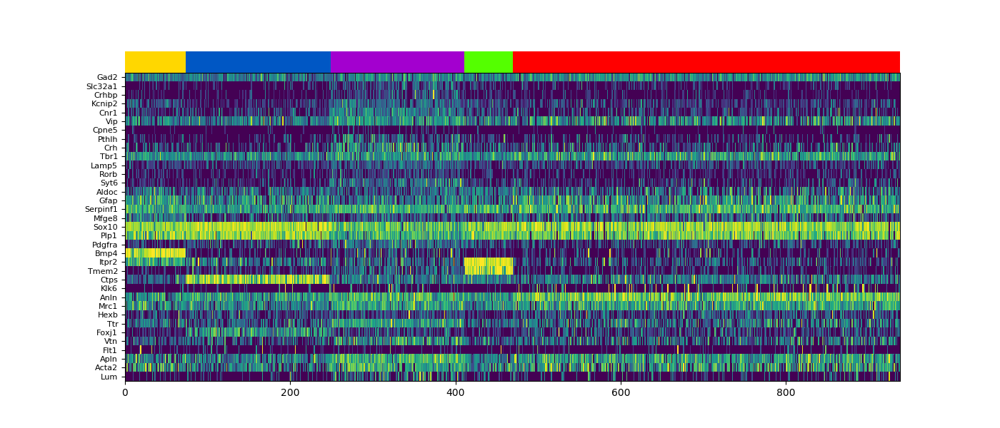

(35, 938)
938


In [305]:
cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_log_major3, ac_it_3_1)
heat_map(df_fish_log_major3, labels_a)

<IPython.core.display.Javascript object>


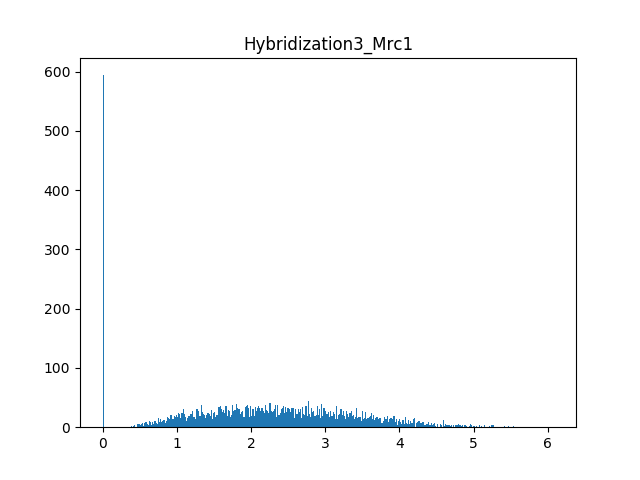

In [293]:
plt.figure()
gene= 26
plt.hist(df_fish_log.loc[gene_sort_fish[gene]].values, bins=400 )
plt.title(gene_sort_fish[gene])


In [151]:
df_fish.loc['Hybridization6_Vip'].values

array([13,  1,  2, ...,  3,  6,  1])

In [ ]:
#Cluster in 2
#check binaryzation of markers in clusters
#If binary:
    #stop
#If not:
    #repeat

In [380]:
df_fish_log_major3.head(3) 

,1124,1149,994,2872,5434,4234,2878,1118,2913,3230,...,1135,3075,1024,2314,1101,2808,3251,2757,1228,1234
Hybridization2_Gad2,2.350843,3.315216,2.357352,1.457305,1.641817,2.590797,4.300607,3.47381,2.130686,2.404172,...,1.985222,4.061251,3.304176,3.728168,3.052251,0.000000,1.858175,1.967137,2.286848,3.659886
Hybridization12_Slc32a1,1.118877,0.000000,0.000000,0.000000,0.771346,1.173817,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.558438,0.915535,0.000000,2.769736,0.000000,0.000000
Hybridization10_Crhbp,1.118877,1.695280,1.247784,1.457305,2.389890,0.000000,0.000000,0.00000,1.701699,0.000000,...,0.000000,0.000000,0.670702,0.000000,1.558438,0.915535,0.000000,0.000000,0.000000,0.000000


In [445]:
def cluster_binarity(df, labels, cluster_of_interest, cutoff_expression, cutoff_percentage):
    """
    Calculates the percentage of cells, of a given cluster_of_interest in a df, 
    that have an expression above the cutoff_expression. It returns a pandas 
    Series with the percentages and it returns the names of the genes that have
    a percentage higher than the cutoff_percentage.
    Input:
    `df`(pandas dataframe): df of the cells that were clusterd.
    `labels`(numpy array): Cluster labels of the clustering, in same order as df.
    `cluster_of_interest`(int): Cluster of interest from the labels.
    `cutoff_expression`(float): used to make a binarization and is the same for
        all genes. Data normalization is very important!
    `cutoff_percentage`(float): Percentage of cells that need to be 'positive'
        in the cluster. 
    Returns:
    *Pandas series with the percentages for all genes
    *Names of genes with a percentage higher than the cutoff_percentage
    
    """
    filt = labels == cluster_of_interest
    df = df.loc[:,filt]
    
    #Calculate percentage of cells that are above the cutoff
    positive = (df[df>cutoff_expression].T.count() / df.shape[1]) * 100
    positive_genes = [positive.index[i] for i,n in enumerate(positive) if n>cutoff_percentage]
    return positive, positive_genes

qq = cluster_binarity(df_fish_log_major3, labels_a, 4, 3, 80)

for i in range(5):
    print(cluster_binarity(df_fish_log_major3, labels_a, i, 3, 80)[1])
    
type(qq[0])

['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization7_Ctps']
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Bmp4']
['Hybridization7_Sox10']
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Itpr2', 'Hybridization11_Tmem2']


pandas.core.series.Series

TypeError: index() takes at least 1 argument (0 given)

## Machine learning

In [581]:
# import model
from sklearn.linear_model import LogisticRegressionCV
from sklearn.cross_validation import StratifiedShuffleSplit

In [597]:
X_sc = df_sc_cort_olig.values.astype(np.float64).T
    #Normalize
X_sc_norm = X_sc.sum(0).mean() * (X_sc/X_sc.sum(0))
    #Log transform
X_sc_log = np.log2(X_sc_norm+1)

In [888]:
mean_expression_sc =  df_sc_cort_olig.loc[gene_sort,:].T.mean()
df_sc_fc = df_sc_cort_olig.divide(mean_expression_sc, axis='rows')
X_sc_fc = df_sc_fc.values.astype(np.float64).T

In [891]:
classesnames = pd.Series(sc_cell_label)[df_sc_cort_olig.columns].values
classes, y = np.unique(classesnames, return_inverse=True)
class_labels = dict(zip(range(len(classes)), classes))

In [894]:
# instantiate
#Optimze parameters (~20min 6cores)
logreg = LogisticRegressionCV(cv=StratifiedShuffleSplit(y, test_size=.25, n_iter=30, random_state=24,),
                             Cs=np.logspace(0.4, 0.8, 20,base=10), multi_class='multinomial',fit_intercept=False,
                             refit=True, solver='newton-cg', n_jobs=6)
logreg.fit(X_sc_fc, y)

LogisticRegressionCV(Cs=array([ 2.51189,  2.63665,  2.76761,  2.90508,  3.04937,  3.20083,
        3.35982,  3.5267 ,  3.70187,  3.88574,  4.07874,  4.28133,
        4.49398,  4.7172 ,  4.9515 ,  5.19744,  5.45559,  5.72657,
        6.01101,  6.30957]),
           class_weight=None,
           cv=StratifiedShuffleSplit(labels=[11 11 ..., 28 28], n_iter=30, test_size=0.25, random_state=24),
           dual=False, fit_intercept=False, intercept_scaling=1.0,
           max_iter=100, multi_class='multinomial', n_jobs=6, penalty='l2',
           random_state=None, refit=True, scoring=None, solver='newton-cg',
           tol=0.0001, verbose=0)

On X_sc_log dataset:
logreg.Cs = array([ 2.51188643,  2.6366509 ,  2.76761237,  2.90507865,  3.04937283,
        3.20083405,  3.35981829,  3.52669921,  3.70186906,  3.88573952,
        4.07874276,  4.2813324 ,  4.49398459,  4.71719914,  4.95150067,
        5.19743987,  5.45559478,  5.72657215,  6.01100886,  6.30957344])

In [895]:
logreg.Cs

array([ 2.51188643,  2.6366509 ,  2.76761237,  2.90507865,  3.04937283,
        3.20083405,  3.35981829,  3.52669921,  3.70186906,  3.88573952,
        4.07874276,  4.2813324 ,  4.49398459,  4.71719914,  4.95150067,
        5.19743987,  5.45559478,  5.72657215,  6.01100886,  6.30957344])

In [897]:
#Predict Identitiy 
y_pred = logreg.predict(X_fc.T)

In [900]:
Counter(y_pred)

Counter({0: 2,
         1: 4,
         2: 479,
         3: 2380,
         4: 16,
         6: 21,
         7: 12,
         9: 4,
         11: 3,
         12: 1,
         14: 1,
         18: 13,
         19: 2,
         20: 25,
         21: 1,
         22: 8,
         23: 2,
         24: 2,
         25: 9,
         26: 4,
         27: 851,
         28: 157,
         29: 14,
         30: 202,
         31: 443,
         32: 639,
         34: 1,
         36: 79,
         37: 60,
         38: 164,
         41: 1,
         43: 378,
         44: 12,
         45: 1,
         48: 10,
         51: 1,
         52: 34})

In [898]:
cell_label_pred = dict(zip(df_fish.columns, y_pred))

## Cluster visualization

Generated labels, df_sort, df_sort_log, df_sort_fc


<IPython.core.display.Javascript object>


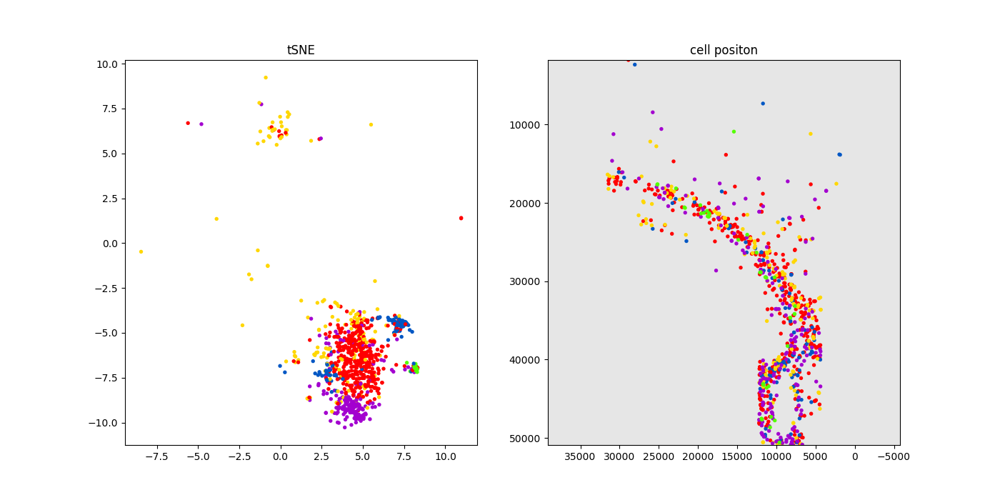

938


In [261]:

def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to get
    the names of colums and rows)
    `model`(obj): Clustering object
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a

def sort_df(df, labels_a, row_sort=True, sorted_row_names=gene_sort_fish):
    """
    Sort the dataframe columns based on the cluster labels (additional row sort is optional).
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (or a df
        that has the EXACT same order)
    `cluster_model`: Results of the clustering
    `row_sort`(bool): If True it will sort the rows of the dataframe, acording to the probided list
    `sorted_row_names`(list): List of row names. Default = gene_sort_fish
    
    """
    #Sort the dataframe with the new clusters
    #df_sort = pd.DataFrame(data=X, columns=df_fish.columns, index=df_fish.index)
    df_sort = df
    #labels_a = cluster_model.labels_ #Array of cell labels
    new_column_order = df_sort.columns[labels_a.argsort()]
    if row_sort == True:
        df_sort = df_sort.loc[sorted_row_names,new_column_order]
    else:
        df_sort = df_sort.loc[:,new_column_order]
    return df_sort
    

def sort_dataset_df(data, df, labels_a):# , cluster_model):
    """
    Sort a dataset based on the cluster labels. The data can be a normalized 
    np array. 
    Input:
    `data`(np array): Any normalized array, in the EXACT same order as the df on
        which the clustering algoritm ran.
    `df`: Panda's dataframe that has been used for the clustering. (used to get
        the names of colums and rows)
    Uses df_fish as basis.
    #`cluster_model`: Results of the clustering
    
    """    
    #Filter the datasetet to use the cells in the df
    data_filt = np.zeros((len(df.index), len(df.columns)))
    for i, n in enumerate(df.columns):
        #Assumes that data and df_fish are in the same format
        data_filt[:,i] = data[:,df_fish.columns.get_loc(n)]
    
    df_sort = pd.DataFrame(data=data_filt, columns=df.columns, index=df.index)
    new_column_order = df_sort.columns[labels_a.argsort()]
    
    df_sort = df_sort.loc[gene_sort_fish,new_column_order]
    return df_sort

def plot_labels(df, labels_a, standalone=True):
    if standalone == True:
        plt.figure(figsize=(10,10))
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    print(len(points))
    plt.scatter(points[:,0], points[:,1],c=plt.cm.prism(labels_a/max(labels_a)), lw=0, alpha=1, s=15)

def plot_cells_pos_labels(labels_a):
    
    coord_df_sort = sort_df(coord_df.loc[:,cellID], labels_a, row_sort=False)
    color_labels_sort =plt.cm.prism(np.sort(labels_a)/max(np.sort(labels_a)))    
    plot_cell_pos(coord_df_sort, cell_ids=None, color=color_labels_sort, s=15, standalone=False, mode='tsne')
    
    
    

def tSNE_and_pos(df, labels_a, save=False):
    """
    Plot the tSNE and cell positions with the cluster colors
    
    """
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14,7))
    plt.sca(axes[0])
    plot_labels(df, labels_a, standalone=False)
    plt.title('tSNE')
    plt.sca(axes[1])
    plot_cells_pos_labels(labels_a)
    plt.title('cell positon')
    if save == True:
        plt.savefig('Cluster_tSNE_and_Position.png', dpi=600)

    #ONE STEP CLUSTERING
    
    
    
    
model = ac_it_3_1
df_used = df_fish_log_major3
cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_used, model)

    #TWO STEP CLUSTERING
#cell_labels, label_cells, df_used, cellID, labels, labels_a = combine_sub_clusters([ac_major0_5, ac_major1_1, ac_major2_10, ac_major3_5, ac_major4_12, ac_major5_2], 
#                     [df_fish_log_major0, df_fish_log_major1, df_fish_log_major2, df_fish_log_major3, df_fish_log_major4, df_fish_log_major5])


df_sort = sort_df(df_used.loc[:,], labels_a)
df_sort_count = sort_dataset_df(X, df_used, labels_a)
df_sort_norm = sort_dataset_df(X_norm, df_used, labels_a)
df_sort_log = sort_dataset_df(X_log, df_used, labels_a)
df_sort_fc = sort_dataset_df(X_fc, df_used, labels_a)
print('Generated labels, df_sort, df_sort_log, df_sort_fc')
tSNE_and_pos(df_used, labels_a, save=False)


<IPython.core.display.Javascript object>


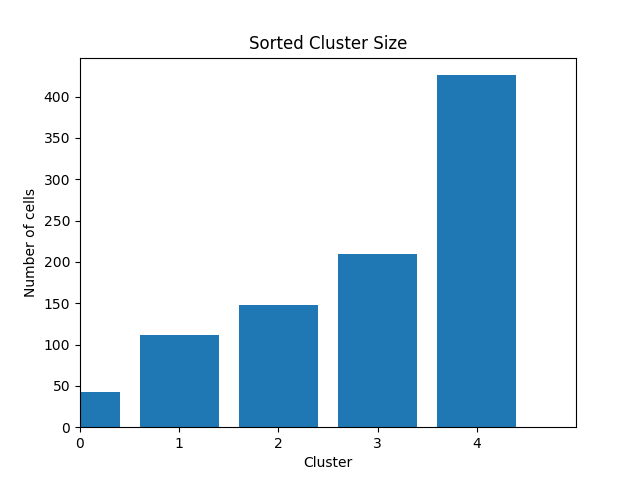

In [255]:
def plot_cluster_size(labels): 
    plt.figure()
    cluster_size = Counter(labels)
    n_cells = np.array(list(cluster_size.values()))
    n_cells = np.sort(n_cells)
    left = np.arange(len(cluster_size))
    plt.bar(left, n_cells)
    plt.xticks(left)
    plt.xlabel(np.argsort(list(cluster_size.values())))
    plt.xlim(0,len(cluster_size))
    plt.title('Sorted Cluster Size')
    plt.xlabel('Cluster')
    plt.ylabel('Number of cells')

plot_cluster_size(labels)

<IPython.core.display.Javascript object>


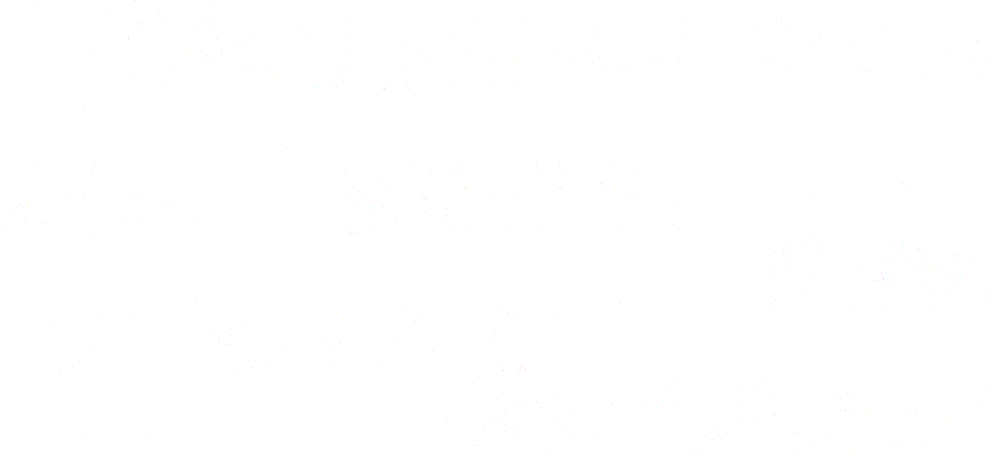

In [640]:
#Backup version heat map
data = df_sort #_log
save = False


fig, axHM = plt.subplots(figsize=(22,10))
z = data.values
z = z/np.percentile(z, 99, 1)[:,None]
axHM.pcolor(z,cmap='viridis', vmax=1)

plt.yticks(np.arange(0.5, len(data.index), 1), data.index)
plt.gca().invert_yaxis()
plt.xlim(xmax=len(data.columns))

divider = make_axes_locatable(axHM)
axLabel = divider.append_axes("top", .5, pad=0, sharex=axHM)

labels_sort = np.sort(labels_a)
axLabel.pcolor(labels_sort[None,:]/labels_sort.max(), cmap='jet')
axLabel.set_xlim(xmax=len(data.columns))
axLabel.axis('off')

if save == True:
    plt.savefig('/home/lars/storage/Documents/Cortex_FISH/Heatmap_{}clusters_counts.png'.format(len(np.unique(labels_a))), dpi=600)

In [246]:
def mean_expression(df):
    """
    Make dataframe with mean expression
    
    """
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index) #np.unique(labels_a))

    for l in np.unique(labels_a):
        filt = np.sort(labels) == l
        mean = np.array(df.loc[:,filt].T.mean())
        #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
        if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
            df_count_average[l] = mean
    return df_count_average

#df_count_average = mean_expression(df_sort)

# Heat map cells

DF used for plot: df_fish_log
Order of clusters: [4, 3, 0, 1, 2]


<IPython.core.display.Javascript object>


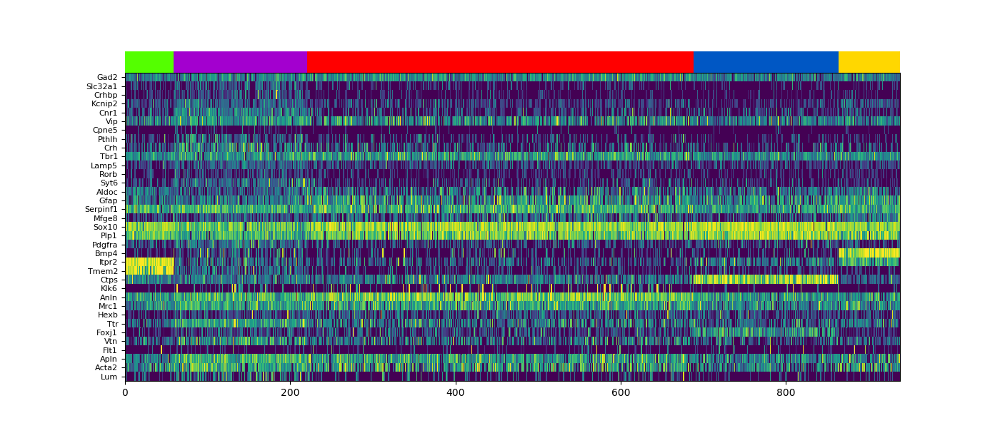

(35, 938)
938


In [444]:
#Choose the count or log-corrected dataset
#df_used is now the log corrected dataset!!!!


def heat_map(df, labels, sort=None, save=False):
    """
    Plot heat_map of a sorted dataframe
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('DF used for plot: {}'.format(df_input_name))
    
    if sort == None:
        #Make df with count averages per cluster
        df_count_average = mean_expression(df)
        #Make optimal sort on average expression of each cluster
        #Transpose, otherwise you are doing it on genes instead of clusters
        D = pdist(df_count_average.T, 'cityblock') #Working well: 'correlation', 'cityblock', 'seuclidean', 'canberra', 'cosine'
        Z = linkage(D, 'ward')
        optimal_Z = optimal_leaf_ordering(Z, D)
        optimal_o = polo.polo.leaves_list(optimal_Z) 
        #In case some clusters are missing
        optimal_order = []
        for i in optimal_o:
            optimal_order.append(df_count_average.columns[i])
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = []
    for i in optimal_order:
        optimal_sort_cells.extend(label_cells[i])
    
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = []
    for i in optimal_sort_cells:
        optimal_sort_labels.append(cell_labels[i])
    
    fig, axHM = plt.subplots(figsize=(14,6))
    #z = df.loc[:,optimal_sort_cells].values
    #z = z/np.percentile(z, 99.5, 1)[:,None]
    
    df_full = df_fish_log
    z = df_full.values
    z = z/np.percentile(z, 99.5, 1)[:,None]
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells].values
    print(z.shape)
    
    axHM.pcolor(z, cmap='viridis', vmax=1)

    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    print(len(labels))
    plt.title(df_input_name)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)

    optimal_sort_labels = np.array(optimal_sort_labels)
    axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='prism')
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')

    if save == True:
        plt.savefig('/home/lars/storage/Documents/Cortex_FISH/Heatmap_{}clusters_{}.png'.format(len(np.unique(labels_a)), df_input_name), dpi=600)

heat_map(df_fish_log, labels_a, sort=None, save=False) 


In [244]:
df_fish_log

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,5162,532,3607,3251,7173,2757,1228,1234,7797,4653
Hybridization2_Gad2,2.350843,2.749411,1.860798,2.123532,5.437820,2.484036,3.110786,0.986134,1.639835,3.315216,...,1.776074,3.130894,2.281200,1.858175,1.915080,1.967137,2.286848,3.659886,2.980374,3.386923
Hybridization12_Slc32a1,1.118877,1.281613,1.461907,1.228380,3.938513,0.000000,1.064344,0.000000,1.639835,0.000000,...,0.000000,1.197422,0.514986,0.000000,0.000000,2.769736,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crhbp,1.118877,0.000000,0.908706,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.695280,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization12_Kcnip2,0.665292,5.200757,5.487617,3.378687,2.295383,3.885946,4.512503,3.880900,3.071601,0.000000,...,4.968626,4.942318,4.830597,0.000000,1.915080,1.967137,0.000000,0.000000,2.980374,4.316263
Hybridization13_Cnr1,0.665292,1.281613,1.461907,3.378687,5.228146,3.885946,2.915963,2.975647,2.653233,1.695280,...,2.213314,2.286848,3.551455,1.209605,1.915080,2.423544,0.000000,0.000000,0.000000,2.623034
Hybridization6_Vip,3.107112,1.281613,1.461907,1.882086,4.360660,2.484036,2.095470,1.566445,1.041349,1.994409,...,0.000000,3.928489,0.893720,2.919096,1.254397,3.483455,3.130894,2.286848,3.885946,0.895360
Hybridization5_Cpne5,0.000000,2.749411,0.908706,0.741160,0.723754,0.000000,1.670132,3.296873,1.639835,0.000000,...,2.213314,0.000000,2.403214,0.000000,2.366538,0.000000,0.000000,0.000000,2.980374,3.883736
Hybridization8_Pthlh,1.118877,0.000000,0.000000,0.000000,2.635009,0.000000,1.064344,0.986134,0.000000,0.000000,...,0.000000,0.000000,0.514986,1.209605,0.000000,0.000000,0.000000,0.000000,1.721286,0.000000
Hybridization10_Crh,1.118877,0.000000,1.461907,0.000000,1.562875,0.000000,2.915963,0.986134,0.000000,1.317457,...,1.145654,1.197422,0.514986,1.209605,0.000000,0.000000,0.000000,2.286848,1.721286,0.000000
Hybridization1_Tbr1,3.107112,4.065414,4.676161,3.179229,2.475167,4.836309,4.024768,4.617116,2.653233,1.695280,...,6.131558,4.747705,3.603298,3.523807,2.987024,3.048722,0.000000,4.255965,5.404339,2.406092


In [ ]:
#Semi binarization backup
#Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.unique(labels_a))
    
    #Semi binarize count average (all below mean is set to 0)
    df_count_average_bin = df_count_average
    
    for index in df_count_average_bin.index: 
        binarized_mean = []
        for c in df_count_average_bin.loc[index]:
            if c < df_count_average_bin.loc[index].mean():
                c = 0
            binarized_mean.append(c)
        df_count_average_bin.loc[index] = binarized_mean

<IPython.core.display.Javascript object>


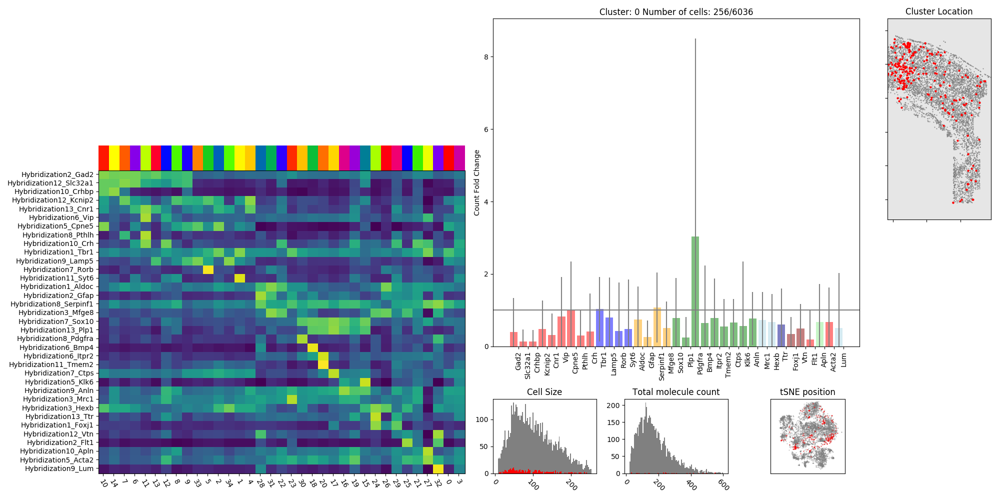

Swiched to using the Fold Change dataset for the expression plot: df_sort_log


/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:25: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


1


In [445]:
#Heat map clusters
def cluster_expression(df, cluster_of_interest, dataset='Count', sort=None):
    """
    Plot tSNE colored based on clusters and plot average gene experssion plot.
    
    """
    
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.unique(labels_a))
    
    for index in df_count_average.index: 
        mean_exp = []
        for c in df_count_average.loc[index]:
            if c < df_count_average.loc[index].mean():
                c = 0
            mean_exp.append(c)
        df_count_average.loc[index] = mean_exp


    for l in range(len(np.unique(labels_a))):
        filt = np.sort(labels) == l
        mean = np.array(df.loc[:,filt].T.mean())
        #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
        df_count_average[l] = mean
        
    #Make df with count averages per cluster
    df_count_average = mean_expression(df)
    
    if sort == None:
        #Transpose, otherwise you are doing it on genes instead of clusters
        D = pdist(df_count_average.T, 'cityblock') #Working well: 'correlation', 'cityblock', 'seuclidean', 'canberra', 'cosine'
        Z = linkage(D, 'ward')
        optimal_Z = optimal_leaf_ordering(Z, D)
        optimal_o = polo.polo.leaves_list(optimal_Z)    
        #In case some clusters are missing
        optimal_order = []
        for i in optimal_o:
            optimal_order.append(df_count_average.columns[i])
    else:
        optimal_order = sort
        
    #Plot averages heat map all clusters
    plt.figure(figsize=(20,10))
    
    if sort == None:
        ax0 = plt.subplot2grid((4,7), (0,0), rowspan=1, colspan=3)
        hierarchy.dendrogram(optimal_Z, truncate_mode='lastp', p=40, show_contracted=True, orientation='top')
    
    ax1 = plt.subplot2grid((4,7), (1,0), rowspan=3, colspan=3)
    #Sort according to the optimal order
    z = df_count_average.loc[:,optimal_order].values
    z = z/np.percentile(z, 99, 1)[:,None]
    ax1.pcolor(z)
    y_pos = np.arange(len(mean))
    x_pos = np.arange(len(df_count_average.columns))
    ax1.set_xlim(0, len(df_count_average.columns))
    ax1.set_xticks(x_pos+0.4)
    ax1.set_xticklabels(optimal_order, rotation=-60)
    ax1.set_yticks(y_pos+0.4)
    ax1.set_yticklabels(df.index)
    ax1.invert_yaxis()
    
    divider = make_axes_locatable(ax1)
    axLabel = divider.append_axes("top", .5, pad=0, sharex=ax1)
    optimal_order = np.array(optimal_order)
    axLabel.pcolor(optimal_order[None,:]/max(optimal_order), cmap='prism')
    axLabel.axis('off')

    #Cluster expression
    ax2 = plt.subplot2grid((4,7), (0,3), rowspan=3, colspan=3)
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
    'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green',
    'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
    if dataset.lower() == 'log':
        df = df_sort_log
        print('Swiched to using the Log normalized dataset for the expression plot: df_sort_log')
        y_label= '(Log-normalized)'
    elif dataset.lower() == 'fc':
            df = df_sort_fc
            print('Swiched to using the Fold Change dataset for the expression plot: df_sort_log')
            y_label= 'Fold Change'
    else:
        y_label=''
        
    filt = np.sort(labels) == cluster_of_interest
    ax2.bar(y_pos, np.array(df.loc[:,filt].T.mean()), color=gene_colors, alpha=0.5, yerr=np.array(np.std(df.loc[:,filt], axis=1)),error_kw=dict(ecolor='gray'))
    if dataset.lower() == 'fc':
        ax2.axhline(1, color='gray')
    top = ax2.get_ylim()[1]
    ax2.set_ylim(0,top)
    left_pos = np.arange(df.shape[0])
    ax2.set_xticks(left_pos+0.5)
    ax2.set_xticklabels(gene_sort, rotation='vertical')
    ax2.set_ylabel('Count {}'.format(y_label))
    ax2.set_title('Cluster: {} Number of cells: {}/{}'.format(cluster_of_interest, np.count_nonzero(filt==True), len(filt)))
    
    
    #Cluster location
    ax3 = plt.subplot2grid((4,7), (0,6), rowspan=2, colspan=1)
    filt = np.sort(labels) == cluster_of_interest
    plt.sca(ax3)
    plot_cell_pos(coord_df, cell_ids=list(df_sort.columns[filt]), cell_of_interest=None, s=2, standalone=False)
    for tl in ax3.get_xticklabels() + ax3.get_yticklabels():
                tl.set_visible(False)
    ax3.set_title('Cluster Location')

    #Cluster area
    ax4 = plt.subplot2grid((4,7), (3,3), rowspan=1, colspan=1)
    ax4.hist((np.sqrt(ds.CellArea)*0.065)**2, bins=100, range=[8,254], color='grey',  lw=0)
    cluster_cell_size = [cell_size[i] for i in label_cells[cluster_of_interest]]
    ax4.hist((np.sqrt(cluster_cell_size)*0.065)**2, bins=100, range=[8,254], color='red', lw=0)
    #ax4.hist((np.sqrt(ds.CellArea[np.where(filt)])*0.065)**2, bins=100, range=[8,254], color='red', lw=0) #ds is not sorted so it does not work
    plt.xticks(rotation=-45)
    ax4.set_title('Cell Size', fontsize=12)
    #ax4.set_xlabel('Square um')

    #Molecule count
    ax5 = plt.subplot2grid((4,7), (3,4), rowspan=1, colspan=1)
    ax5.hist(df_fish.sum(axis=0), bins=100, range=[20,600], color='grey', lw=0)
    ax5.hist(df_sort.loc[:,filt].sum(axis=1), bins=100, range=[20,600], color='red', lw=0)
    plt.xticks(rotation=-45)
    ax5.set_title('Total molecule count', fontsize=12)
    
    #tSNE
    ax6 = plt.subplot2grid((4,7), (3,5), rowspan=1, colspan=1)
    ax6.scatter(tSNE_points[:,0], tSNE_points[:,1], lw=0, s=2, alpha = 0.5, c = 'grey')
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    ax6.scatter(points[np.sort(labels_a) == cluster_of_interest][:,0], points[np.sort(labels_a) == cluster_of_interest][:,1], lw=0, s=3, alpha = 0.5, c = 'r') #input is df_sort so labels should be sorted as well
    print(len([labels_a == cluster_of_interest]) )
    ax6.set_aspect('equal')
    ax6.set_xlim(-12,12)
    ax6.set_ylim(-12,12)
    ax6.set_xticks([])
    ax6.set_yticks([])
    ax6.set_title('tSNE position', fontsize=12)
    
    #plt.subplots_adjust(wspace=0)
    plt.tight_layout()

    
    
cluster_expression(df_sort_log,0, 'fc', sort=cluster_sort)

<IPython.core.display.Javascript object>


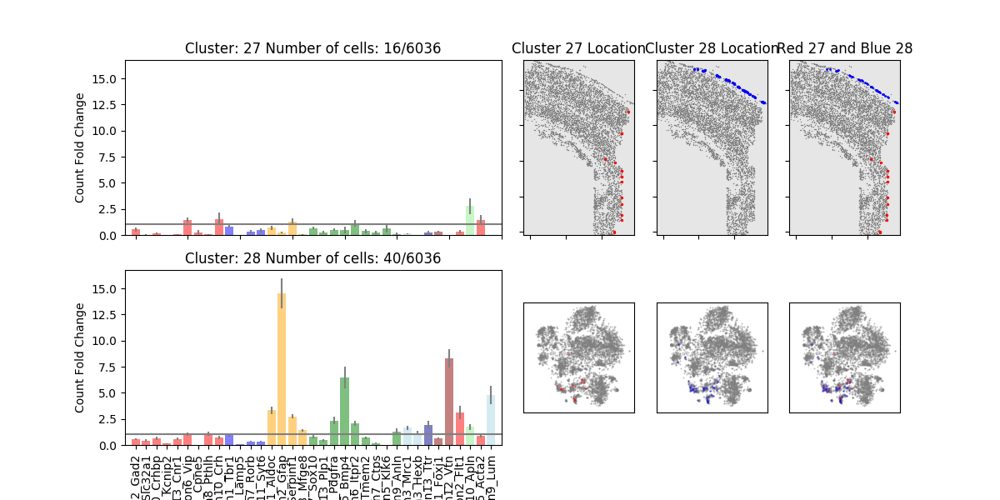

Swiched to using the Fold Change dataset for the expression plot: df_sort_log


/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:25: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


In [431]:
def cluster_compare(df, cluster_1, cluster_2, dataset='Count'):
    plt.figure(figsize=(12,6))

    #cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df, model)
        
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
    'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green',
    'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
    if dataset.lower() == 'log':
        df = df_sort_log
        print('Swiched to using the Log normalized dataset for the expression plot: df_sort_log')
        y_label= '(Log-normalized)'
    elif dataset.lower() == 'fc':
            df = df_sort_fc
            print('Swiched to using the Fold Change dataset for the expression plot: df_sort_log')
            y_label= 'Fold Change'
    else:
        y_label=''
    
    y_pos = np.arange(len(df.index))
    
    #Cluster 1
    ax1 = plt.subplot2grid((2,6), (0,0), rowspan=1, colspan=3)
    filt = np.sort(labels) == cluster_1
    n = sum(filt)
    ax1.bar(y_pos, np.array(df.loc[:,filt].T.mean()), color=gene_colors, alpha=0.5, yerr=np.array(np.std(df.loc[:,filt], axis=1))/np.sqrt(n),error_kw=dict(ecolor='gray'))
    if dataset.lower() == 'fc':
        ax1.axhline(1, color='gray')
    left_pos = np.arange(df.shape[0])
    ax1.set_xlim(-1, df.shape[0])
    ax1.set_xticklabels([])
    ax1.set_ylabel('Count {}'.format(y_label))
    ax1.set_title('Cluster: {} Number of cells: {}/{}'.format(cluster_1, np.count_nonzero(filt==True), len(filt)))
    
    #Cluster 2
    ax2 = plt.subplot2grid((2,6), (1,0), rowspan=1, colspan=3)
    filt = np.sort(labels) == cluster_2
    n = sum(filt)
    ax2.bar(y_pos, np.array(df.loc[:,filt].T.mean()), color=gene_colors, alpha=0.5, yerr=np.array(np.std(df.loc[:,filt], axis=1))/np.sqrt(n),error_kw=dict(ecolor='gray'))
    if dataset.lower() == 'fc':
        ax2.axhline(1, color='gray')
    left_pos = np.arange(df.shape[0])
    ax2.set_xticks(left_pos+0.0)
    ax2.set_xlim(-1, df.shape[0])
    ax2.set_xticklabels(df_sort.index, rotation='vertical')
    ax2.set_ylabel('Count {}'.format(y_label))
    ax2.set_title('Cluster: {} Number of cells: {}/{}'.format(cluster_2, np.count_nonzero(filt==True), len(filt)))
    
    #Scale y limit equally
    ax1.set_ylim(max([ax1.get_ylim(), ax2.get_ylim()]))
    ax2.set_ylim(max([ax1.get_ylim(), ax2.get_ylim()]))
    
    #Cluster 1 location
    ax3 = plt.subplot2grid((2,6), (0,3), rowspan=1, colspan=1)
    filt1 = np.sort(labels) == cluster_1
    plt.sca(ax3)
    plot_cell_pos(coord_df, cell_ids=list(df_sort.columns[filt1]), cell_of_interest=None, s=1, standalone=False)
    for tl in ax3.get_xticklabels() + ax3.get_yticklabels():
                tl.set_visible(False)
    ax3.set_title('Cluster {} Location'.format(cluster_1))
    
    #Cluster 2 location
    ax4 = plt.subplot2grid((2,6), (0,4), rowspan=1, colspan=1)
    filt2 = np.sort(labels) == cluster_2
    plt.sca(ax4)
    plot_cell_pos(coord_df, cell_ids=list(df_sort.columns[filt2]), cell_of_interest=None, s=1, standalone=False, color_highlight1='b')
    for tl in ax4.get_xticklabels() + ax4.get_yticklabels():
                tl.set_visible(False)
    ax4.set_title('Cluster {} Location'.format(cluster_2))
    
    #Clusters location
    ax5 = plt.subplot2grid((2,6), (0,5), rowspan=1, colspan=1)
    filt = np.sort(labels) == cluster_2
    plt.sca(ax5)
    plot_cell_pos(coord_df, cell_ids=list(df_sort.columns[filt1]), cell_of_interest=None, s=1, standalone=False)
    ax5.scatter(coord_df.loc[:,list(df_sort.columns[filt2])].loc['X'], coord_df.loc[:,list(df_sort.columns[filt2])].loc['Y'], s=1, color='b')
    for tl in ax5.get_xticklabels() + ax5.get_yticklabels():
                tl.set_visible(False)
    ax5.set_title('Red {} and Blue {}'.format(cluster_1,cluster_2))
    
    #Cluster 1 tSNE
    ax6 = plt.subplot2grid((2,6), (1,3), rowspan=1, colspan=1)
    ax6.scatter(tSNE_points[:,0], tSNE_points[:,1], lw=0, s=2, alpha = 0.5, c = 'grey')
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    ax6.scatter(points[labels_a == cluster_1][:,0], points[labels_a == cluster_1][:,1], lw=0, s=3, alpha = 0.5, c = 'r')
    ax6.set_aspect('equal')
    ax6.set_xlim(-12,12)
    ax6.set_ylim(-12,12)
    ax6.set_xticks([])
    ax6.set_yticks([])
    
    #Cluster 2 tSNE
    ax7 = plt.subplot2grid((2,6), (1,4), rowspan=1, colspan=1)
    ax7.scatter(tSNE_points[:,0], tSNE_points[:,1], lw=0, s=2, alpha = 0.5, c = 'grey')
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    ax7.scatter(points[labels_a == cluster_2][:,0], points[labels_a == cluster_2][:,1], lw=0, s=3, alpha = 0.5, c = 'b')
    ax7.set_aspect('equal')
    ax7.set_xlim(-12,12)
    ax7.set_ylim(-12,12)
    ax7.set_xticks([])
    ax7.set_yticks([])
    
    #Clusters tSNE
    ax8 = plt.subplot2grid((2,6), (1,5), rowspan=1, colspan=1)
    ax8.scatter(tSNE_points[:,0], tSNE_points[:,1], lw=0, s=2, alpha = 0.5, c = 'grey')
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    ax8.scatter(points[labels_a == cluster_1][:,0], points[labels_a == cluster_1][:,1], lw=0, s=3, alpha = 0.5, c = 'r')
    ax8.scatter(points[labels_a == cluster_2][:,0], points[labels_a == cluster_2][:,1], lw=0, s=3, alpha = 0.5, c = 'b')
    ax8.set_aspect('equal')
    ax8.set_xlim(-12,12)
    ax8.set_ylim(-12,12)
    ax8.set_xticks([])
    ax8.set_yticks([])
    
    
    
    
    
cluster_compare(df_sort, 27,28, dataset='fc')

# Spatial organization

In [1872]:
np.array(coord_df.loc[:,label_cells[0]].T)

array([[  7839.67237912,  45352.71924456],
       [  4539.96749334,  32271.79711363],
       [ 24544.46763224,  11099.71561713],
       [ 25755.50977725,   5042.51504846],
       [  6807.7688636 ,  20680.11165419],
       [  9582.65584624,  13769.99972145],
       [ 13450.47593725,   9700.73770274],
       [ 16006.55269908,   7286.61711224],
       [  9318.6289132 ,  19910.33231154],
       [ 26864.08794954,  11591.79378402],
       [ 20957.55620705,  11207.59311241],
       [ 30636.46207376,  11218.32066806],
       [ 20535.2567083 ,   3812.61221714],
       [ 11386.02322247,  26634.1981677 ],
       [ 13337.59643377,   9369.67594614],
       [ 28220.83430167,   9741.39386569],
       [  7930.18479777,  45474.54218968],
       [ 19124.24588684,   6919.18191084],
       [ 28048.62352898,   9005.08306919],
       [ 17598.71942935,  12555.25237772],
       [ 25800.31349896,   5151.23236623],
       [ 31441.17876434,  12709.13034899],
       [ 17356.1937201 ,  17941.76769287],
       [  6

## Cell type regionalization

### Ripley's K

In [1804]:
from astropy.stats import RipleysKEstimator

/home/lars/programs/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 50 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


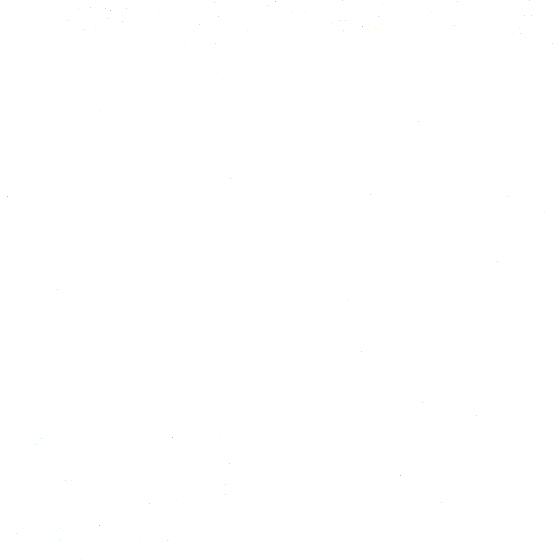

In [2003]:
#Choose a range for the radii to use for the Ripley's K
radius = 10000
plot_cell_pos(coord_df, cell_ids=None, cell_of_interest=None, s=10, standalone=True, mode='Highlight')
circle1 = plt.Circle((25000,35000), radius, lw=0, color='red', alpha=0.4)
circle2 = plt.Circle((10000,17000), radius, lw=0, color='red', alpha=0.4)
ax = plt.gca()
ax.add_artist(circle1)
ax.add_artist(circle2)
ax.set_title('Radius = {}'.format(radius))

In [1913]:
np.argmin(np.abs(np.linspace(1000,20000, 100) - 3000))

10

In [1910]:
np.linspace(1000,20000, 100)

array([  1000.        ,   1191.91919192,   1383.83838384,   1575.75757576,
         1767.67676768,   1959.5959596 ,   2151.51515152,   2343.43434343,
         2535.35353535,   2727.27272727,   2919.19191919,   3111.11111111,
         3303.03030303,   3494.94949495,   3686.86868687,   3878.78787879,
         4070.70707071,   4262.62626263,   4454.54545455,   4646.46464646,
         4838.38383838,   5030.3030303 ,   5222.22222222,   5414.14141414,
         5606.06060606,   5797.97979798,   5989.8989899 ,   6181.81818182,
         6373.73737374,   6565.65656566,   6757.57575758,   6949.49494949,
         7141.41414141,   7333.33333333,   7525.25252525,   7717.17171717,
         7909.09090909,   8101.01010101,   8292.92929293,   8484.84848485,
         8676.76767677,   8868.68686869,   9060.60606061,   9252.52525253,
         9444.44444444,   9636.36363636,   9828.28282828,  10020.2020202 ,
        10212.12121212,  10404.04040404,  10595.95959596,  10787.87878788,
        10979.7979798 ,  

In [ ]:
###

/home/lars/programs/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 50 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


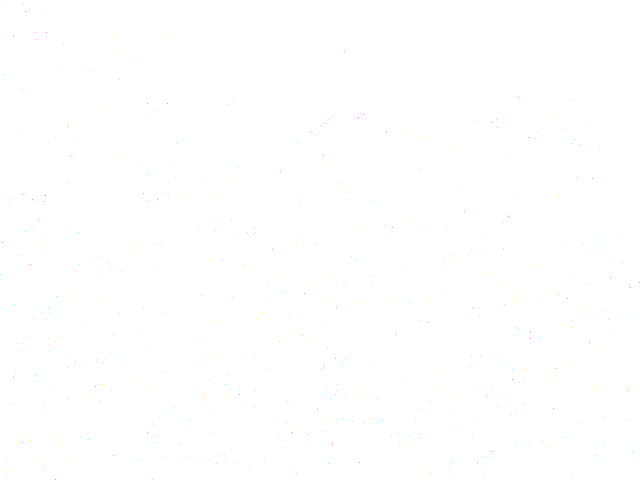

In [2004]:
x_min = coord_df.loc['X'].min()
x_max = coord_df.loc['X'].max()
y_min = coord_df.loc['Y'].min()
y_max = coord_df.loc['Y'].max()
area = ((x_max-x_min)*(y_max-y_min))
Kest = RipleysKEstimator(area, x_max, y_max, x_min, y_min)
radii = np.linspace(1000,20000, 100)

plt.figure()
colors = np.arange(0, 1, 1/len(np.unique(labels_a)))
cmap = matplotlib.cm.get_cmap('prism')

RK_3000 = []
RK_10000 = []
for i in np.sort(np.unique(labels_a)):
    estimate =  Kest(data=np.array(coord_df.loc[:,label_cells[i]].T), radii=radii, mode='none')
    RK_3000.append(estimate[np.argmin(np.abs(radii - 3000))]) #Get the estimate of the radii closest to 3000 and append list
    RK_10000.append(estimate[np.argmin(np.abs(radii - 10000))]) #Get the estimate of the radii closest to 10000 and append list
    plt.plot(radii, estimate, color=cmap(colors[i]))

plt.title("Ripley's K for different radii")
plt.xlabel('Radius in pixels')
    

/home/lars/programs/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 50 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


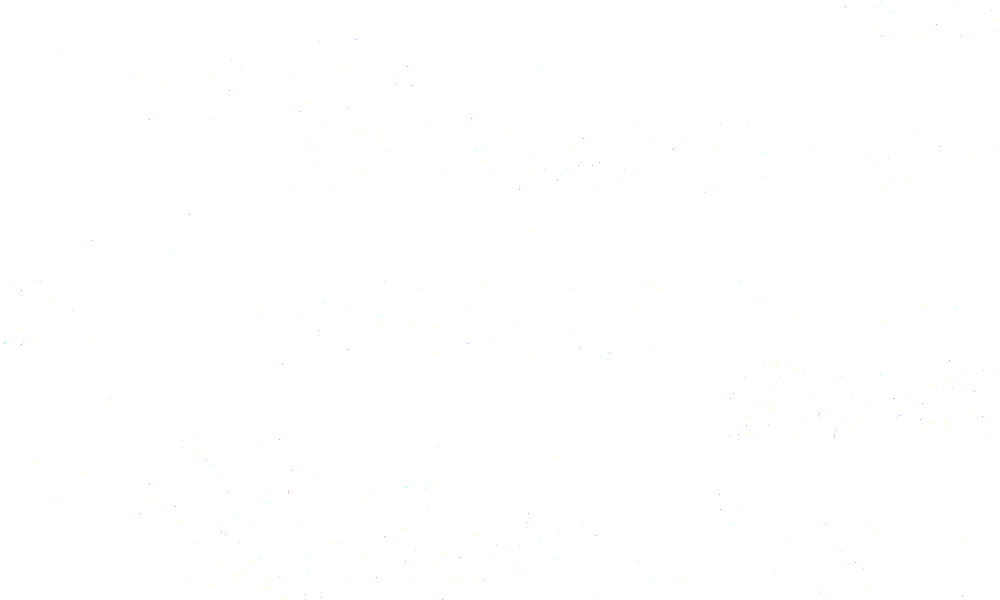

In [2006]:
plt.figure(figsize=(20,12))
n_clusters = len(np.unique(labels_a))
gs = plt.GridSpec(5, int(36/5) + (36 % 5 > 0))

for i, c in enumerate(np.argsort(RK_10000)[::-1]):
    plt.subplot(gs[i])
    filt = np.sort(labels) == c
    plot_cell_pos(coord_df, cell_ids=list(df_sort.columns[filt]), cell_of_interest=None, s=1, standalone=False, color_highlight1='r')
    ax = plt.gca()
    for tl in ax.get_xticklabels() + ax.get_yticklabels():
        tl.set_visible(False)
    #ax.set_title('Cluster {}'.format(c))
    ax.set_title(cluster_labels[c])

### Tissue regionaliztion 

In [1576]:
import pysal #Look into regionalization for clustering of areas of the tissue
http://pysal.readthedocs.io/en/latest/users/tutorials/region.html

In [ ]:
import clusterpy # Clustering the areas of the tissue
http://www.rise-group.org/risem/clusterpy/index.html

In [ ]:
pysal.

# Ordering of leaves

In [112]:
#Make df with count averages per cluster
df_count_average = pd.DataFrame(index=df_sort.index, columns=np.unique(labels_a))

#Semi binarize count average (all below mean is set to 0)
df_count_average_bin = df_count_average
for index in df_count_average_bin.index: 
    binarized_mean = []
    for c in df_count_average_bin.loc[index]:
        if c < df_count_average_bin.loc[index].mean():
            c = 0
        binarized_mean.append(c)
    df_count_average_bin.loc[index] = binarized_mean


for l in range(len(np.unique(labels_a))):
    filt = np.sort(labels) == l
    mean = np.array(df_sort.loc[:,filt].T.mean())
    #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
    df_count_average[l] = mean

#Transpose, otherwise you are doing it on genes instead of clusters
D = pdist(df_count_average.T, 'euclidean')
#On semi-binarized data # It does not really work
#D = pdist(df_count_average_bin.T, 'euclidean')
Z = linkage(D, 'ward')

optimal_Z = optimal_leaf_ordering(Z, D)

In [119]:
polo.polo.leaves_list(optimal_Z)

array([22,  0, 18, 11, 17, 23, 24, 16, 27,  6, 15, 20, 21,  8, 10, 13,  1,
        3, 28,  4,  5, 29,  7,  9, 14, 12, 25, 19,  2, 26], dtype=int32)

In [111]:
df_count_average.loc[:,list(polo.polo.leaves_list(optimal_Z))].head(5)

,22,0,18,11,17,23,24,16,27,6,...,5,29,7,9,14,12,25,19,2,26
Hybridization2_Gad2,47.103448,4.491438,4.307692,4.039604,3.762963,5.864407,5.668571,8.104938,9.664921,6.083032,...,4.853261,6.230769,6.728571,4.897638,8.437086,4.042105,2.573770,67.201550,55.076087,68.507538
Hybridization12_Slc32a1,18.043103,0.628425,1.467236,0.610561,0.651852,0.694915,0.400000,2.024691,0.633508,0.566787,...,0.423913,1.430769,0.321429,1.204724,3.662252,0.673684,0.262295,32.077519,24.744565,39.195980
Hybridization10_Crhbp,5.715517,0.354452,0.806268,0.310231,0.370370,0.559322,0.354286,2.759259,0.460733,0.306859,...,0.211957,1.230769,0.107143,0.779528,2.245033,0.652632,0.213115,43.069767,1.461957,14.733668
Hybridization8_Pthlh,1.060345,0.496575,0.940171,0.250825,0.844444,0.847458,0.337143,1.820988,0.523560,0.516245,...,0.298913,1.715385,0.164286,1.007874,2.006623,0.463158,0.704918,0.751938,4.500000,8.497487
Hybridization13_Cnr1,8.206897,3.421233,6.133903,5.419142,9.666667,1.627119,1.228571,4.697531,1.345550,1.353791,...,0.967391,4.653846,1.035714,2.204724,4.291391,1.326316,1.016393,6.302326,19.717391,6.869347


In [109]:
for index in df_count_average.index: 
    binarized_mean = []
    for c in df_count_average.loc[index]:
        if c < df_count_average.loc[index].mean():
            c = 0
        binarized_mean.append(c)
    df_count_average.loc[index] = binarized_mean

df_count_average

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
Hybridization2_Gad2,0.000000,0.000000,55.076087,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,47.103448,0.000000,0.000000,0.000000,68.507538,0.000000,22.659459,0.000000
Hybridization12_Slc32a1,0.000000,0.000000,24.744565,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,18.043103,0.000000,0.000000,0.000000,39.195980,0.000000,10.010811,0.000000
Hybridization10_Crhbp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,5.715517,0.000000,0.000000,0.000000,14.733668,0.000000,0.000000,0.000000
Hybridization8_Pthlh,0.000000,0.000000,4.500000,0.000000,3.117371,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.497487,0.000000,0.000000,1.715385
Hybridization13_Cnr1,0.000000,0.000000,19.717391,7.300412,6.600939,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,8.206897,0.000000,0.000000,0.000000,6.869347,0.000000,0.000000,4.653846
Hybridization6_Vip,0.000000,0.000000,16.771739,0.000000,4.305164,0.000000,4.216606,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,5.084746,4.497143,0.000000,0.000000,6.780105,4.848649,4.246154
Hybridization5_Cpne5,3.700342,2.724846,4.755435,0.000000,2.741784,2.777174,0.000000,0.000000,0.000000,0.000000,...,2.986111,3.280236,3.948276,0.000000,0.000000,0.000000,0.000000,0.000000,2.600000,0.000000
Hybridization10_Crh,0.000000,0.000000,8.364130,0.000000,3.422535,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.868852,0.000000,0.000000,1.902703,2.630769
Hybridization12_Kcnip2,33.664384,18.924025,19.516304,30.716049,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,18.416667,18.522124,16.370690,0.000000,0.000000,0.000000,58.070352,0.000000,18.940541,0.000000
Hybridization1_Tbr1,19.445205,0.000000,0.000000,0.000000,13.544601,14.625000,0.000000,14.164286,29.080153,0.000000,...,16.111111,30.064897,0.000000,0.000000,0.000000,0.000000,0.000000,14.146597,0.000000,0.000000


<IPython.core.display.Javascript object>


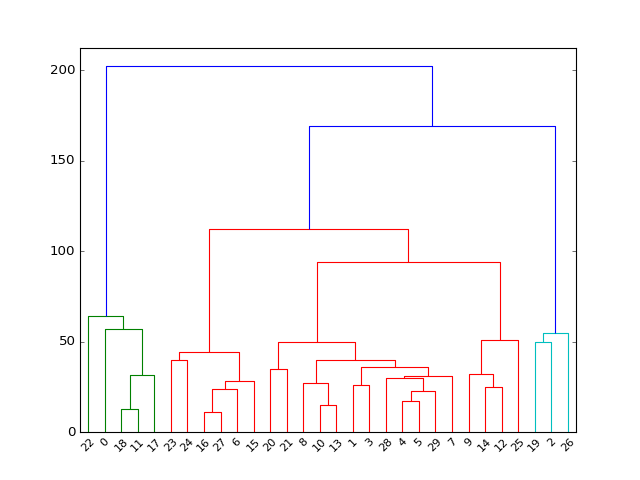

In [113]:
fig, ax = plt.subplots()
hierarchy.dendrogram(optimal_Z, truncate_mode='lastp', p=40, show_contracted=True, orientation='top', );

# Colors

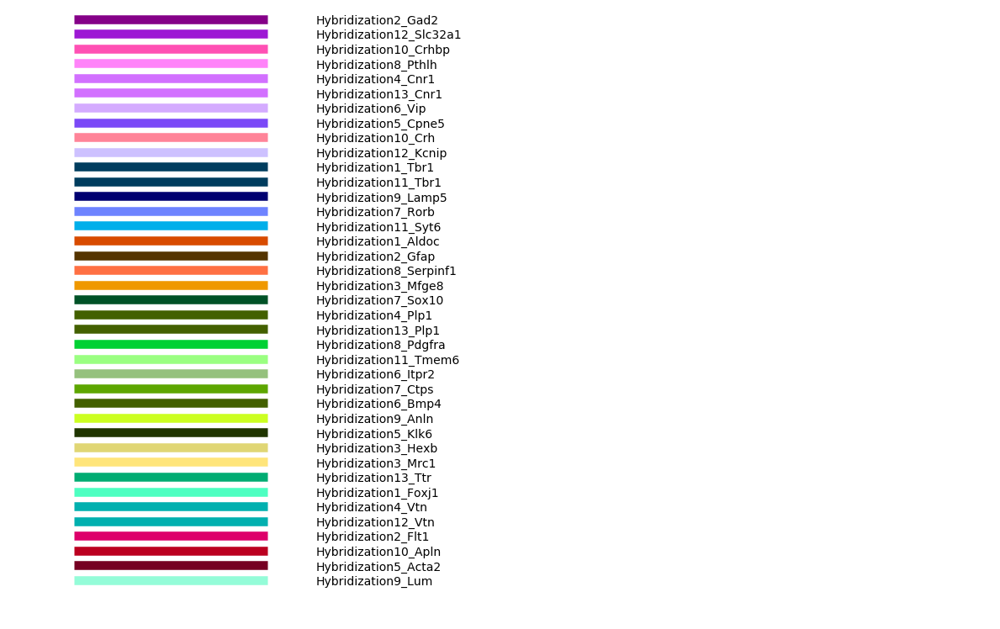

In [30]:
gene_color = [
'#850088',
'#9d19d4',
'#ff50b4',
'#ff83f9',
'#d270ff',
'#d270ff',
'#d4abff',
'#7b49f7',
'#ff8498',
'#cdc1ff',
'#003d5e',
'#003d5e',    
'#000070',
'#6e83ff',
'#01afea',
'#d84b00',
'#543400',
'#ff7043',
'#ef9800',
'#005227',
'#436000',
'#436000',
'#01d134',
'#9aff81',
'#95c17d',
'#5da600',
'#436000',
'#ccff21',
'#203500',
'#e0d674',
'#ffe57a',
'#00ac72',
'#4dffc1',
'#01b0af',
'#01b0af',
'#dd006a',
'#bb0020',
'#760022',
'#94fcd8']

gene_color_dict = dict(zip(gene_sort_fish, gene_color))

n = len(gene_sort_fish)
ncols = 1
nrows = n // ncols + 1

fig, ax = plt.subplots(figsize=(8*2, 5*2))

# Get height and width
X, Y = fig.get_dpi() * fig.get_size_inches()
h = Y / (nrows + 1)
w = X / ncols

for i, name in enumerate(gene_sort_fish):
    col = i % ncols
    row = i // ncols
    y = Y - (row * h) - h

    xi_line = w * (col + 0.05)
    xf_line = w * (col + 0.25)
    xi_text = w * (col + 0.3)

    ax.text(xi_text, y, name, fontsize=(h * 0.8),
            horizontalalignment='left',
            verticalalignment='center')

    ax.hlines(y + h * 0.1, xi_line, xf_line,
              color=gene_color_dict[name], linewidth=(h * 0.6))

ax.set_xlim(0, X)
ax.set_ylim(0, Y)
ax.set_axis_off()

fig.subplots_adjust(left=0, right=1,
                    top=1, bottom=0,
                    hspace=0, wspace=0)
plt.savefig('Gene_colors.svg')
plt.show()

In [20]:
type_color = {
    0:[8,11,135],
    1:[0,192,255],
    2:[0,119,0],
    3:[0,227,215],
    4:[0,141,111],
    5:[16,177,186],
    6:[255,110,215],
    7:[0,73,193],
    8:[63,118,241],
    9:[250,0,25],
    10:[255,99,28],
    11:[90,90,90],
    12:[0,130,235],
    13:[222,1,191],
    14:[236,64,242],
    15:[129,239,239],
    16:[68,133,35],
    17:[187,103,194],
    18:[0,143,193],
    19:[215,160,60],
    20:[181,64,242],
    21:[46,195,47],
    22:[105,222,103],
    23:[104,214,150],
    24:[95,0,159],
    25:[180,141,255],
    26:[36,155,104],
    27:[99,85,215],
    28:[255,254,187],
    29:[101,160,0]
}

def rgb_to_hex(red, green, blue):
    """Return color as #rrggbb for the given color values."""
    return '#%02x%02x%02x' % (red, green, blue)

#Convert the dictionary to HEX
type_color_hex = {}
for k in type_color:
    type_color_hex[k] = rgb_to_hex(type_color[k][0], type_color[k][1], type_color[k][2])


#Make label list with HEX values
label_colors_hex = []
for l in labels:
    hex_color = rgb_to_hex(type_color[l][0], type_color[l][1], type_color[l][2])
    #label_colors.append(type_color[l])
    label_colors_hex.append(hex_color)


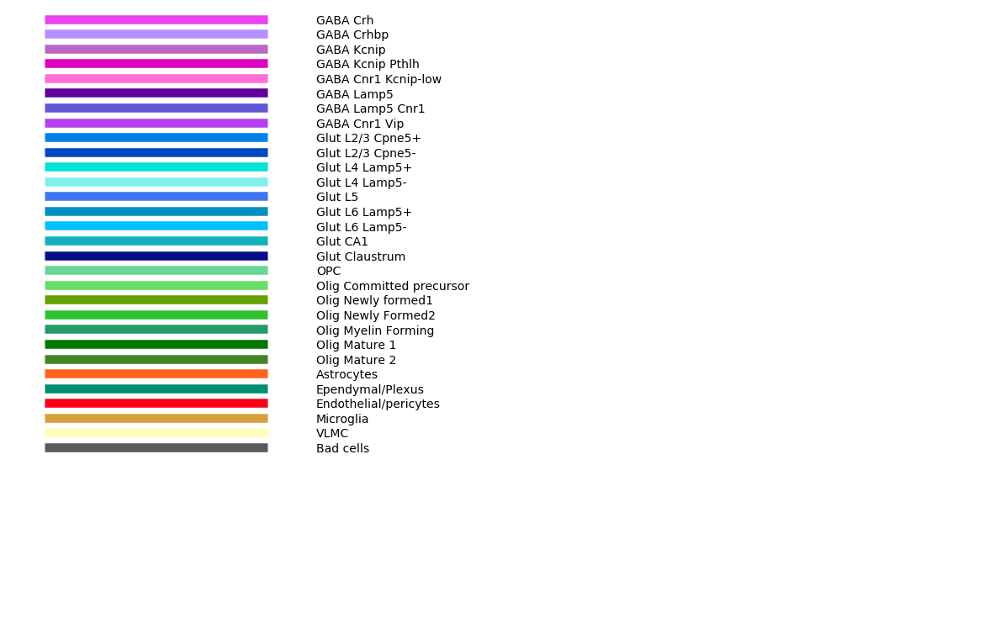

In [27]:
type_names = ['Glut Claustrum', 'Glut L6 Lamp5-', 'Olig Mature 1', 'Glut L4 Lamp5+', 'Ependymal/Plexus', 'Glut CA1', 'GABA Cnr1 Kcnip-low', 'Glut L2/3 Cpne5-',
             'Glut L5', 'Endothelial/pericytes', 'Astrocytes', 'Bad cells', 'Glut L2/3 Cpne5+', 'GABA Kcnip Pthlh', 'GABA Crh', 'Glut L4 Lamp5-', 
             'Olig Mature 2', 'GABA Kcnip', 'Glut L6 Lamp5+', 'Microglia', 'GABA Cnr1 Vip', 'Olig Newly Formed2', 'Olig Committed precursor', 'OPC', 
             'GABA Lamp5', 'GABA Crhbp', 'Olig Myelin Forming', 'GABA Lamp5 Cnr1', 'VLMC', 'Olig Newly formed1']



type_names_sort = ['GABA Crh','GABA Crhbp','GABA Kcnip','GABA Kcnip Pthlh', 'GABA Cnr1 Kcnip-low','GABA Lamp5','GABA Lamp5 Cnr1','GABA Cnr1 Vip', 
    'Glut L2/3 Cpne5+', 'Glut L2/3 Cpne5-', 'Glut L4 Lamp5+','Glut L4 Lamp5-', 'Glut L5', 'Glut L6 Lamp5+', 'Glut L6 Lamp5-', 'Glut CA1', 'Glut Claustrum',
                   'OPC','Olig Committed precursor', 'Olig Newly formed1','Olig Newly Formed2','Olig Myelin Forming','Olig Mature 1','Olig Mature 2',
                   'Astrocytes',
                   'Ependymal/Plexus', 'Endothelial/pericytes', 'Microglia','VLMC', 'Bad cells']

type_names_labels =dict(zip(type_names, list(type_color.keys())))



n = len(gene_sort_fish)
ncols = 1
nrows = n // ncols + 1

fig, ax = plt.subplots(figsize=(8*2, 5*2))

# Get height and width
X, Y = fig.get_dpi() * fig.get_size_inches()
h = Y / (nrows + 1)
w = X / ncols

for i, name in enumerate(type_names_sort):
    col = i % ncols
    row = i // ncols
    y = Y - (row * h) - h

    xi_line = w * (col + 0.02)
    xf_line = w * (col + 0.25)
    xi_text = w * (col + 0.3)

    ax.text(xi_text, y, type_names_sort[i], fontsize=(h * 0.8),
            horizontalalignment='left',
            verticalalignment='center')

    ax.hlines(y + h * 0.1, xi_line, xf_line,
              color=type_color_hex[type_names_labels[name]], linewidth=(h * 0.6))

ax.set_xlim(0, X)
ax.set_ylim(0, Y)
ax.set_axis_off()

fig.subplots_adjust(left=0, right=1,
                    top=1, bottom=0,
                    hspace=0, wspace=0)
plt.savefig('Type_labels_30clusters.svg')
plt.show()


In [29]:
type_names_sort

['GABA Crh',
 'GABA Crhbp',
 'GABA Kcnip',
 'GABA Kcnip Pthlh',
 'GABA Cnr1 Kcnip-low',
 'GABA Lamp5',
 'GABA Lamp5 Cnr1',
 'GABA Cnr1 Vip',
 'Glut L2/3 Cpne5+',
 'Glut L2/3 Cpne5-',
 'Glut L4 Lamp5+',
 'Glut L4 Lamp5-',
 'Glut L5',
 'Glut L6 Lamp5+',
 'Glut L6 Lamp5-',
 'Glut CA1',
 'Glut Claustrum',
 'OPC',
 'Olig Committed precursor',
 'Olig Newly formed1',
 'Olig Newly Formed2',
 'Olig Myelin Forming',
 'Olig Mature 1',
 'Olig Mature 2',
 'Astrocytes',
 'Ependymal/Plexus',
 'Endothelial/pericytes',
 'Microglia',
 'VLMC',
 'Bad cells']

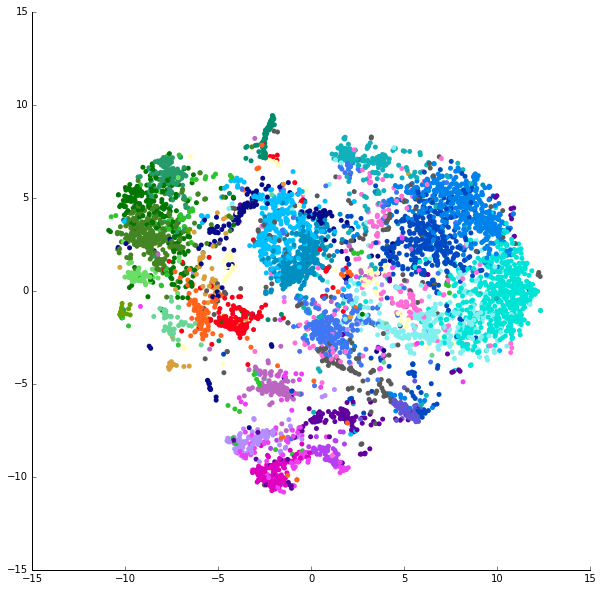

In [66]:
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(tSNE_points[:,0], tSNE_points[:,1],c=label_colors_hex,lw=0, alpha=1, s=25)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

fig.savefig('tSNE_30clusters_colored_600dpi.png', dpi=600)

# Size normalization
Data normalized by cell area instead of max count

In [72]:
#Build cell_area dictionary of all included cells
cell_area = {}
for i in df_fish.columns:
    cell_area[i] = ds.col_attrs['CellArea'][list(ds.col_attrs['CellID']).index(i)]

In [154]:
X = df_fish.values.astype(np.float64)
#X_norm = X.sum(0).mean() * (X/X.sum(0))
X_norm_size = X * (median / np.array(list(cell_area.values())))
X_log_size = np.log2(X_norm_size+1)
X_log_size

array([[ 2.61000365,  4.23471813,  4.70249782, ...,  3.59532672,
         6.33384541,  3.19885493],
       [ 3.99299139,  0.        ,  3.1775423 , ...,  1.36948783,
         3.3003446 ,  3.97527549],
       [ 0.        ,  0.        ,  0.        , ...,  1.36948783,
         0.        ,  2.91568089],
       ..., 
       [ 0.47788072,  1.38990863,  1.47941969, ...,  0.        ,
         0.        ,  3.4354626 ],
       [ 0.8362414 ,  0.        ,  0.        , ...,  0.84148539,
         3.83564745,  0.        ],
       [ 2.30069872,  3.18635859,  1.88070444, ...,  4.76195038,
         4.22519905,  1.39860166]])

In [155]:
ac30_Nsize = AgglomerativeClustering(n_clusters=30).fit(X_log_size.T)
#Does not make the clustering better. But size normalization might not be correct

# Violin

In [422]:
def LB_violin(data_frame, label,types, probes, save=False):
    '''
    Function to plot violin plots from single cell gene expression data. 
    Input: 
        -Data frame with cells as columns and genes as rows. 
        -Dictionary coupling cellID with their cell type
        -List of types to plot.
        -List of genes to plot.
        -Set save to True, to save the plot as a .SVG with transparent background.
    Author: Lars Borm            
    '''
    
    #nrows = shape(data_frame)[0]
    nrows = len(probes)
    figsize_x = 0.5 * len(types)
    figsize_y = 1 * len(probes)
    fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(figsize_x, figsize_y), sharex=True)
    
    #iterate through rows/genes of the data
    for n in range(nrows):
        #Make list of n lists, where n = number of types
        data =[[] for item in types]
        
        #Fill the lists
        gene_name = probes[n]
        for cell in data_frame:
            cell_type = label[cell]
            if (cell_type in types) == True: 
                data[types.index(cell_type)].append(data_frame.loc[gene_name, cell])
        
        #Set figure parameters
        sns.set_style("white")
        sns.violinplot(data=data, palette="Set2", bw=0.2, cut=0, linewidth=1, scale="width", ax = axes[n], spines='left')
        sns.despine(top=True, right=True)
    
    for i, ax in enumerate(axes):

        #ax.yaxis.grid(True)
        ax.set_ylabel(probes[i], rotation='horizontal', size='large', horizontalalignment = 'right')

        #set the limits between zero and the end
        start, end = ax.get_ylim()
        ax.set_ylim(0, end)
        ax.set_yticks(np.arange(end/2,end+1, end/2))
        
    # add x-tick labels
    plt.xticks(rotation=-70, size='large') 
    plt.setp(axes,xticklabels=types)

    if save == True:
        name = input('Will save as transparent SVG. Carefull with overwriting.\nSpecify name: ')
        name = name + '.svg'
        plt.savefig(name, transparent = True)
        
    plt.show()

In [423]:
list(np.unique(labels))

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27]

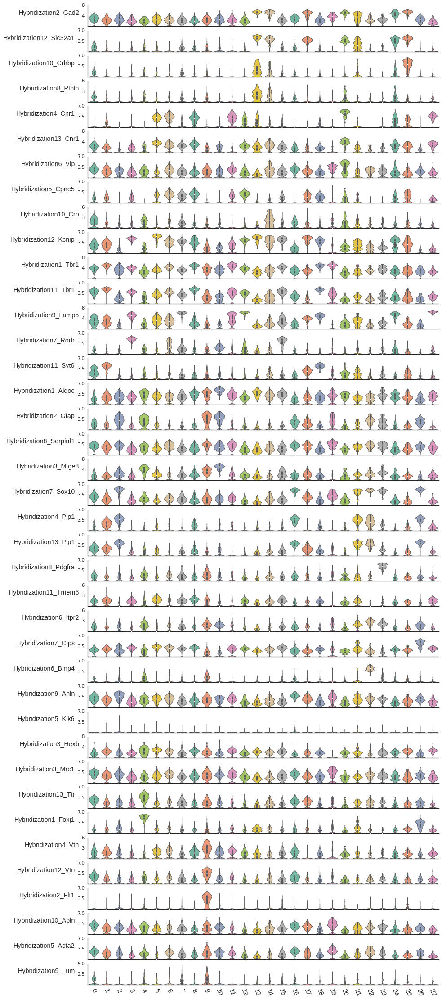

In [426]:
import seaborn as sns
LB_violin(df_log, cell_labels, list(np.unique(labels)), gene_sort_fish)